# Introduction 

In [849]:
getwd()
setwd("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9")

[1] "/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/Run210706L2/COMBINE_CALLV/CW_mgatk_Full/final"

This note will perform more deeply question driven analysis, and potentially new algorithm development
<br>Only focus on Donor4

# Configure

In [1]:
source("activate.R")
Sys.setenv(RENV_PATHS_CACHE = "/lab/solexa_weissman/cweng/Packages/R/x86_64-pc-linux-gnu-library/4.1-focal") 
renv::paths$cache()
.libPaths()


[1] "/lab/solexa_weissman/cweng/Packages/R/x86_64-pc-linux-gnu-library/4.1-focal/v5/R-4.1/x86_64-pc-linux-gnu"

[1] "/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/renv/library/R-4.1/x86_64-pc-linux-gnu"
[2] "/tmp/RtmpBEkKwr/renv-system-library"

In [3]:
#detach("package:EZsinglecell2")
install.packages("/lab/solexa_weissman/cweng/Packages/MyMultiome/Helpers/EZsinglecell2")
library(EZsinglecell2)

#detach("package:scMitoTracing",unload=T)
install.packages("/lab/solexa_weissman/cweng/Packages/scMitoTracing")
library(scMitoTracing)
library(gridExtra)
library(BuenColors)
library(Seurat)
library(ggtree)
library(ggtreeExtra)
library(ggnewscale)
# ATAC_Wrapper

Installing EZsinglecell2 [0.0.0.9000] ...
	OK [built from source]
Installing scMitoTracing [0.0.0.9000] ...
	OK [built from source]


In [859]:
detach("package:EZsinglecell2")
remove.packages("EZsinglecell2")
library(EZsinglecell2)


* Removing package(s) from project library ...
Removing package 'EZsinglecell2' ... Done!


ERROR: Error in library(EZsinglecell2): there is no package called ‘EZsinglecell2’


In [642]:
# devtools::install_github("GreenleafLab/ArchR", ref="master", repos = BiocManager::repositories())
library(ArchR)

Loading required package: SummarizedExperiment

Loading required package: MatrixGenerics

Loading required package: matrixStats


Attaching package: ‘matrixStats’


The following object is masked from ‘package:dplyr’:

    count



Attaching package: ‘MatrixGenerics’


The following objects are masked from ‘package:matrixStats’:

    colAlls, colAnyNAs, colAnys, colAvgsPerRowSet, colCollapse,
    colCounts, colCummaxs, colCummins, colCumprods, colCumsums,
    colDiffs, colIQRDiffs, colIQRs, colLogSumExps, colMadDiffs,
    colMads, colMaxs, colMeans2, colMedians, colMins, colOrderStats,
    colProds, colQuantiles, colRanges, colRanks, colSdDiffs, colSds,
    colSums2, colTabulates, colVarDiffs, colVars, colWeightedMads,
    colWeightedMeans, colWeightedMedians, colWeightedSds,
    colWeightedVars, rowAlls, rowAnyNAs, rowAnys, rowAvgsPerColSet,
    rowCollapse, rowCounts, rowCummaxs, rowCummins, rowCumprods,
    rowCumsums, rowDiffs, rowIQRDiffs, rowIQRs, rowLogSumExps,
    rowMadDiffs, 

ERROR: Error in value[[3L]](cond): Package ‘magrittr’ version 2.0.1 cannot be unloaded:
 Error in unloadNamespace(package) : namespace ‘magrittr’ is imported by ‘dplyr’, ‘tidytree’, ‘sctransform’, ‘stringr’, ‘ggtree’, ‘plotly’, ‘igraph’, ‘tweenr’, ‘aplot’, ‘tidyr’, ‘tibble’, ‘testthat’, ‘purrr’, ‘promises’, ‘treeio’ so cannot be unloaded



In [92]:
#detach("package:EZsinglecell2")

In [4]:
library(EZsinglecell2)
library(Signac)
library(Seurat)

In [5]:
library(dplyr)
library(reshape2)
library(ggrepel)


Attaching package: ‘dplyr’


The following object is masked from ‘package:MASS’:

    select


The following object is masked from ‘package:gridExtra’:

    combine


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union




In [77]:
.libPaths()
library(EZsinglecell2)
#Multi_Wrapper

[1] "/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/renv/library/R-4.1/x86_64-pc-linux-gnu"
[2] "/tmp/RtmpCy1aaG/renv-system-library"

# Load

In [ ]:
Donor04_agg_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_agg_Multiome_wrapper.rds")
HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HSC_HPC_BMMC_mitoTracing.Sensitive.rds")


## Load mito mutation data

### BMMC

In [9]:
## Fast load
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_BMMC/MTenrichCombine/mitoV/final"
DN4_BMMC.depth<-readRDS(paste(WD,"/DN4_BMMC.depth",sep=""))
DN4_BMMC.VariantsGTSummary<-CW_mgatk.read(WD,Processed =T)
DN4_BMMC.Variants.feature.lst<-Vfilter_v3(InputSummary=DN4_BMMC.VariantsGTSummary,depth=DN4_BMMC.depth)

[1] "Total :\n 47320 variants to start"
[1] "47138 variants after remove low quality cells"
 [1] "Tag Homoplasmy: 11674_C_T" "Tag Homoplasmy: 11719_G_A"
 [3] "Tag Homoplasmy: 11947_A_G" "Tag Homoplasmy: 12414_T_C"
 [5] "Tag Homoplasmy: 1243_T_C"  "Tag Homoplasmy: 12705_C_T"
 [7] "Tag Homoplasmy: 12923_G_T" "Tag Homoplasmy: 1406_T_C" 
 [9] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 14766_C_T"
[11] "Tag Homoplasmy: 15326_A_G" "Tag Homoplasmy: 15884_G_C"
[13] "Tag Homoplasmy: 16223_C_T" "Tag Homoplasmy: 16292_C_T"
[15] "Tag Homoplasmy: 16519_T_C" "Tag Homoplasmy: 194_C_T"  
[17] "Tag Homoplasmy: 195_T_C"   "Tag Homoplasmy: 199_T_C"  
[19] "Tag Homoplasmy: 204_T_C"   "Tag Homoplasmy: 207_G_A"  
[21] "Tag Homoplasmy: 263_A_G"   "Tag Homoplasmy: 2706_A_G" 
[23] "Tag Homoplasmy: 3505_A_G"  "Tag Homoplasmy: 4769_A_G" 
[25] "Tag Homoplasmy: 5046_G_A"  "Tag Homoplasmy: 5460_G_A" 
[27] "Tag Homoplasmy: 7028_C_T"  "Tag Homoplasmy: 7058_T_C" 
[29] "Tag Homoplasmy: 709_G_A"   "Tag Homoplasmy: 73_A

In [37]:
DN4_BMMC.Variants.feature.lst$VerySensitive %>%  .[order(.$CellN,decreasing=T),] %>% subset(.,HomoTag=="Hetero") %>% head

,Variants,CellN,PositiveMean,maxcts,CellNPCT,TotalVcount,TotalCov,VAF,CV,HomoTag
,<chr>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
23441,310_T_C,5192,0.49992290,34,0.86117101,18304,41365.84,0.4424906959,0.10483726,Hetero
23461,3109_T_C,1414,0.03455992,15,0.23453309,1827,233173.92,0.0078353530,0.06736793,Hetero
31204,5764_C_T,449,0.02059932,4,0.07447338,503,322209.82,0.0015610946,0.04971998,Hetero
31205,5765_C_A,305,0.02110702,4,0.05058882,338,323161.70,0.0010459160,0.05927951,Hetero
31209,5766_C_G,280,0.02143679,3,0.04644220,308,310732.25,0.0009912071,0.06269964,Hetero
43859,9979_G_A,279,0.34285160,62,0.04627633,3491,242178.80,0.0144149695,0.38114421,Hetero


In [866]:
#temporary cell
subset(DN4_BMMC.VariantsGTSummary$VerySensitive,Variants=="6425_T_C")

,Var1,Cell,Variants,Freq,depth,Type,Context,hetero
,<fct>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<dbl>
749,AAACCAGGTTCTCACC_6425_T_C,AAACCAGGTTCTCACC,6425_T_C,1,18,T_C,CTG,0.055555556
1278,AAACCGGTCTAGTTGT_6425_T_C,AAACCGGTCTAGTTGT,6425_T_C,1,91,T_C,CTG,0.010989011
2049,AAACGGGCAGGAGGTA_6425_T_C,AAACGGGCAGGAGGTA,6425_T_C,1,28,T_C,CTG,0.035714286
3022,AAACTCGCAGCTCGAG_6425_T_C,AAACTCGCAGCTCGAG,6425_T_C,1,35,T_C,CTG,0.028571429
5526,AAATAGGCATGCTTTA_6425_T_C,AAATAGGCATGCTTTA,6425_T_C,1,52,T_C,CTG,0.019230769
9305,AACCAGGTCTTGCTCT_6425_T_C,AACCAGGTCTTGCTCT,6425_T_C,1,4,T_C,CTG,0.250000000
10212,AACCTGCTCTAACCGC_6425_T_C,AACCTGCTCTAACCGC,6425_T_C,1,81,T_C,CTG,0.012345679
10819,AACCTTAGTGATTCTA_6425_T_C,AACCTTAGTGATTCTA,6425_T_C,1,41,T_C,CTG,0.024390244
20392,AAGGGCCTCCTCAAGC_6425_T_C,AAGGGCCTCCTCAAGC,6425_T_C,1,163,T_C,CTG,0.006134969


### HPC

In [51]:
## Fast load
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HPC/MTenrichCombine/mitoV/final"
DN4_HPC.depth<-readRDS(paste(WD,"/DN4_HPC.depth",sep=""))
DN4_HPC.VariantsGTSummary<-CW_mgatk.read(WD,Processed =T)
DN4_HPC.Variants.feature.lst<-Vfilter_v3(InputSummary=DN4_HPC.VariantsGTSummary,depth=DN4_HPC.depth)

[1] "Total :\n 48151 variants to start"
[1] "48111 variants after remove low quality cells"
 [1] "Tag Homoplasmy: 11674_C_T" "Tag Homoplasmy: 11719_G_A"
 [3] "Tag Homoplasmy: 11947_A_G" "Tag Homoplasmy: 12414_T_C"
 [5] "Tag Homoplasmy: 1243_T_C"  "Tag Homoplasmy: 12705_C_T"
 [7] "Tag Homoplasmy: 12923_G_T" "Tag Homoplasmy: 1406_T_C" 
 [9] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 14766_C_T"
[11] "Tag Homoplasmy: 15326_A_G" "Tag Homoplasmy: 15884_G_C"
[13] "Tag Homoplasmy: 16223_C_T" "Tag Homoplasmy: 16292_C_T"
[15] "Tag Homoplasmy: 16519_T_C" "Tag Homoplasmy: 194_C_T"  
[17] "Tag Homoplasmy: 195_T_C"   "Tag Homoplasmy: 199_T_C"  
[19] "Tag Homoplasmy: 204_T_C"   "Tag Homoplasmy: 207_G_A"  
[21] "Tag Homoplasmy: 263_A_G"   "Tag Homoplasmy: 2706_A_G" 
[23] "Tag Homoplasmy: 3505_A_G"  "Tag Homoplasmy: 4769_A_G" 
[25] "Tag Homoplasmy: 5046_G_A"  "Tag Homoplasmy: 5460_G_A" 
[27] "Tag Homoplasmy: 7028_C_T"  "Tag Homoplasmy: 7058_T_C" 
[29] "Tag Homoplasmy: 709_G_A"   "Tag Homoplasmy: 73_A

In [39]:
DN4_HPC.Variants.feature.lst$VerySensitive %>%  .[order(.$CellN,decreasing=T),] %>% subset(.,HomoTag=="Hetero") %>% head

,Variants,CellN,PositiveMean,maxcts,CellNPCT,TotalVcount,TotalCov,VAF,CV,HomoTag
,<chr>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>
24246,310_T_C,5710,0.44695016,36,0.89793993,21355,53090,0.402241477,0.09690981,Hetero
24267,3109_T_C,1982,0.02275615,5,0.31168423,2591,368817,0.007025164,0.02851024,Hetero
6801,12219_A_G,550,0.01735530,3,0.08649159,595,432178,0.001376748,0.10565592,Hetero
32376,5764_C_T,525,0.01238709,3,0.08256015,560,529334,0.001057933,0.01113942,Hetero
34454,6425_T_C,505,0.02304034,8,0.07941500,558,335532,0.001663031,0.09169680,Hetero
11051,13589_T_C,493,0.01833420,2,0.07752791,528,370881,0.001423637,0.12022403,Hetero


### HSC

In [52]:
## Fast load
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HSC/MTenrichCombine/mitoV/final"
DN4_HSC.depth<-readRDS(paste(WD,"/DN4_HSC.depth",sep=""))
DN4_HSC.VariantsGTSummary<-CW_mgatk.read(WD,Processed =T)
DN4_HSC.Variants.feature.lst<-Vfilter_v3(InputSummary=DN4_HSC.VariantsGTSummary,depth=DN4_HSC.depth)

[1] "Total :\n 47753 variants to start"
[1] "47708 variants after remove low quality cells"
 [1] "Tag Homoplasmy: 11674_C_T" "Tag Homoplasmy: 11719_G_A"
 [3] "Tag Homoplasmy: 11947_A_G" "Tag Homoplasmy: 12414_T_C"
 [5] "Tag Homoplasmy: 1243_T_C"  "Tag Homoplasmy: 12705_C_T"
 [7] "Tag Homoplasmy: 12923_G_T" "Tag Homoplasmy: 1406_T_C" 
 [9] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 14766_C_T"
[11] "Tag Homoplasmy: 15326_A_G" "Tag Homoplasmy: 15884_G_C"
[13] "Tag Homoplasmy: 16223_C_T" "Tag Homoplasmy: 16292_C_T"
[15] "Tag Homoplasmy: 16519_T_C" "Tag Homoplasmy: 194_C_T"  
[17] "Tag Homoplasmy: 195_T_C"   "Tag Homoplasmy: 199_T_C"  
[19] "Tag Homoplasmy: 204_T_C"   "Tag Homoplasmy: 207_G_A"  
[21] "Tag Homoplasmy: 263_A_G"   "Tag Homoplasmy: 2706_A_G" 
[23] "Tag Homoplasmy: 3505_A_G"  "Tag Homoplasmy: 4769_A_G" 
[25] "Tag Homoplasmy: 5046_G_A"  "Tag Homoplasmy: 5460_G_A" 
[27] "Tag Homoplasmy: 7028_C_T"  "Tag Homoplasmy: 7058_T_C" 
[29] "Tag Homoplasmy: 709_G_A"   "Tag Homoplasmy: 73_A

### Also load DN1 BMMC

In [655]:
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/Run210706L2/COMBINE_CALLV/CW_mgatk_Full/final"
DN1BMMC1.depth<-readRDS(paste(WD,"/DN1BMMC1.depth.RDS",sep=""))
DN1BMMC1.VariantsGTSummary<-CW_mgatk.read(WD,Processed =T)
DN1BMMC1.Variants.feature.lst<-Vfilter_v3(InputSummary=DN1BMMC1.VariantsGTSummary,depth=DN1BMMC1.depth)

[1] "Total :\n 47906 variants to start"
[1] "47188 variants after remove low quality cells"
[1] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 15326_A_G"
[3] "Tag Homoplasmy: 16304_T_C" "Tag Homoplasmy: 16519_T_C"
[5] "Tag Homoplasmy: 263_A_G"   "Tag Homoplasmy: 456_C_T"  
[7] "Tag Homoplasmy: 4769_A_G"  "Tag Homoplasmy: 750_A_G"  
[9] "Tag Homoplasmy: 8860_A_G" 
[1] "After filtering, 8715 Variants left"
[1] "\n\n"
[1] "VerySensitive :\n 44348 variants to start"
[1] "42907 variants after remove low quality cells"
[1] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 15326_A_G"
[3] "Tag Homoplasmy: 16304_T_C" "Tag Homoplasmy: 16519_T_C"
[5] "Tag Homoplasmy: 263_A_G"   "Tag Homoplasmy: 456_C_T"  
[7] "Tag Homoplasmy: 4769_A_G"  "Tag Homoplasmy: 750_A_G"  
[9] "Tag Homoplasmy: 8860_A_G" 
[1] "After filtering, 5765 Variants left"
[1] "\n\n"
[1] "Sensitive :\n 36614 variants to start"
[1] "34578 variants after remove low quality cells"
[1] "Tag Homoplasmy: 1438_A_G"  "Tag Homoplasmy: 15326_A_G"
[3

## Load Seurat

In [53]:
Donor04_BMMC_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_BMMC_Multiome_wrapper.rds")
Donor04_HPC_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_HPC_Multiome_wrapper.rds")
Donor04_HSC_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_HSC_Multiome_wrapper.rds")

In [12]:
DN4.BMMC.SeuratMeta<-Donor04_BMMC_Multiome_wrapper$seurat@meta.data 
DN4.HPC.SeuratMeta<-Donor04_HPC_Multiome_wrapper$seurat@meta.data %>% tibble::rownames_to_column("rn") %>% mutate(rn=gsub("-1","-2",rn)) %>% tibble::column_to_rownames("rn")
DN4.HSC.SeuratMeta<-Donor04_HSC_Multiome_wrapper$seurat@meta.data %>% tibble::rownames_to_column("rn") %>% mutate(rn=gsub("-1","-3",rn)) %>% tibble::column_to_rownames("rn")
DN4.AGG.SeuratMeta<-rbind(DN4.BMMC.SeuratMeta,DN4.HPC.SeuratMeta,DN4.HSC.SeuratMeta)
DN4.AGG.SeuratMeta<-subset(DN4.AGG.SeuratMeta,CellType!="10")

In [666]:
DN4.AGG.SeuratMeta$CellType %>% table
DN4.AGG.SeuratMeta$CellType<-dplyr::recode(DN4.AGG.SeuratMeta$CellType,MKP1="MKP",MKP2="MKP",MKP3="MKP",MPP1="MPP",MPP2="MPP",MPP3="MPP")

.
 pDC  Ery  mDC Mono    B   NK  CD8  CD4  CDP  MDP  GMP  MEP  MKP PreB LMPP  HSC 
  47  605   55  829  740 1394 1046 2416  270  343 1036 1764  164  105  595 4420 
 CLP  MPP EryP MKP3 MKP2 MKP1 MPP3 MPP2 MPP1   10 
1317  874  158   75  269  359   86  266  747    0 

In [69]:
Donor04_HPC_Multiome_wrapper$seurat@meta.data$CellType %>% unique

[1] MDP  MEP  MKP  LMPP MPP  CLP  GMP  HSC  CDP  PreB
Levels: CDP MDP GMP MEP MKP PreB LMPP HSC CLP MPP

In [14]:
Donor04_BMMC_Multiome_wrapper$seurat@meta.data$CellType %>% table

.
 pDC  Ery  mDC Mono    B   NK  CD8  CD4 
  47  605   55  829  740 1394 1046 2416 

In [731]:
1046/7132
2416/7132

[1] 0.1466629

[1] 0.3387549

In [7]:
# library(EZsinglecell2)
# EZsinglecell2::ATAC_Wrapper()

# Aggregated Seurat clustering

In [3]:
library(EZsinglecell2) 
## The order should be BMMC -1; HPC -2;  HSC -3
Donor04_agg_Multiome_wrapper<-Multi_Wrapper(path="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs")

Loading required package: Seurat

Attaching SeuratObject

Loading required package: Signac

Loading required package: EnsDb.Hsapiens.v86

Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: S4Vectors


Attaching package: ‘S4Vectors’


The following objects are masked from ‘package:base’:

    expand.

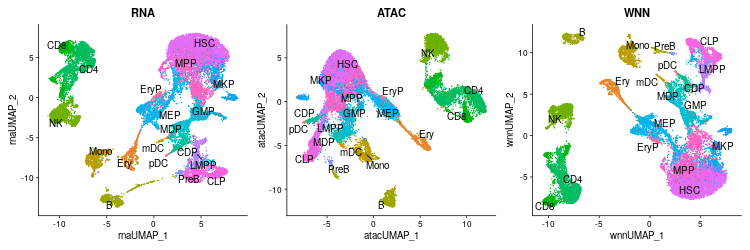

In [668]:
options(repr.plot.width=15, repr.plot.height=5,repr.plot.res=50)
p1 <- DimPlot(Donor04_agg_Multiome_wrapper, reduction = "umap.rna",  label = T, label.size = 5, repel = TRUE) + ggtitle("RNA")
p2 <- DimPlot(Donor04_agg_Multiome_wrapper, reduction = "umap.atac",  label = T, label.size = 5, repel = TRUE) + ggtitle("ATAC")
p3 <- DimPlot(Donor04_agg_Multiome_wrapper, reduction = "wnn.umap", label = T, label.size = 5, repel = TRUE) + ggtitle("WNN")
p1 + p2 + p3 & NoLegend() & theme(plot.title = element_text(hjust = 0.5))

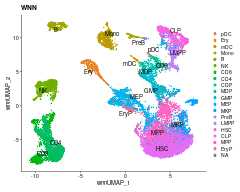

In [676]:
options(repr.plot.width=8, repr.plot.height=6.4,repr.plot.res=30)
p3

In [54]:
## Take the annotation from the seperated clustering
Donor04_agg_Multiome_wrapper@meta.data<-Donor04_agg_Multiome_wrapper@meta.data[,!colnames(Donor04_agg_Multiome_wrapper@meta.data)=="CellType"]
Donor04_agg_Multiome_wrapper@meta.data<-Donor04_agg_Multiome_wrapper@meta.data %>% Tomerge_v2(.,DN4.AGG.SeuratMeta[,"CellType",drop=F])

In [55]:
ident<-Donor04_agg_Multiome_wrapper@meta.data[,"CellType"]
names(ident)<-row.names(Donor04_agg_Multiome_wrapper@meta.data)
Donor04_agg_Multiome_wrapper@active.ident<-ident

In [10]:
HSC_HPC_BMMC_mitoTracing.Sensitive@CellMeta %>% head

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACTTGCTG_1,AAACAAGCACTTGCTG_1,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,0.5438496,0.4561504,8,8,MKP2,HSC
AAACAAGCAGGCAACT_1,AAACAAGCAGGCAACT_1,51.26821,SeuratProject,14113,4109,12215,5759,6081,2519,0.5372254,0.4627746,6,6,MEP,HSC
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,63.90531,SeuratProject,5366,2202,29607,12383,5367,2202,0.6139536,0.3860464,4,4,HSC,HSC
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,15.61856,SeuratProject,5037,2129,8805,4279,5171,2128,0.2623231,0.7376769,4,4,HSC,HSC
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,63.88509,SeuratProject,3855,1803,24233,10397,4763,1803,0.4080758,0.5919242,0,0,HSC,HSC


In [57]:
#saveRDS(Donor04_agg_Multiome_wrapper,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_agg_Multiome_wrapper.rds")
Donor04_agg_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_agg_Multiome_wrapper.rds")

# Make ATAC tracks for each Cell type

In [687]:
DN4.CellType.tb<-Donor04_agg_Multiome_wrapper@meta.data %>% .[complete.cases(.),] %>% .[,"CellType",drop=F] 
write.table(DN4.CellType.tb,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs/Donor4Explor_ipynb/DN4.CellType.tb",
           quote=F,sep="\t",row.names=T,col.names=F)

In [689]:
Donor04_agg_Multiome_wrapper@meta.data["AAACAGCCACAGGGAC-3",]

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>
AAACAGCCACAGGGAC-3,SeuratProject,5084,2212,11322,5299,4640,2212,0.6144096,0.3855904,1,1,HSC


<blockquote> Check out the log file in /lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs/Donor4Explor_ipynb/</blockquote>

# Combine data Make _mitoTracing

## Make meta and create HSC_HPC_BMMC_mitoTracing

In [44]:
Donor04_BMMC.meta %>% head

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,ATACName
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAGCCAATTAGCT-1,SeuratProject,2821,1527,7353,3378,2805,1526,0.7672044,0.2327956,5,5,CD4,ACAGCGGGTCCAAATC_1
AAACAGCCAGCTCATA-1,SeuratProject,2939,1596,8410,3886,2891,1596,0.5170815,0.4829185,4,4,CD4,ACAGCGGGTTCAAGCT_1
AAACAGCCATAGCGGA-1,SeuratProject,3889,2027,3394,1701,3174,2020,0.5582230,0.4417770,2,2,Mono,ACAGCGGGTAGCTTTA_1
AAACATGCAAGCCACT-1,SeuratProject,2350,1372,12789,5675,2386,1370,0.5000000,0.5000000,7,7,B,CATTTAGGTTTACCGG_1
AAACATGCAAGGCCAA-1,SeuratProject,2775,1479,7326,3383,2769,1479,0.5273375,0.4726625,4,4,CD4,CATTTAGGTGAATCGA_1
AAACCAACAGGATAAC-1,SeuratProject,2536,1468,2877,1430,2537,1465,0.5830835,0.4169165,3,3,CD8,CTTTATCGTGAGGAAG_1


In [54]:
Donor04_BMMC.meta<-Translate_RNA2ATAC(meta=Donor04_BMMC_Multiome_wrapper$seurat@meta.data,PostFix = F)
Donor04_HPC.meta<-Translate_RNA2ATAC(meta=Donor04_HPC_Multiome_wrapper$seurat@meta.data,PostFix = F)
Donor04_HSC.meta<-Translate_RNA2ATAC(meta=Donor04_HSC_Multiome_wrapper$seurat@meta.data,PostFix = F)

The following `from` values were not present in `x`: 2, 3

The following `from` values were not present in `x`: 2, 3

The following `from` values were not present in `x`: 2, 3



In [54]:
#Donor04_HSC.meta

<code style="background:purple;color:black">Below generate HSC_HPC_BMMC_mitoTracing.Sensitive and HSC_HPC_BMMC_mitoTracing.VerySensitive</code>

In [668]:
HSC_HPC_BMMC_mitoTracing.verysensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary,DN4_HPC.VariantsGTSummary,DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_HSC.depth,DN4_HPC.depth,DN4_BMMC.depth),
                feature.list_list=list(DN4_HSC.Variants.feature.lst,DN4_HPC.Variants.feature.lst,DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_HSC.meta,Donor04_HPC.meta,Donor04_BMMC.meta),
                labels=c("HSC","HPC","BMMC"),thr="VerySensitive")
HSC_HPC_BMMC_mitoTracing.verysensitive<-Make_matrix(HSC_HPC_BMMC_mitoTracing.verysensitive)
HSC_HPC_BMMC_mitoTracing.verysensitive<-SeuratLSIClustering(HSC_HPC_BMMC_mitoTracing.verysensitive)
HSC_HPC_BMMC_mitoTracing.verysensitive<-AddDatatoplot_clustering(HSC_HPC_BMMC_mitoTracing.verysensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

08:11:55 UMAP embedding parameters a = 0.9922 b = 1.112

08:11:55 Read 17700 rows and found 20 numeric columns

08:11:55 Using Annoy for neighbor search, n_neighbors = 30

08:11:55 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:12:02 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd3c83bbdd

08:12:02 Searching Annoy index using 1 thread, search_k = 3000

08:12:10 Annoy recall = 100%

08:12:15 Commencing smooth kNN distance calibration using 1 thread

08:12:15 8 smooth knn distance failures

08:12:23 Initializing from normalized Laplacian + noise

08:12:25 Commencing optimization for 200 epochs, with 770940 positive edges

08:12:36 Optimization finished

Computing nearest neighbor graph

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17700
Number of edges: 554239

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9682
Number of communities: 38
Elapsed time: 2 seconds


In [669]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary,DN4_HPC.VariantsGTSummary,DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_HSC.depth,DN4_HPC.depth,DN4_BMMC.depth),
                feature.list_list=list(DN4_HSC.Variants.feature.lst,DN4_HPC.Variants.feature.lst,DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_HSC.meta,Donor04_HPC.meta,Donor04_BMMC.meta),
                labels=c("HSC","HPC","BMMC"),thr="Sensitive")
HSC_HPC_BMMC_mitoTracing.Sensitive<-Make_matrix(HSC_HPC_BMMC_mitoTracing.Sensitive)
HSC_HPC_BMMC_mitoTracing.Sensitive<-SeuratLSIClustering(HSC_HPC_BMMC_mitoTracing.Sensitive)
HSC_HPC_BMMC_mitoTracing.Sensitive<-AddDatatoplot_clustering(HSC_HPC_BMMC_mitoTracing.Sensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

08:13:02 UMAP embedding parameters a = 0.9922 b = 1.112

08:13:02 Read 17669 rows and found 20 numeric columns

08:13:02 Using Annoy for neighbor search, n_neighbors = 30

08:13:02 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:13:14 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd51c930c

08:13:14 Searching Annoy index using 1 thread, search_k = 3000

08:13:22 Annoy recall = 99.94%

08:13:26 Commencing smooth kNN distance calibration using 1 thread

08:13:26 46 smooth knn distance failures

08:13:34 Initializing from normalized Laplacian + noise

08:13:37 Commencing optimization for 200 epochs, with 771312 positive edges

08:13:49 Optimization finished

Computing nearest neighbor gra

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17669
Number of edges: 550517

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9709
Number of communities: 41
Elapsed time: 1 seconds


In [670]:
HPC_BMMC_mitoTracing.Sensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HPC.VariantsGTSummary,DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_HPC.depth,DN4_BMMC.depth),
                feature.list_list=list(DN4_HPC.Variants.feature.lst,DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_HPC.meta,Donor04_BMMC.meta),
                labels=c("HPC","BMMC"),thr="Sensitive")
HPC_BMMC_mitoTracing.Sensitive<-Make_matrix(HPC_BMMC_mitoTracing.Sensitive)
HPC_BMMC_mitoTracing.Sensitive<-SeuratLSIClustering(HPC_BMMC_mitoTracing.Sensitive)
HPC_BMMC_mitoTracing.Sensitive<-AddDatatoplot_clustering(HPC_BMMC_mitoTracing.Sensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

08:14:04 UMAP embedding parameters a = 0.9922 b = 1.112

08:14:04 Read 11998 rows and found 20 numeric columns

08:14:04 Using Annoy for neighbor search, n_neighbors = 30

08:14:04 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:14:10 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd2e45d559

08:14:10 Searching Annoy index using 1 thread, search_k = 3000

08:14:15 Annoy recall = 99.91%

08:14:19 Commencing smooth kNN distance calibration using 1 thread

08:14:20 38 smooth knn distance failures

08:14:26 Initializing from normalized Laplacian + noise

08:14:26 Commencing optimization for 200 epochs, with 533782 positive edges

08:14:35 Optimization finished

Computing nearest neighbor gr

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11998
Number of edges: 379524

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9702
Number of communities: 37
Elapsed time: 0 seconds


In [671]:
HPC_BMMC_mitoTracing.VerySensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HPC.VariantsGTSummary,DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_HPC.depth,DN4_BMMC.depth),
                feature.list_list=list(DN4_HPC.Variants.feature.lst,DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_HPC.meta,Donor04_BMMC.meta),
                labels=c("HPC","BMMC"),thr="VerySensitive")
HPC_BMMC_mitoTracing.VerySensitive<-Make_matrix(HPC_BMMC_mitoTracing.VerySensitive)
HPC_BMMC_mitoTracing.VerySensitive<-SeuratLSIClustering(HPC_BMMC_mitoTracing.VerySensitive)
HPC_BMMC_mitoTracing.VerySensitive<-AddDatatoplot_clustering(HPC_BMMC_mitoTracing.VerySensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

08:14:48 UMAP embedding parameters a = 0.9922 b = 1.112

08:14:48 Read 12018 rows and found 20 numeric columns

08:14:48 Using Annoy for neighbor search, n_neighbors = 30

08:14:48 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

08:14:53 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd5600024c

08:14:53 Searching Annoy index using 1 thread, search_k = 3000

08:14:58 Annoy recall = 100%

08:15:02 Commencing smooth kNN distance calibration using 1 thread

08:15:02 11 smooth knn distance failures

08:15:08 Initializing from normalized Laplacian + noise

08:15:09 Commencing optimization for 200 epochs, with 533410 positive edges

08:15:18 Optimization finished

Computing nearest neighbor grap

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12018
Number of edges: 393760

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9656
Number of communities: 35
Elapsed time: 0 seconds


In [222]:
# saveRDS(HPC_BMMC_mitoTracing.Sensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.Sensitive.rds")
# saveRDS(HPC_BMMC_mitoTracing.VerySensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.VerySensitive.rds")

In [672]:
HPC_BMMC_mitoTracing.VerySensitive@DistObjects@LSIdist

NULL

In [338]:
# saveRDS(HSC_HPC_BMMC_mitoTracing.verysensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.verysensitive")
# saveRDS(HSC_HPC_BMMC_mitoTracing.Sensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [ ]:
HSC_HPC_BMMC_mitoTracing@CellMeta$CellType2<-paste(HSC_HPC_BMMC_mitoTracing@CellMeta$Label,HSC_HPC_BMMC_mitoTracing@CellMeta$CellType,sep="_")

## Prepare the complete mitoTracing object for Fulong 

In [6]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [9]:
## Prepare the depth, given the order created: "HSC":-1 ,"HPC": -2, "BMMC": -3
WD_HSC="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HSC/MTenrichCombine/mitoV/final/"
WD_HPC="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HPC/MTenrichCombine/mitoV/final/"
WD_BMMC="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_BMMC/MTenrichCombine/mitoV/final/"


In [10]:
q_HSC<-read.table(paste(WD_HSC,"QualifiedTotalCts",sep=""))
q_HSC$V1<-paste(q_HSC$V1,"1",sep="_")

ERROR: Error in q$V1: object of type 'closure' is not subsettable


In [13]:
q_HPC<-read.table(paste(WD_HPC,"QualifiedTotalCts",sep=""))
q_HPC$V1<-paste(q_HPC$V1,"2",sep="_")

In [31]:
q_BMMC<-read.table(paste(WD_BMMC,"QualifiedTotalCts",sep=""))
q_BMMC$V1<-paste(q_BMMC$V1,"3",sep="_")

In [32]:
q<-rbind(q_HSC,q_HPC,q_BMMC)

In [33]:
## Add depth matrix
HSC_HPC_BMMC_mitoTracing.Sensitive<-Add_DepthMatrix(HSC_HPC_BMMC_mitoTracing.Sensitive,q)

Using Sensitive as value column: use value.var to override.



In [41]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-SeuratLSIClustering(HSC_HPC_BMMC_mitoTracing.Sensitive,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
21:17:16 UMAP embedding parameters a = 0.9922 b = 1.112

21:17:16 Read 17618 rows and found 49 numeric columns

21:17:16 Using Annoy for neighbor search, n_neighbors = 30

21:17:16 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:17:23 Writing NN index file to temp file /tmp/RtmpBEkKwr/file7f004fd80b60

21:17:23 Searching Annoy index using 1 thread, search_k = 3000

21:17:30 Annoy recall = 100%

21:18:24 Commencing s

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 17618
Number of edges: 736114

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9664
Number of communities: 78
Elapsed time: 1 seconds


In [43]:
data(CellPCT)
V.weight<-data.frame(weight=1-CellPCT$muRate)
V.weight$Variants<-paste("Variants",gsub("_","",CellPCT$Variant),sep="")

In [44]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-AddDist(HSC_HPC_BMMC_mitoTracing.Sensitive,weightDF=V.weight,LSIdist=T,dim=2:50)

[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    


Loading required package: Matrix


Attaching package: ‘Matrix’


The following object is masked from ‘package:ggtree’:

    expand




[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    


In [45]:
#saveRDS(HSC_HPC_BMMC_mitoTracing.Sensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HSC_HPC_BMMC_mitoTracing.Sensitive.rds")
readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HSC_HPC_BMMC_mitoTracing.Sensitive.rds")

In [46]:
HSC_HPC_BMMC_mitoTracing.Sensitive

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
     "Sensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 17710"

BMMC  HPC  HSC 
5816 6210 5684 
[1] "Total Variant number: 8086"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

In [48]:
HSC_HPC_BMMC_mitoTracing.Sensitive@DistObjects@w_jaccard %>% head

[1] 1.0000000 0.9938413 0.9923018 0.9925673 0.9734421 0.9922985

In [49]:
HSC_HPC_BMMC_mitoTracing.Sensitive@CellMeta %>% head

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACTTGCTG_1,AAACAAGCACTTGCTG_1,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,0.5438496,0.4561504,8,8,MKP2,HSC
AAACAAGCAGGCAACT_1,AAACAAGCAGGCAACT_1,51.26821,SeuratProject,14113,4109,12215,5759,6081,2519,0.5372254,0.4627746,6,6,MEP,HSC
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,63.90531,SeuratProject,5366,2202,29607,12383,5367,2202,0.6139536,0.3860464,4,4,HSC,HSC
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,15.61856,SeuratProject,5037,2129,8805,4279,5171,2128,0.2623231,0.7376769,4,4,HSC,HSC
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,63.88509,SeuratProject,3855,1803,24233,10397,4763,1803,0.4080758,0.5919242,0,0,HSC,HSC


# Coverage analysis by cell types

Warning message:
“Removed 302 rows containing non-finite values (stat_boxplot).”


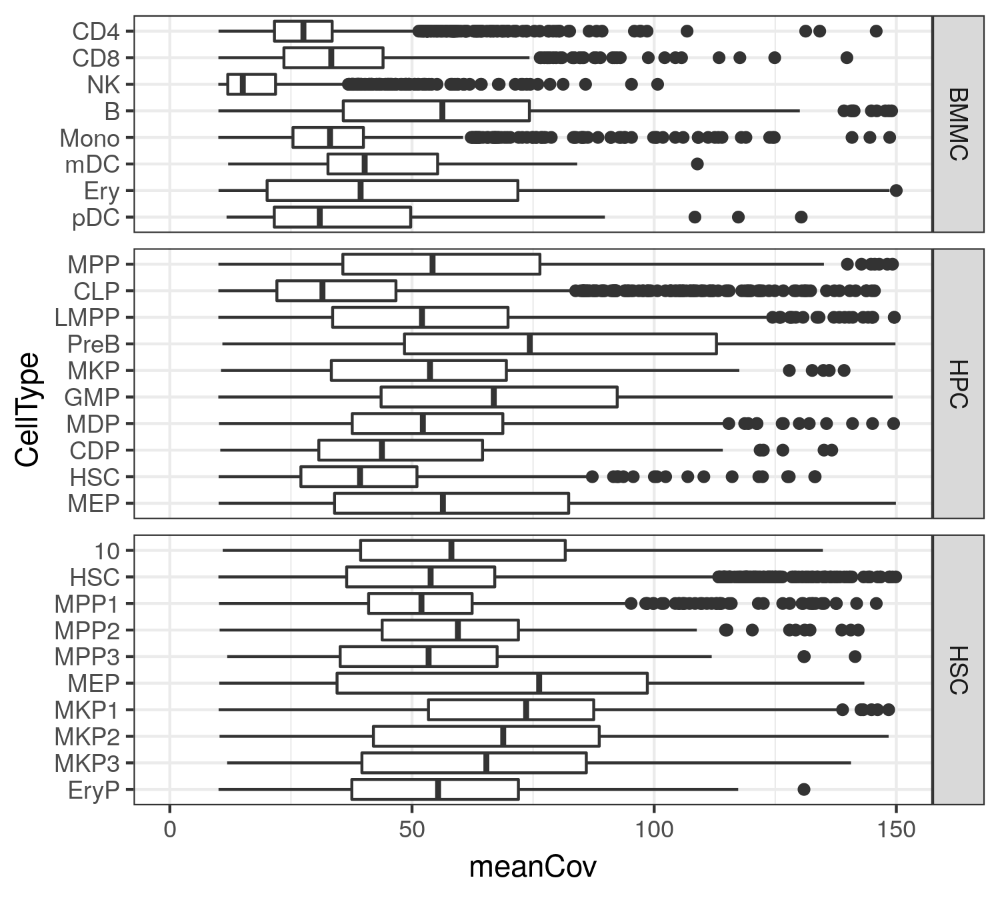

In [78]:
ggplot(HSC_HPC_BMMC_mitoTracing@CellMeta)+aes(CellType,meanCov)+geom_boxplot()+facet_grid(Label~.,space = "free",scales="free")+coord_flip()+ylim(0,150)+theme_bw()

# Mutation burden analysis

## Variant level VAF analysis

In [15]:
##
BMMC.vaf<-DN4_BMMC.Variants.feature.lst$Sensitive[,c("Variants","VAF")]
HPC.vaf<-DN4_HPC.Variants.feature.lst$Sensitive[,c("Variants","VAF")]
HSC.vaf<-DN4_HSC.Variants.feature.lst$Sensitive[,c("Variants","VAF")]
# DN4_HPC.VariantsGTSummary$Sensitive %>% group_by(Cell) 

Warning message:
“Removed 55 rows containing missing values (geom_point).”
Warning message:
“Removed 50 rows containing missing values (geom_point).”


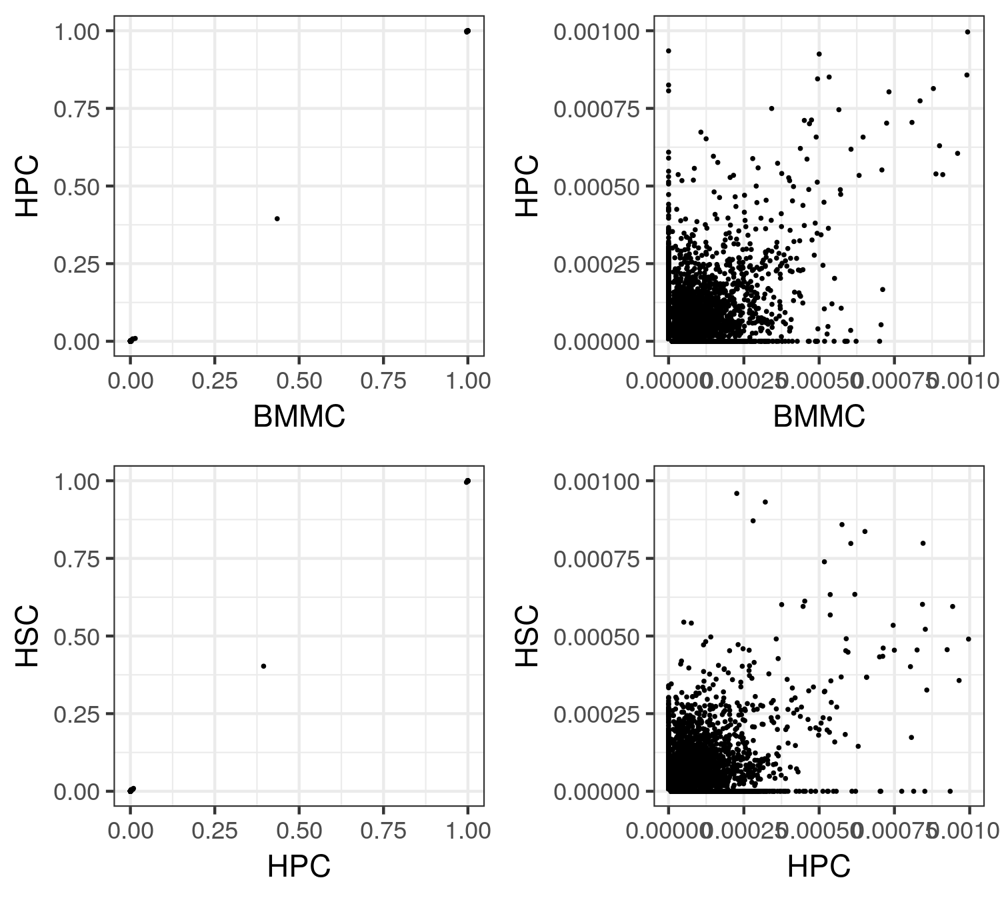

In [42]:
options(repr.plot.width=5, repr.plot.height=4.5,repr.plot.res=300)
df<-merge(BMMC.vaf,HPC.vaf,by="Variants",all=T)
df[is.na(df)]<-0
p1<- ggplot(df)+aes(VAF.x,VAF.y)+geom_point(size=0.2)+theme_bw()+labs(x="BMMC",y="HPC")
p2<- ggplot(df)+aes(VAF.x,VAF.y)+geom_point(size=0.2)+xlim(0,0.001)+ylim(0,0.001)+theme_bw()+labs(x="BMMC",y="HPC")

df2<-merge(HPC.vaf,HSC.vaf,by="Variants",all=T)
df2[is.na(df2)]<-0
p3<- ggplot(df2)+aes(VAF.x,VAF.y)+geom_point(size=0.2)+theme_bw()+labs(x="HPC",y="HSC")
p4<- ggplot(df2)+aes(VAF.x,VAF.y)+geom_point(size=0.2)+xlim(0,0.001)+ylim(0,0.001)+theme_bw()+labs(x="HPC",y="HSC")
# grid.arrange(p1,p2)
grid.arrange(p1,p2,p3,p4)

## Check if the homoplasmy variants reproducibility

In [121]:
subset(DN4_BMMC.Variants.feature.lst$Sensitive,HomoTag=="Homo") %>% dim
subset(DN4_HPC.Variants.feature.lst$Sensitive,HomoTag=="Homo") %>% dim
subset(DN4_HSC.Variants.feature.lst$Sensitive,HomoTag=="Homo") %>% dim
HomoV<- subset(DN4_HSC.Variants.feature.lst$Sensitive,HomoTag=="Homo")$Variants
HomoV<-paste("Variants",gsub("_","",HomoV),sep="")

[1] 34 10

[1] 34 10

[1] 34 10

## Cell level mutation burden

### BMMC VS HPC vs HSC

In [339]:
HSC_HPC_BMMC_mitoTracing.verysensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.verysensitive")
HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [335]:
CheckVNumber<-HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi %>% rowSums %>% Tomerge_v2(HSC_HPC_BMMC_mitoTracing.Sensitive@CellMeta,.)

In [336]:
head(CheckVNumber)

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label,y
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>,<dbl>
AAACAAGCAAACTAAC_3,AAACAAGCAAACTAAC_3,34.10007,SeuratProject,1908,1131,11590,4971,2248,1130,0.5456426,0.4543574,4,4,CD4,BMMC,17
AAACAAGCAAGGGAGC_3,AAACAAGCAAGGGAGC_3,26.10809,SeuratProject,1691,1078,7418,3568,2120,1079,0.4556630,0.5443370,0,0,CD4,BMMC,10
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC,20
AAACAAGCACCTCGAC_2,AAACAAGCACCTCGAC_2,47.40672,SeuratProject,3555,2016,18492,8735,4483,2017,0.5287142,0.4712858,2,2,HSC,HPC,13
AAACAAGCACTTCAAC_3,AAACAAGCACTTCAAC_3,49.50824,SeuratProject,2279,1315,12024,5290,2359,1312,0.4577421,0.5422579,3,3,CD8,BMMC,14
AAACAAGCACTTGCTG_1,AAACAAGCACTTGCTG_1,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,0.5438496,0.4561504,8,8,MKP2,HSC,23


`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 41 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 41 rows containing missing values (geom_point).”
Warning message:
“Removed 41 rows containing non-finite values (stat_density).”


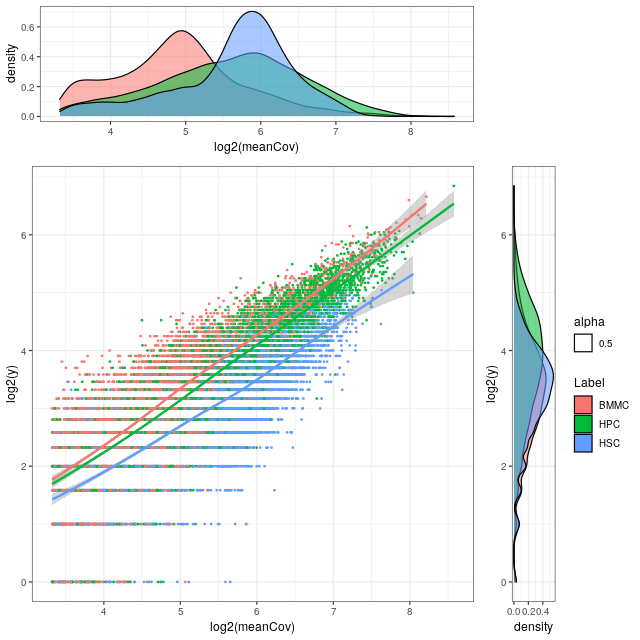

In [337]:
options(repr.plot.width=8, repr.plot.height=8,repr.plot.res=80)
laym<-rbind(c(2,2,2,NA),c(1,1,1,3),c(1,1,1,3),c(1,1,1,3))
p1<-ggplot(CheckVNumber)+aes(log2(meanCov),log2(y),color=Label)+geom_point(size=0.5)+theme_bw()+theme(legend.position="none")+geom_smooth(method = "loess")
p2<-ggplot(CheckVNumber)+aes(log2(meanCov),fill=Label,alpha=0.5)+geom_density()+theme_bw()+theme(legend.position="none")
p3<-ggplot(CheckVNumber)+aes(log2(y),fill=Label,alpha=0.5)+geom_density()+coord_flip()+theme_bw()
grid.arrange(p1,p2,p3,layout_matrix=laym)

In [130]:
# CheckVNumber.HSC<-subset(CheckVNumber,Label=="HSC")
# options(repr.plot.width=8, repr.plot.height=8)
# laym<-rbind(c(2,2,2,NA),c(1,1,1,3),c(1,1,1,3),c(1,1,1,3))
# p1<-ggplot(CheckVNumber.HSC)+aes(log2(meanCov),log2(y),color=CellType)+geom_point(size=0.5)+theme_bw()+theme(legend.position="none")
# p2<-ggplot(CheckVNumber.HSC)+aes(log2(meanCov),fill=CellType,alpha=0.5)+geom_density()+theme_bw()+theme(legend.position="none")
# p3<-ggplot(CheckVNumber.HSC)+aes(log2(y),fill=CellType,alpha=0.5)+geom_density()+coord_flip()+theme_bw()
# grid.arrange(p1,p2,p3,layout_matrix=laym)

### Across celltypes within BMMC

In [340]:
CheckVNumber<-HSC_HPC_BMMC_mitoTracing@Cts.Mtx.bi %>% rowSums %>% Tomerge_v2(HSC_HPC_BMMC_mitoTracing@CellMeta,.)
CheckVNumber<-subset(CheckVNumber,Label=="BMMC")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 18 rows containing non-finite values (stat_smooth).”
Warning message:
“Removed 18 rows containing missing values (geom_point).”
Warning message:
“Removed 18 rows containing non-finite values (stat_density).”


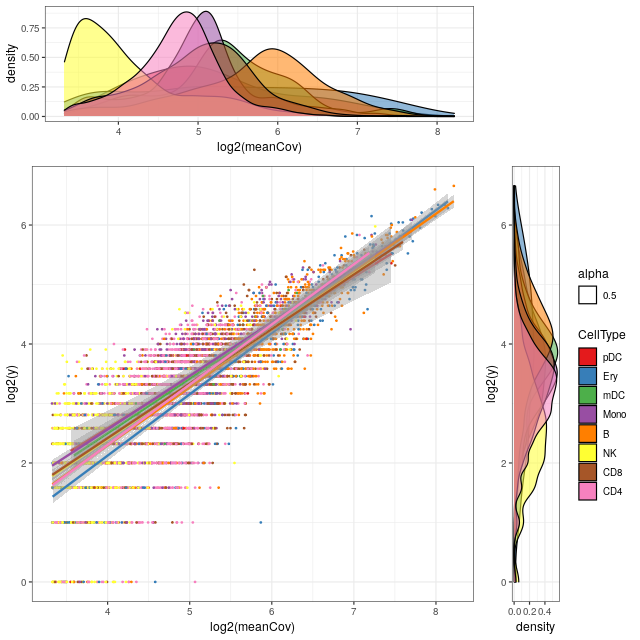

In [341]:
options(repr.plot.width=8, repr.plot.height=8,repr.plot.res=80)
laym<-rbind(c(2,2,2,NA),c(1,1,1,3),c(1,1,1,3),c(1,1,1,3))
p1<-ggplot(CheckVNumber)+aes(log2(meanCov),log2(y),color=CellType)+geom_point(size=0.5)+theme_bw()+theme(legend.position="none")+geom_smooth(method="lm")+scale_color_brewer(palette = "Set1")
p2<-ggplot(CheckVNumber)+aes(log2(meanCov),fill=CellType,alpha=0.5)+geom_density()+theme_bw()+theme(legend.position="none")+scale_fill_brewer(palette = "Set1")
p3<-ggplot(CheckVNumber)+aes(log2(y),fill=CellType,alpha=0.5)+geom_density()+coord_flip()+theme_bw()+scale_fill_brewer(palette = "Set1")
grid.arrange(p1,p2,p3,layout_matrix=laym)

### Across celltypes within HPC

In [342]:
CheckVNumber<-HSC_HPC_BMMC_mitoTracing@Cts.Mtx.bi %>% rowSums %>% Tomerge_v2(HSC_HPC_BMMC_mitoTracing@CellMeta,.)
CheckVNumber<-subset(CheckVNumber,Label=="HPC")

`geom_smooth()` using formula 'y ~ x'

Warning message:
“Removed 6 rows containing non-finite values (stat_smooth).”
Warning message in RColorBrewer::brewer.pal(n, pal):
“n too large, allowed maximum for palette Set1 is 9
Returning the palette you asked for with that many colors
”
Warning message:
“Removed 817 rows containing missing values (geom_point).”
Warning message in RColorBrewer::brewer.pal(n, pal):
“n too large, allowed maximum for palette Set1 is 9
Returning the palette you asked for with that many colors
”
Warning message:
“Removed 6 rows containing non-finite values (stat_density).”
Warning message in RColorBrewer::brewer.pal(n, pal):
“n too large, allowed maximum for palette Set1 is 9
Returning the palette you asked for with that many colors
”


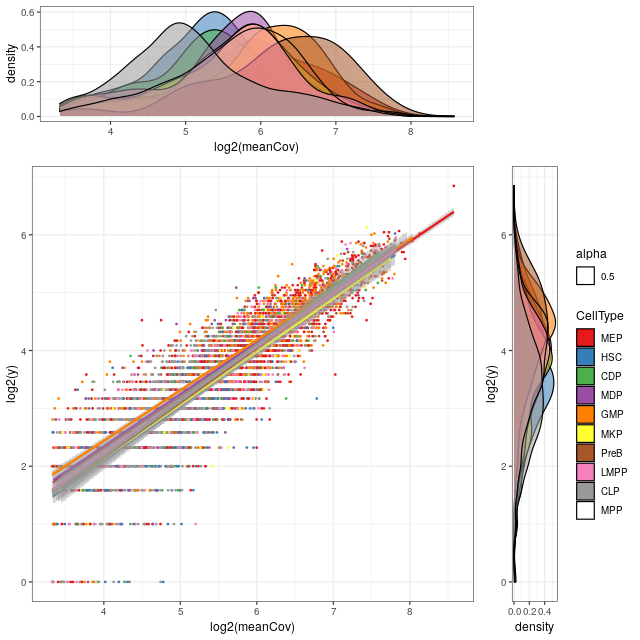

In [343]:
options(repr.plot.width=8, repr.plot.height=8,repr.plot.res=80)
laym<-rbind(c(2,2,2,NA),c(1,1,1,3),c(1,1,1,3),c(1,1,1,3))
p1<-ggplot(CheckVNumber)+aes(log2(meanCov),log2(y),color=CellType)+geom_point(size=0.5)+theme_bw()+theme(legend.position="none")+geom_smooth(method="lm")+scale_color_brewer(palette = "Set1")
p2<-ggplot(CheckVNumber)+aes(log2(meanCov),fill=CellType,alpha=0.5)+geom_density()+theme_bw()+theme(legend.position="none")+scale_fill_brewer(palette = "Set1")
p3<-ggplot(CheckVNumber)+aes(log2(y),fill=CellType,alpha=0.5)+geom_density()+coord_flip()+theme_bw()+scale_fill_brewer(palette = "Set1")
grid.arrange(p1,p2,p3,layout_matrix=laym)

### Try Hard cutoff 3 FamilySize drop normalization(X)

In [110]:
head(HSC_HPC_BMMC_mitoTracing@CellMeta)

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACTTGCTG_1,AAACAAGCACTTGCTG_1,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,0.5438496,0.4561504,8,8,MKP2,HSC
AAACAAGCAGGCAACT_1,AAACAAGCAGGCAACT_1,51.26821,SeuratProject,14113,4109,12215,5759,6081,2519,0.5372254,0.4627746,6,6,MEP,HSC
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,63.90531,SeuratProject,5366,2202,29607,12383,5367,2202,0.6139536,0.3860464,4,4,HSC,HSC
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,15.61856,SeuratProject,5037,2129,8805,4279,5171,2128,0.2623231,0.7376769,4,4,HSC,HSC
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,63.88509,SeuratProject,3855,1803,24233,10397,4763,1803,0.4080758,0.5919242,0,0,HSC,HSC


In [23]:
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_BMMC/MTenrichCombine/mitoV/final"
Total<-read.table(paste(WD,"/RawGenotypes.Total.StrandBalance",sep=""))
BMMC.FamilyDrop<-Total %>% group_by(V2) %>% dplyr::summarise(FamilyDrop=1-sum(V8>=3)/n()) %>% as.data.frame()
row.names(BMMC.FamilyDrop)<-paste(BMMC.FamilyDrop$V2,"3",sep="_")  ##  The order is "HSC","HPC","BMMC" in 4.1 

In [24]:
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HPC/MTenrichCombine/mitoV/final"
Total<-read.table(paste(WD,"/RawGenotypes.Total.StrandBalance",sep=""))
HPC.FamilyDrop<-Total %>% group_by(V2) %>% dplyr::summarise(FamilyDrop=1-sum(V8>=3)/n())  %>% as.data.frame()
row.names(HPC.FamilyDrop)<-paste(HPC.FamilyDrop$V2,"2",sep="_")

In [25]:
WD<-"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HSC/MTenrichCombine/mitoV/final"
Total<-read.table(paste(WD,"/RawGenotypes.Total.StrandBalance",sep=""))
HSC.FamilyDrop<-Total %>% group_by(V2) %>% dplyr::summarise(FamilyDrop=1-sum(V8>=3)/n())  %>% as.data.frame()
row.names(HSC.FamilyDrop)<-paste(HSC.FamilyDrop$V2,"1",sep="_")

In [348]:
HSC_HPC_BMMC_FamilyDrop<-rbind(BMMC.FamilyDrop,HPC.FamilyDrop,HSC.FamilyDrop)

In [349]:
Meta<-Tomerge_v2(HSC_HPC_BMMC_mitoTracing@CellMeta,HSC_HPC_BMMC_FamilyDrop[,"FamilyDrop",drop=F]) 
CheckVNumber<-HSC_HPC_BMMC_mitoTracing@Cts.Mtx %>% rowSums %>% Tomerge_v2(Meta,.)

In [350]:
CheckVNumber$Alpha<-CheckVNumber$y/((1-CheckVNumber$FamilyDrop)*CheckVNumber$meanCov)
CheckVNumber$yPerCov<-CheckVNumber$y/CheckVNumber$meanCov

In [351]:
CheckVNumber<-CheckVNumber[complete.cases(CheckVNumber),]

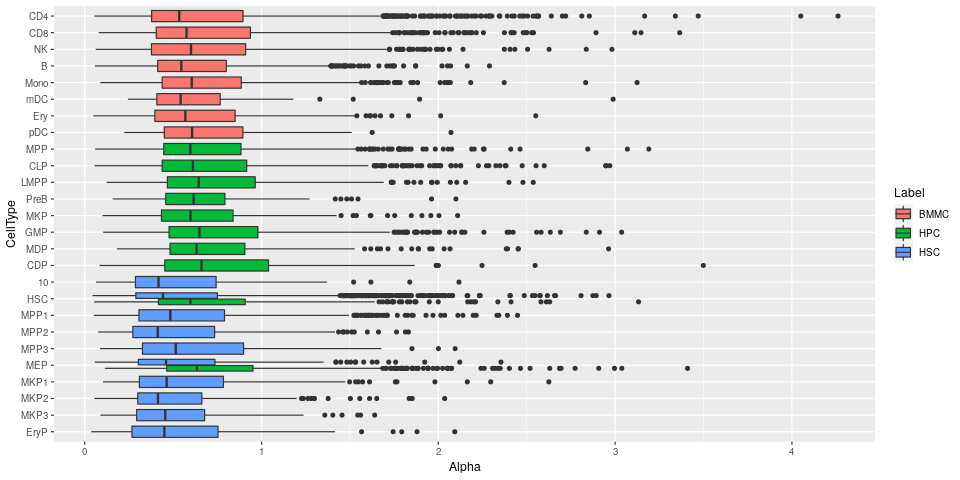

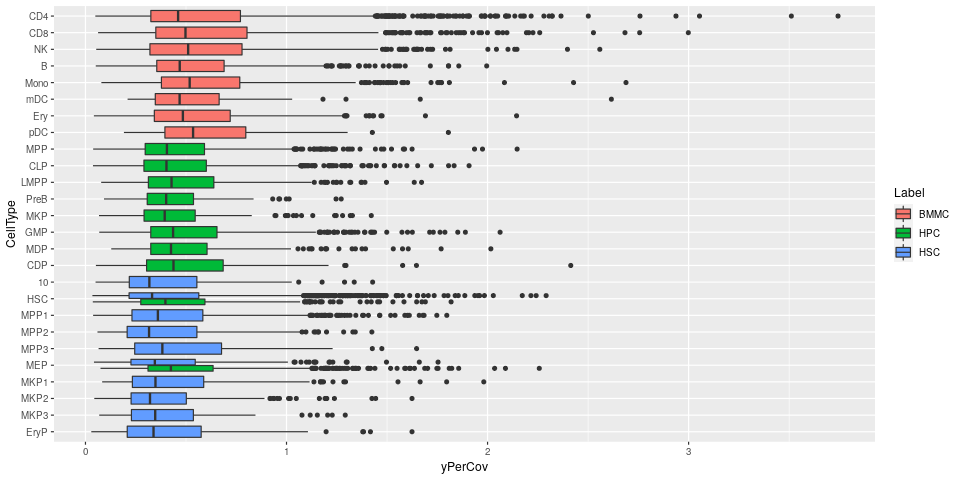

In [353]:
options(repr.plot.width=12,repr.plot.height=6,repr.plot.res=80)
ggplot(CheckVNumber)+aes(CellType,Alpha,fill=Label)+geom_boxplot()+coord_flip()
ggplot(CheckVNumber)+aes(CellType,yPerCov,fill=Label)+geom_boxplot()+coord_flip()

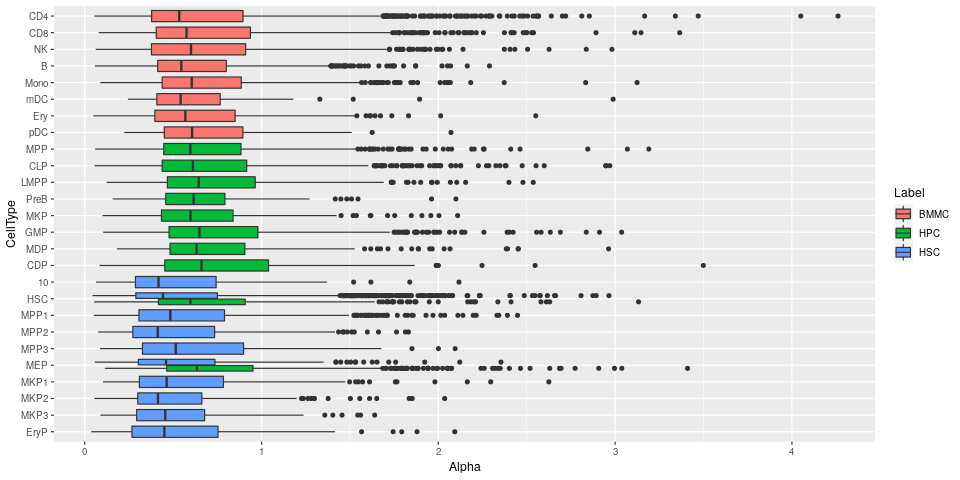

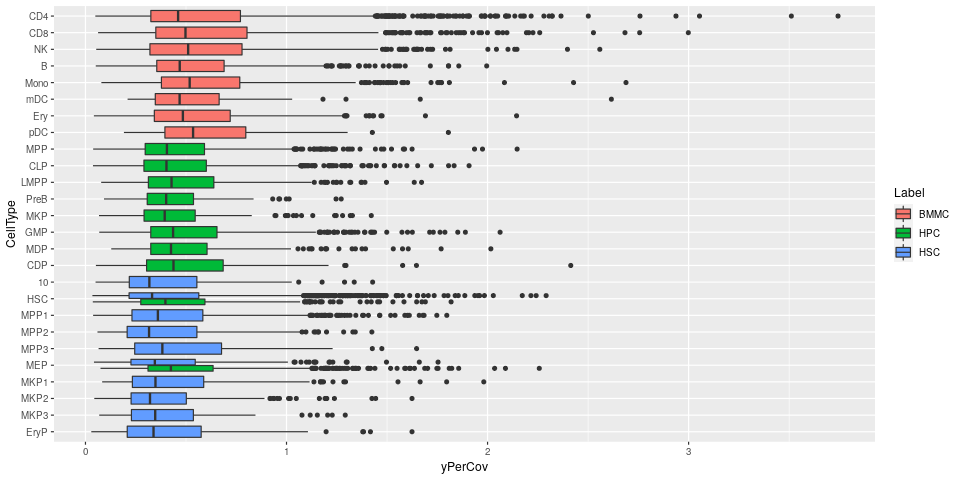

In [354]:
options(repr.plot.width=12,repr.plot.height=6,repr.plot.res=80)
ggplot(CheckVNumber)+aes(CellType,Alpha,fill=Label)+geom_boxplot()+coord_flip()
ggplot(CheckVNumber)+aes(CellType,yPerCov,fill=Label)+geom_boxplot()+coord_flip()

#### Baysian modeling

In [ ]:
library(rethinking)  # Evernote Rethining and Rstan
# check_cmdstan_toolchain()
# install_cmdstan(dir="/lab/solexa_weissman/cweng/Packages/Others/cmdstanr")
# Note, there is some problem in jupyter, but can work on MobaXterm

In [100]:
CheckVNumber$id<-coerce_index(CheckVNumber$CellType)
CheckVNumber.ess.CD4<-subset(CheckVNumber.ess,CellType=="CD4")

CheckVNumber.ess.CD4HSC<-subset(CheckVNumber.ess,CellType %in% c("CD4","HSC"))
CheckVNumber.ess.CD4HSC$id<-coerce_index(as.character(CheckVNumber.ess.CD4HSC$CellType))

Warning message in coerce_index(as.character(CheckVNumber.ess.CD4HSC$CellType)):
“NAs introduced by coercion”


In [93]:
## note, for testing, using 3~4 chains,
m3<-map2stan(
    alist(
       y ~ dpois(lambda),
       log(lambda) <-bc*meanCov*E,
       E<-delta*(1-FamilyDrop),
       delta ~ dunif(0,1),
       bc ~ dunif (0,1)   
    ),
     data=CheckVNumber.ess.CD4,warmup=2000,iter=2000,chain=4,cores=4
    )

## Check 
plot(m3) # Look at the convergence
precis(m3)   ## Get posterior probabilities
extract.samples(m3) ## Get posterior probabilities

In [39]:
m4<-map2stan(
    alist(
       y ~ dpois(lambda),
       log(lambda) <-bc[id]*meanCov*E,
       E<-delta*(1-FamilyDrop),
       delta ~ dunif(0,1),
       bc[id] ~ dunif (0,1)   
    ),
     data=CheckVNumber.ess.CD4HSC,warmup=2000,iter=2000,chain=3,cores=3
    )

### Try Normalize using Reject Rate

#### Calculate Concensus rejection rate

In [ ]:
HSC_HPC_BMMC_mitoTracing.verysensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.verysensitive")
HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [98]:
## Note, ComputeRejectRate is a new function added into scm
DN4_BMMC_RejectRate<-ComputeRejectRate("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_BMMC/MTenrichCombine/mitoV/final/")


In [99]:
DN4_HPC_RejectRate<-ComputeRejectRate("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HPC/MTenrichCombine/mitoV/final/")
DN4_HSC_RejectRate<-ComputeRejectRate("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HSC/MTenrichCombine/mitoV/final/")

In [114]:
DN4_BMMC.HPC.HSC_RejectRate<-rbind(DN4_BMMC_RejectRate %>% mutate(Cell=paste(Cell,"_3",sep="")),
                                   DN4_HPC_RejectRate %>% mutate(Cell=paste(Cell,"_2",sep="")),
                                   DN4_HSC_RejectRate %>% mutate(Cell=paste(Cell,"_1",sep="")))
DN4_BMMC.HPC.HSC_RejectRate<-DN4_BMMC.HPC.HSC_RejectRate %>% tibble::column_to_rownames(var = "Cell")

In [104]:
median(DN4_BMMC_RejectRate$VerySensitive)
median(DN4_HPC_RejectRate$VerySensitive)
median(DN4_HSC_RejectRate$VerySensitive)

[1] 0.9640152

[1] 0.9426586

[1] 0.9348837

In [105]:
median(DN4_BMMC_RejectRate$Sensitive)
median(DN4_HPC_RejectRate$Sensitive)
median(DN4_HSC_RejectRate$Sensitive)

[1] 0.8920266

[1] 0.7816712

[1] 0.8199532

In [106]:
median(DN4_BMMC_RejectRate$Specific)
median(DN4_HPC_RejectRate$Specific)
median(DN4_HSC_RejectRate$Specific)

[1] 0.8307849

[1] 0.6380814

[1] 0.7165801

#### Plot and examine mutation burden per cell type

In [520]:
CheckVNumber.sensitive<-HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi %>% rowSums %>% Tomerge_v2(.,HSC_HPC_BMMC_mitoTracing@CellMeta) %>% Tomerge_v2(.,DN4_BMMC.HPC.HSC_RejectRate) %>% mutate(MutationBurden=100*x/(meanCov*Sensitive))
CheckVNumber.verysensitive<-HSC_HPC_BMMC_mitoTracing.verysensitive@Cts.Mtx.bi %>% rowSums %>% Tomerge_v2(.,HSC_HPC_BMMC_mitoTracing.verysensitive@CellMeta) %>% Tomerge_v2(.,DN4_BMMC.HPC.HSC_RejectRate) %>% mutate(MutationBurden=100*x/(meanCov*VerySensitive))

Warning message:
“Removed 2614 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 3611 rows containing non-finite values (stat_boxplot).”


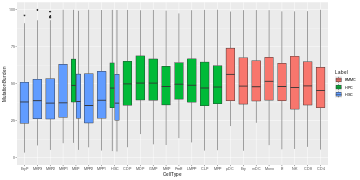

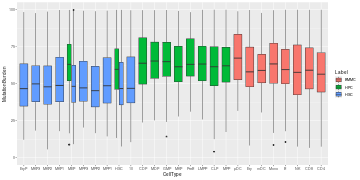

In [518]:
options(repr.plot.width=12,repr.plot.height=6,repr.plot.res=300)
ggplot(CheckVNumber.sensitive)+aes(CellType,MutationBurden,fill=Label)+geom_boxplot()+ylim(0,100)#+coord_flip()
ggplot(CheckVNumber.verysensitive)+aes(CellType,MutationBurden,fill=Label)+geom_boxplot()+ylim(0,100)#+coord_flip()

In [434]:
#Standardize cell type annotation
head(CheckVNumber.sensitive)
CheckVNumber.sensitive$CellType %>% unique %>% print

,Cell,x,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,⋯,wsnn_res.0.8,seurat_clusters,CellType,Label,Total,VerySensitive,Sensitive,Specific,MutationBurden,HSCsignature1
,<chr>,<dbl>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,⋯,<fct>,<fct>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,AAACAAGCAAACTAAC_3,18,34.10007,SeuratProject,1908,1131,11590,4971,2248,1130,⋯,4,4,CD4,BMMC,1043,0.9520614,0.8935762,0.8322148,59.07254,-0.2242551
2,AAACAAGCAAGGGAGC_3,11,26.10809,SeuratProject,1691,1078,7418,3568,2120,1079,⋯,0,0,CD4,BMMC,759,0.9657444,0.8866930,0.8260870,47.51648,-0.1984700
3,AAACAAGCACATTGTC_1,52,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,⋯,0,0,HSC,HSC,2207,0.9256910,0.8056185,0.7018577,86.35375,1.3509574
4,AAACAAGCACCTCGAC_2,30,47.40672,SeuratProject,3555,2016,18492,8735,4483,2017,⋯,2,2,HSC,HPC,1291,0.9659179,0.7962820,0.6576297,79.47205,0.5363176
5,AAACAAGCACTTCAAC_3,22,49.50824,SeuratProject,2279,1315,12024,5290,2359,1312,⋯,3,3,CD8,BMMC,1432,0.9657821,0.9071229,0.8414804,48.98680,-0.3484789
6,AAACAAGCACTTGCTG_1,47,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,⋯,8,8,MKP2,HSC,3582,0.9505863,0.8520380,0.7682859,44.94713,-0.4074403


 [1] CD4  HSC  CD8  MKP2 MEP  CLP  MPP  B    CDP  Mono Ery  NK   MDP  LMPP GMP 
[16] PreB MKP1 MPP2 MPP1 EryP MKP  MKP3 mDC  pDC  10   MPP3
26 Levels: EryP MKP3 MKP2 MKP1 MEP MPP3 MPP2 MPP1 HSC 10 CDP MDP GMP ... CD4


In [532]:
CheckVNumber.sensitive$STD.CellType<-plyr::mapvalues(CheckVNumber.sensitive$CellType,from=c("HSC", "MPP", "MPP1", "MPP2","MPP3", "MKP", "MKP1","MKP2","MKP3", "EryP", "PreB"),
                to=c("HSC", "MPP", "MPP", "MPP","MMP", "MKP", "MKP","MKP","MKP", "MEP", "ProB"))
CheckVNumber.sensitive$STD.CellType<-factor(CheckVNumber.sensitive$STD.CellType,levels=c("HSC","MKP","MPP","CMP","MEP","LMPP","CLP","GMP","MDP","CDP","ProB",
                                                                                         "Mono","Meg","Ery","mDC","CD4","CD8","NK","B","pDC"))

In [533]:
CheckVNumber.sensitive<-subset(CheckVNumber.sensitive,!STD.CellType %in% c("10","ProB"))

In [534]:
CheckVNumber.sensitive$STD_Cat<-recode(CheckVNumber.sensitive$STD.CellType,
HSC="Stem",
MPP="EarlyP",CMP="EarlyP",MKP="EarlyP",
MEP="Mye_P",GMP="Mye_P",MDP="Mye_P",CDP="Mye_P",
LMPP="Lym_P",CLP="Lym_P",ProB="Lym_P",
Mono="Mye",Ery="Mye",mDC="Mye",
CD4="Lym",CD8="Lym" ,NK="Lym"  ,B="Lym" ,pDC="Lym") 
CheckVNumber.sensitive$STD_Cat<-factor(CheckVNumber.sensitive$STD_Cat,levels=c("Stem","EarlyP","Mye_P","Lym_P","Mye","Lym"))

CheckVNumber.sensitive$STD_Cat2<-recode(CheckVNumber.sensitive$STD.CellType,
HSC="Stem",
MPP="EarlyP",CMP="EarlyP",MKP="EarlyP",
MEP="LateP",GMP="LateP",MDP="LateP",CDP="LateP",
LMPP="LateP",CLP="LateP",ProB="LateP",
Mono="mature",Ery="mature",mDC="mature",
CD4="mature",CD8="mature" ,NK="mature"  ,B="mature" ,pDC="mature") 
CheckVNumber.sensitive$STD_Cat2<-factor(CheckVNumber.sensitive$STD_Cat2,levels=c("Stem","EarlyP","LateP","mature"))



Warning message:
“Removed 197 rows containing non-finite values (stat_boxplot).”
Warning message:
“Removed 197 rows containing non-finite values (stat_boxplot).”


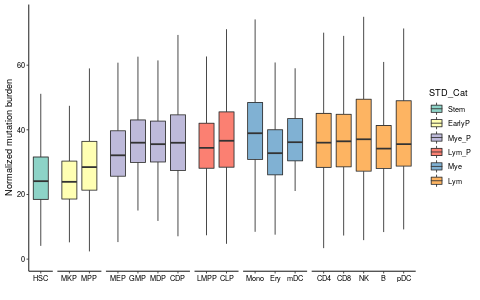

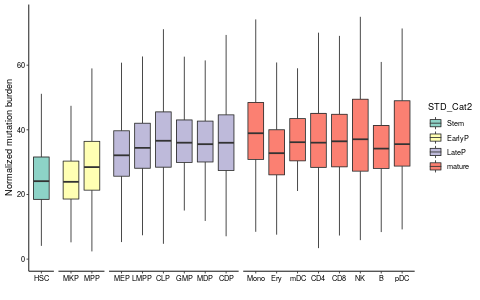

In [536]:
options(repr.plot.width=8,repr.plot.height=5,repr.plot.res=60)
ggplot(CheckVNumber.sensitive)+aes(STD.CellType,MutationBurden,fill=STD_Cat)+geom_boxplot(outlier.shape =NA )+ylim(0,75)+
    facet_grid(~STD_Cat,space = "free",scale="free")+theme_classic()+scale_fill_brewer(palette = "Set3") +#+coord_flip()
    theme(strip.text=element_blank(),axis.text = element_text(color="black"),)+labs(x="",y="Normalized mutation burden") 

ggplot(CheckVNumber.sensitive)+aes(STD.CellType,MutationBurden,fill=STD_Cat2)+geom_boxplot(outlier.shape =NA )+ylim(0,75)+
    facet_grid(~STD_Cat2,space = "free",scale="free")+theme_classic()+scale_fill_brewer(palette = "Set3")+#+coord_flip()
    theme(strip.text=element_blank(),axis.text = element_text(color="black"),)+labs(x="",y="Normalized mutation burden") 
#   
#ggplot(CheckVNumber.verysensitive)+aes(CellType,MutationBurden,fill=Label)+geom_boxplot()+ylim(0,100)#+coord_flip()

In [509]:
wilcox.test(subset(CheckVNumber.sensitive,STD_Cat %in% c("Stem","EarlyP"))$MutationBurden,subset(CheckVNumber.sensitive,STD_Cat %in% c("Mye_P","Lym_P"))$MutationBurden)
wilcox.test(subset(CheckVNumber.sensitive,STD_Cat %in% c("Stem","EarlyP"))$MutationBurden,subset(CheckVNumber.sensitive,STD_Cat %in% c("Mye","Lym"))$MutationBurden)


	Wilcoxon rank sum test with continuity correction

data:  subset(CheckVNumber.sensitive, STD_Cat %in% c("Stem", "EarlyP"))$MutationBurden and subset(CheckVNumber.sensitive, STD_Cat %in% c("Mye_P", "Lym_P"))$MutationBurden
W = 13505877, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0



	Wilcoxon rank sum test with continuity correction

data:  subset(CheckVNumber.sensitive, STD_Cat %in% c("Stem", "EarlyP"))$MutationBurden and subset(CheckVNumber.sensitive, STD_Cat %in% c("Mye", "Lym"))$MutationBurden
W = 15146246, p-value < 2.2e-16
alternative hypothesis: true location shift is not equal to 0


In [941]:
Donor4_HSC_HPC_BMMC.RNA.seurat

An object of class Seurat 
27346 features across 20125 samples within 1 assay 
Active assay: RNA (27346 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

#### Reclustering to examine cell states

In [196]:
Donor4_HSC_HPC_BMMC.Mtx<-MergeMtx(list(Donor04_BMMC_Multiome_wrapper$seurat@assays$RNA@counts,Donor04_HPC_Multiome_wrapper$seurat@assays$RNA@counts,Donor04_HSC_Multiome_wrapper$seurat@assays$RNA@counts),c(3,2,1))

In [197]:
Donor4_HSC_HPC_BMMC.RNA.seurat<-GEM_Wrapper(Donor4_HSC_HPC_BMMC.Mtx)

Loading required package: Seurat

Attaching SeuratObject

Centering and scaling data matrix

PC_ 1 
Positive:  CDK6, MED12L, NKAIN2, TCF4, GAPDH, MEIS1, ZNF385D, TAFA2, PTMA, DACH1 
	   SOX4, HMGB1, ZNF521, KIAA1211, CALN1, STMN1, CASC15, ANGPT1, CDC42BPA, TUBA1B 
	   CHRM3, HSPD1, TUBB, LRMDA, HIST1H1C, HIST1H1D, NAALADL2, CCSER1, MIR924HG, YBX1 
Negative:  CD247, FYB1, PARP8, BCL11B, FYN, LINC01619, SKAP1, ETS1, HBA2, CAMK4 
	   CD96, PITPNC1, SYNE2, PRKCA, STAT4, TC2N, ITK, SLFN12L, CAMK2D, ARL4C 
	   PDE3B, IL32, THEMIS, HBA1, IKZF3, PCED1B, PIK3R5, MAML2, IL7R, HBB 
PC_ 2 
Positive:  ANK1, SLC25A21, SPTA1, CD36, DIAPH3, MKI67, KEL, SPTB, RHAG, HBB 
	   TLCD4, TOP2A, ASPM, CR1L, SOX6, CENPF, CA1, SLC4A1, POLQ, HBA1 
	   SLC25A37, KNL1, RRM2, NUSAP1, KIF15, BLVRB, HBD, AHSP, CENPE, CIT 
Negative:  AJ009632.2, CALN1, CHRM3, NKAIN2, MEIS1, ANGPT1, PREX2, CRHBP, ADGRG6, LINC01122 
	   MIR99AHG, AVP, RBPMS, INPP4B, SPINK2, MDGA2, PRKG2, MECOM, LIMCH1, ZNF385D 
	   MED12L, GPC5, PCDH9, M

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 20125
Number of edges: 651245

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9232
Number of communities: 17
Elapsed time: 2 seconds


22:18:46 UMAP embedding parameters a = 0.9922 b = 1.112

22:18:46 Read 20125 rows and found 10 numeric columns

22:18:46 Using Annoy for neighbor search, n_neighbors = 30

22:18:46 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:18:49 Writing NN index file to temp file /tmp/Rtmpe0sGb3/file2e6316714d1a

22:18:49 Searching Annoy index using 1 thread, search_k = 3000

22:18:56 Annoy recall = 100%

22:19:08 Commencing smooth kNN distance calibration using 1 thread

22:19:28 Initializing from normalized Laplacian + noise

22:19:29 Commencing optimization for 200 epochs, with 823270 positive edges

22:19:48 Optimization finished



In [246]:
Meta.int<-Translate_RNA2ATAC(Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data,RNAclusterPost = "-1|-2|-3" ) 
Meta.int$ATACName<-paste(Meta.int$ATACName,paste(unlist(lapply(strsplit(row.names(Meta.int),"-"),function(x){x[2]}))),sep="_")
Meta.int$RNAname<-row.names(Meta.int)
Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data<-merge(Meta.int,HSC_HPC_BMMC_mitoTracing.Sensitive@CellMeta[,c("Cell","meanCov","CellType","Label")],by.x="ATACName",by.y="Cell")

In [394]:
row.names(Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data)<-Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data$RNAname

In [257]:
datatoplot<-Donor4_HSC_HPC_BMMC.RNA.seurat@reductions$umap@cell.embeddings %>% as.data.frame %>% tibble::rownames_to_column(var = "RNAname") %>% merge(.,Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data) 

In [261]:
datatoplot$CellType2<-paste(datatoplot$Label,datatoplot$CellType,sep = "_")

Adding missing grouping variables: `CellType`



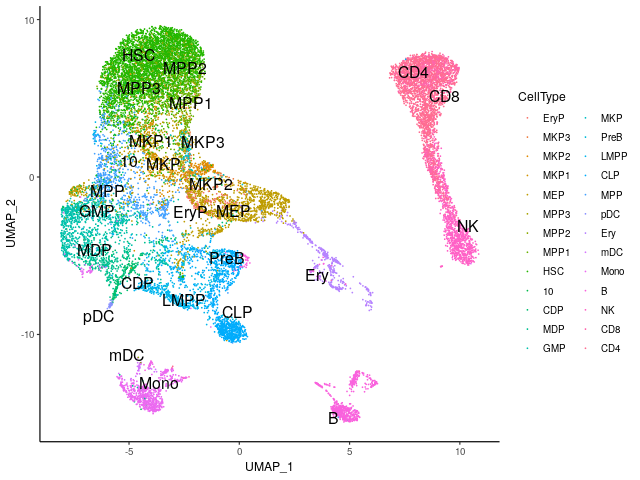

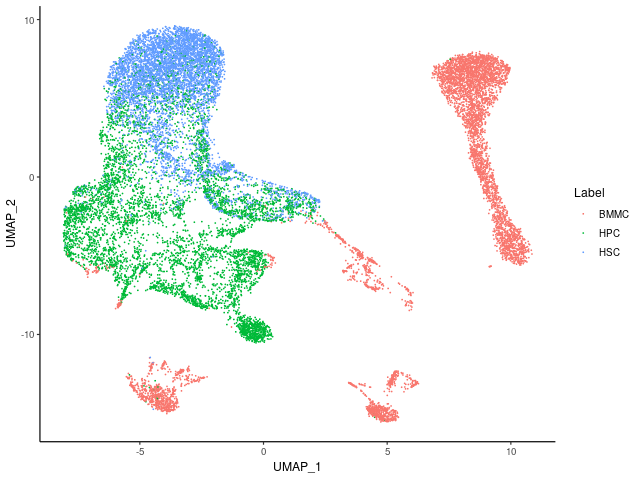

In [356]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=80)
data.label<-datatoplot %>% group_by(CellType) %>% select(UMAP_1, UMAP_2) %>% summarize_all(median)
ggplot(datatoplot)+aes(UMAP_1,UMAP_2,color=CellType)+geom_point(size=0.1)+geom_text_repel(data=data.label,aes(label=CellType),point.padding = NA,segment.color = NA,,max.overlaps  = Inf,color="black",size=5)+theme_classic()
ggplot(datatoplot)+aes(UMAP_1,UMAP_2,color=Label)+geom_point(size=0.1)+theme_classic()


In [263]:
unique(datatoplot$CellType2)

[1] "HPC_MDP"   "BMMC_CD4"  "HSC_HSC"   "HPC_MEP"   "HPC_MKP"   "HPC_LMPP" 
 [7] "HSC_MPP2"  "BMMC_B"    "HPC_MPP"   "HPC_CLP"   "HPC_GMP"   "HSC_MKP1" 
[13] "HPC_HSC"   "HSC_MPP1"  "BMMC_CD8"  "BMMC_Mono" "HSC_EryP"  "BMMC_NK"  
[19] "HPC_PreB"  "HPC_CDP"   "BMMC_Ery"  "HSC_MKP2"  "HSC_MPP3"  "HSC_10"   
[25] "HSC_MKP3"  "HSC_MEP"   "BMMC_mDC"  "BMMC_pDC"

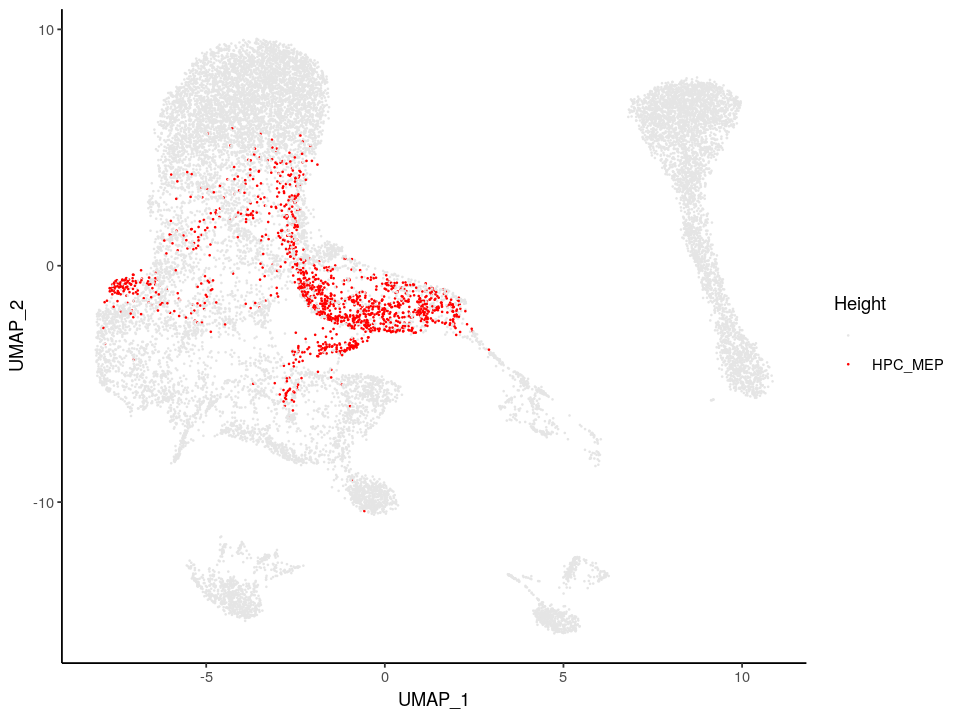

In [429]:
# To highlight any population
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=120)
datatoplot %>% mutate(Height=ifelse(CellType2 %in% c("HPC_MEP"),CellType2,"")) %>% ggplot()+aes(UMAP_1,UMAP_2,color=Height)+geom_point(size=0.1)+scale_color_manual(values=c("grey90","red"))+theme_classic()

In [288]:
head(CheckVNumber.sensitive)

,x,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,⋯,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label,Total,VerySensitive,Sensitive,Specific,MutationBurden
,<dbl>,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,⋯,<dbl>,<fct>,<fct>,<fct>,<chr>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAAGCAAACTAAC_3,18,AAACAAGCAAACTAAC_3,34.10007,SeuratProject,1908,1131,11590,4971,2248,1130,⋯,0.4543574,4,4,CD4,BMMC,1043,0.9520614,0.8935762,0.8322148,59.07254
AAACAAGCAAGGGAGC_3,11,AAACAAGCAAGGGAGC_3,26.10809,SeuratProject,1691,1078,7418,3568,2120,1079,⋯,0.5443370,0,0,CD4,BMMC,759,0.9657444,0.8866930,0.8260870,47.51648
AAACAAGCACATTGTC_1,52,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,⋯,0.5067012,0,0,HSC,HSC,2207,0.9256910,0.8056185,0.7018577,86.35375
AAACAAGCACCTCGAC_2,30,AAACAAGCACCTCGAC_2,47.40672,SeuratProject,3555,2016,18492,8735,4483,2017,⋯,0.4712858,2,2,HSC,HPC,1291,0.9659179,0.7962820,0.6576297,79.47205
AAACAAGCACTTCAAC_3,22,AAACAAGCACTTCAAC_3,49.50824,SeuratProject,2279,1315,12024,5290,2359,1312,⋯,0.5422579,3,3,CD8,BMMC,1432,0.9657821,0.9071229,0.8414804,48.98680
AAACAAGCACTTGCTG_1,47,AAACAAGCACTTGCTG_1,122.72612,SeuratProject,7744,3007,53533,19345,6280,3004,⋯,0.4561504,8,8,MKP2,HSC,3582,0.9505863,0.8520380,0.7682859,44.94713


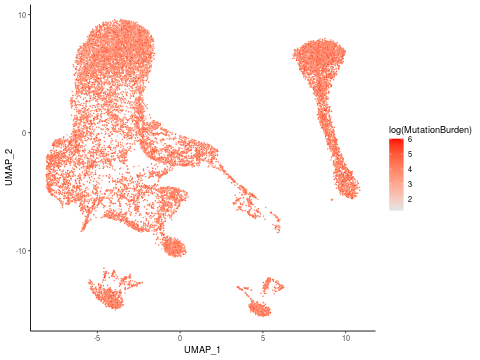

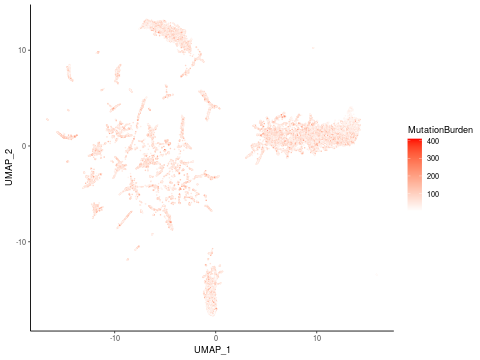

In [358]:
# Try to plot the mutation burden on UMAP
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=60)
merge(datatoplot,CheckVNumber.sensitive[,c("MutationBurden","Cell")],by.x="ATACName",by.y="Cell") %>% 
    ggplot()+aes(UMAP_1,UMAP_2,color=log(MutationBurden))+geom_point(size=0.1)+theme_classic()+scale_color_gradient(low="grey90",high="red")

merge(HSC_HPC_BMMC_mitoTracing.Sensitive@DataToplotList@clustering %>% tibble::rownames_to_column(var = "ATACName"),CheckVNumber.sensitive[,c("MutationBurden","Cell")],by.x="ATACName",by.y="Cell") %>% 
    ggplot()+aes(UMAP_1,UMAP_2,color=MutationBurden)+geom_point(size=0.1)+theme_classic()+scale_color_gradient2(low="darkgreen",high="red",mid="white")

#### Define HSC signature score and corelate with mito mutation burden

In [405]:
DefaultAssay(Donor4_HSC_HPC_BMMC.RNA.seurat)<-"RNA"
HSCsignature_list <- list(c("CD34", "HLF", "CRHBP"))
Donor4_HSC_HPC_BMMC.RNA.seurat<- AddModuleScore(object = Donor4_HSC_HPC_BMMC.RNA.seurat, features = HSCsignature_list, name = "HSCsignature")

In [410]:
CheckVNumber.sensitive<-merge(CheckVNumber.sensitive,Donor4_HSC_HPC_BMMC.RNA.seurat@meta.data[,c("ATACName","HSCsignature1")],by.x="Cell",by.y="ATACName")

`geom_smooth()` using formula 'y ~ x'



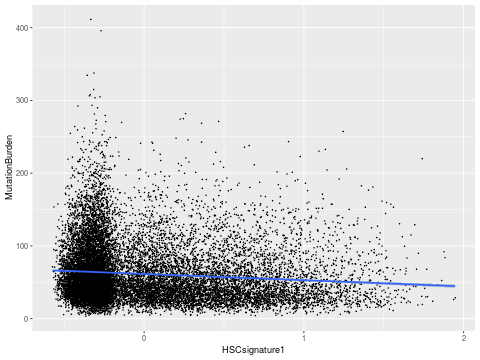

In [421]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=60)
ggplot(CheckVNumber.sensitive)+aes(HSCsignature1,MutationBurden)+geom_point(size=0.1)+geom_smooth(method="lm")

,AAACAGCCAATTAGCT-3,AAACAGCCAGCTCATA-3,AAACAGCCATAGCGGA-3,AAACATGCAAGCCACT-3,AAACATGCAAGGCCAA-3,AAACCAACAGGATAAC-3,AAACCAACATGTCAGC-3,AAACCGAAGCAGGTTT-3,AAACCGAAGGATCACT-3,AAACCGAAGTAAGTCC-3,⋯,TTTGTGTTCGATTTGA-1,TTTGTGTTCGGTTAGT-1,TTTGTGTTCTAAGGAG-1,TTTGTGTTCTGCAAAC-1,TTTGTTGGTAACTACG-1,TTTGTTGGTAGTTAAC-1,TTTGTTGGTGGTTCTT-1,TTTGTTGGTGTTTCAC-1,TTTGTTGGTTAACGAT-1,TTTGTTGGTTAGGCGT-1
CD34,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,-0.5777219,⋯,-0.5777219,1.580695,0.8076249,-0.5777219,1.6885436,-0.5777219,0.4592348,0.9513382,-0.5777219,-0.5777219
HLF,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,-0.4216528,⋯,-0.4216528,1.945623,1.0977470,1.4927424,-0.4216528,0.9597676,2.3379728,1.2553666,-0.4216528,1.8817302
CRHBP,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,-0.5516268,⋯,2.6210016,1.863895,1.5362558,-0.5516268,2.4377876,1.6998264,2.3245200,0.1744177,1.8456012,1.0907712


# Mutation classification analysis

<code style="background:yellow;color:black">This analysis has been largely moved to Donor4Donor9.basics.ipynb</code>

In [735]:
DN4_HSC_HPC_BMMC_mitoTracing.verysensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.verysensitive")
DN4_HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [737]:
DN9_HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN9_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [739]:
DN1_CD34_BMMC_mitoTracing.VerySensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN1_CD34_BMMC_mitoTracing.VerySensitive")

In [835]:
DN1_BMMC_mitoTracing.VerySensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN1_BMMC_mitoTracing.VerySensitive")

## Check the top variants across three donors

In [882]:
## Look at the variant with most and least cells, summarize the cell numbers per variants across donors
DN4.topV<-DN4_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V4=.,n4=1:length(.),f4=./17669) 
DN9.topV<-DN9_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V9=.,n9=1:length(.),f9=./26618) 
DN1.topV<-DN1_CD34_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V1=.,n1=1:length(.),f1=./12243)
DN1BMMC.topV<-DN1_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V1BM=.,n1BM=1:length(.),f1BM=./5585)

In [883]:
## Look at the variant with most and least cells, summarize the fragments numbers per variants across donors
#_F means fragments
DN4.topV_F<-DN4_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V4_F=.,n4_F=1:length(.),f4_F=./17669) 
DN9.topV_F<-DN9_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V9_F=.,n9_F=1:length(.),f9_F=./26618) 
DN1.topV_F<-DN1_CD34_BMMC_mitoTracing.VerySensitive@Cts.Mtx %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V1_F=.,n1_F=1:length(.),f1_F=./12243)
DN1BMMC.topV_F<-DN1_BMMC_mitoTracing.VerySensitive@Cts.Mtx %>% as.matrix() %>% colSums %>% .[order(.,decreasing=T)] %>% data.frame(V1BM_F=.,n1BM_F=1:length(.),f1BM_F=./5585)

In [884]:
nrow(DN4_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi)
nrow(DN9_HSC_HPC_BMMC_mitoTracing.Sensitive@Cts.Mtx.bi)
nrow(DN1_CD34_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi)
nrow(DN1_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi)

[1] 17669

[1] 26618

[1] 12243

[1] 5585

In [890]:
topV<-Tomerge_v2(DN4.topV,DN9.topV) %>% Tomerge_v2(.,DN1.topV) %>% Tomerge_v2(.,DN1BMMC.topV)
topV_F<-Tomerge_v2(DN4.topV_F,DN9.topV_F) %>% Tomerge_v2(.,DN1.topV_F) %>% Tomerge_v2(.,DN1BMMC.topV_F)

In [891]:
topV_master<-Tomerge_v2(topV,topV_F)

Warning message:
“Removed 1 rows containing missing values (geom_point).”


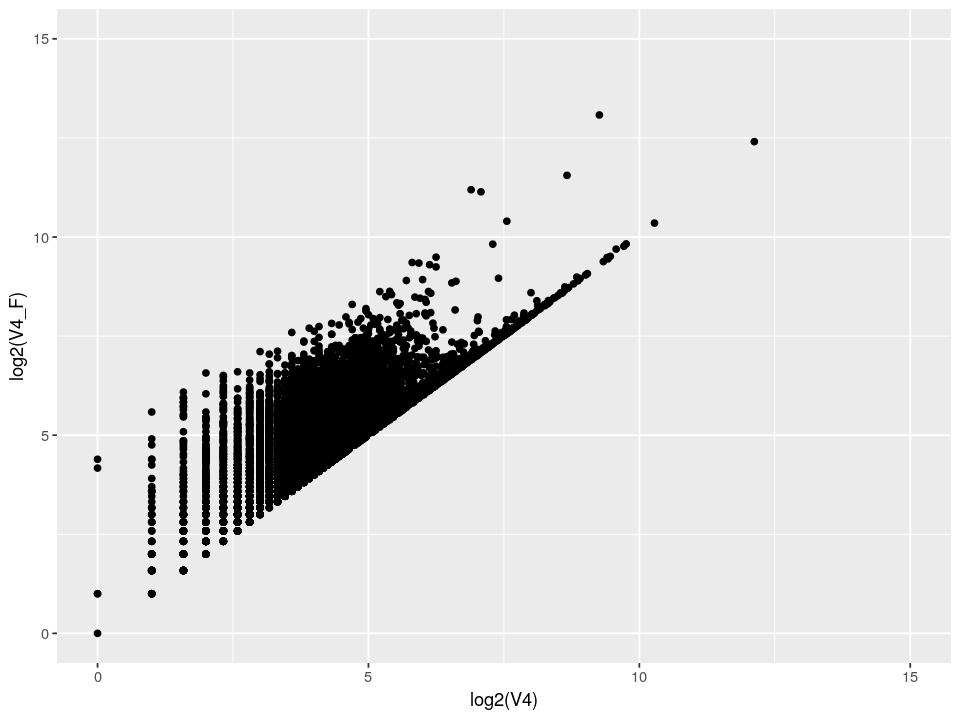

In [900]:
ggplot(topV_master)+aes(log2(V4),log2(V4_F))+geom_point()+xlim(0,15)+ylim(0,15)

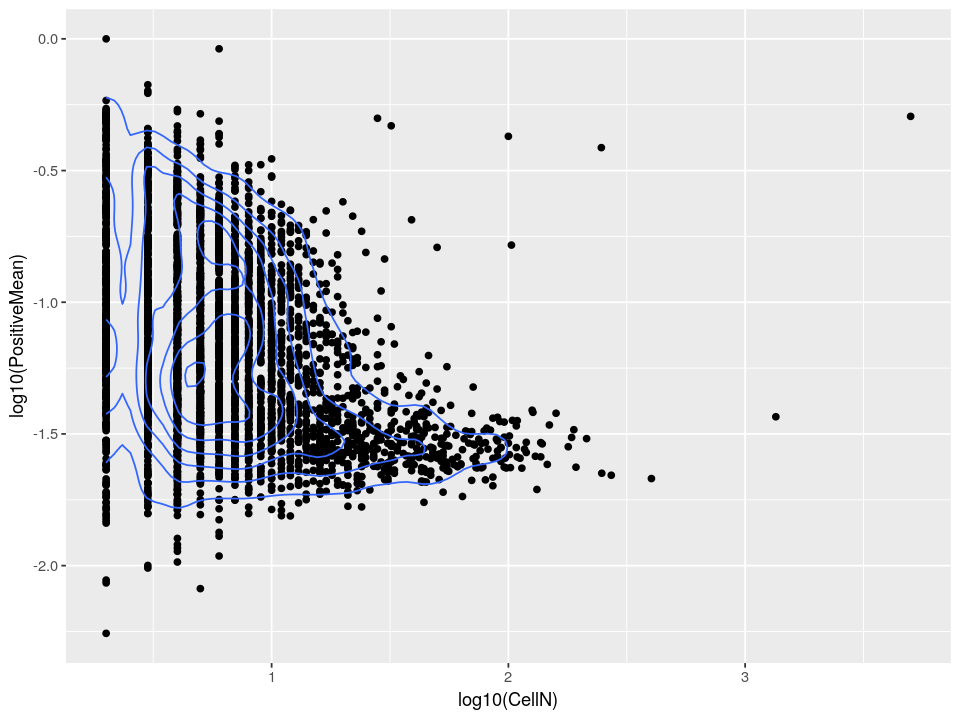

In [942]:
## Check out if the variant with more cells tend to also have more variant copies per cell, is there a clear correlation? 
DN4_HSC_HPC_BMMC_mitoTracing.Sensitive@V.fitered.list$BMMC %>% ggplot()+aes(log10(CellN),log10(PositiveMean))+geom_point()+geom_density_2d()
# DN4_HSC_HPC_BMMC_mitoTracing.Sensitive@V.fitered.list$BMMC %>% .[order(.$CellN,decreasing=T),] %>% .[2000:2050,]

In [878]:
topV[order(topV$n4,decreasing=F),] %>% head(.,n=20)

,V4,n4,f4,V9,n9,f9,V1,n1,f1,V1BM,n1BM,f1BM
,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<int>,<dbl>
Variants310TC,45099,1,2.55243647,37230,1,1.3986775866,12091,1,0.987584742,3351,1,0.600000000
Variants9979GA,8656,2,0.48989756,157,344,0.0058982643,48,820,0.003920608,17,1643,0.003043868
Variants3109TC,5432,3,0.30743109,6784,2,0.2548651289,1956,2,0.159764764,385,2,0.068934646
Variants146TC,3011,4,0.17041146,358,72,0.0134495454,261,19,0.021318304,65,38,0.011638317
Variants9181AG,2341,5,0.13249194,75,1458,0.0028176422,30,2098,0.002450380,14,2279,0.002506714
Variants5913GA,2258,6,0.12779444,110,745,0.0041325419,76,296,0.006207629,27,502,0.004834378
Variants3244GA,1351,7,0.07646160,1864,3,0.0700278007,419,8,0.034223638,52,73,0.009310654
Variants5764CT,1306,8,0.07391477,1551,4,0.0582688406,574,5,0.046883934,NA,NA,NA
Variants12219AG,908,9,0.05138944,1125,7,0.0422646330,498,6,0.040676305,99,13,0.017726052


# Clonal map

In [304]:
head(HSC_HPC_BMMC_mitoTracing.Sensitive@DataToplotList@clustering)

,orig.ident.x,nCount_mitoV,nFeature_mitoV,mitoV_snn_res.0.3,seurat_clusters.x,UMAP_1,UMAP_2,LSI_1,LSI_2,LSI_3,⋯,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters.y,CellType,Label
,<fct>,<dbl>,<int>,<fct>,<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCAAACTAAC_3,SeuratProject,17,17,1,1,-3.3719068,10.7454177,0.87704525,1.60532022,0.36469829,⋯,11590,4971,2248,1130,0.5456426,0.4543574,4,4,CD4,BMMC
AAACAAGCAAGGGAGC_3,SeuratProject,10,10,2,2,-0.8430534,-13.2650508,-2.23483189,0.07607282,-0.04984743,⋯,7418,3568,2120,1079,0.4556630,0.5443370,0,0,CD4,BMMC
AAACAAGCACATTGTC_1,SeuratProject,20,20,0,0,10.9094247,0.6290992,-0.21225308,-0.62023888,0.29916675,⋯,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACCTCGAC_2,SeuratProject,13,13,0,0,9.8398513,1.9148240,-0.12890973,-0.63144987,0.25642210,⋯,18492,8735,4483,2017,0.5287142,0.4712858,2,2,HSC,HPC
AAACAAGCACTTCAAC_3,SeuratProject,14,14,0,0,8.0291328,2.2486947,-0.04789237,-0.58541459,0.26147157,⋯,12024,5290,2359,1312,0.4577421,0.5422579,3,3,CD8,BMMC
AAACAAGCACTTGCTG_1,SeuratProject,23,23,12,12,-1.8532866,-5.8240513,1.69862852,1.35737849,-4.37897539,⋯,53533,19345,6280,3004,0.5438496,0.4561504,8,8,MKP2,HSC


HSC_HPC_BMMC_mitoTracing.Sensitive@

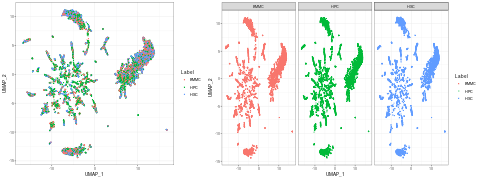

In [219]:
options(repr.plot.width=16, repr.plot.height=6,repr.plot.res=30)
p1<-HSC_HPC_BMMC_mitoTracing@DataToplotList@clustering %>% ggplot()+aes(UMAP_1,UMAP_2,color=Label)+geom_point(size=0.6)+theme_bw()
p2<-HSC_HPC_BMMC_mitoTracing@DataToplotList@clustering %>% ggplot()+aes(UMAP_1,UMAP_2,color=Label)+geom_point(size=0.6)+facet_grid(.~Label)+theme_bw()
grid.arrange(p1,p2,layout_matrix=t(matrix(c(1,1,1,2,2,2,2))))

# Quick tree

In [55]:
data(CellPCT)
V.weight<-data.frame(weight=1-CellPCT$muRate)
V.weight$Variants<-paste("Variants",gsub("_","",CellPCT$Variant),sep="")
head(V.weight,n=3)

,weight,Variants
,<dbl>,<chr>
1,0.2149264,Variants310TC
2,0.7603385,Variants3109TC
3,0.9287734,Variants5764CT


In [20]:
BMMC_mitoTracing<-Create_mitoTracing(GTsummary_list=list(DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_BMMC.depth),
                feature.list_list=list(DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_BMMC.meta),
                labels=c("BMMC"),thr="Sensitive")
BMMC_mitoTracing<-Make_matrix(BMMC_mitoTracing)
BMMC_mitoTracing<-SeuratLSIClustering(BMMC_mitoTracing,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
BMMC_mitoTracing<-AddDist(BMMC_mitoTracing,weightDF=V.weight,LSIdist=T,dim=2:50)
BMMC_mitoTracing<-AddDatatoplot_clustering(BMMC_mitoTracing)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

15:08:18 UMAP embedding parameters a = 0.9922 b = 1.112

15:08:18 Read 5672 rows and found 49 numeric columns

15:08:18 Using Annoy for neighbor search, n_neighbors = 30

15:08:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:08:20 Writing NN index file to temp file /tmp/RtmpHRMZru/fileaefc2ba665cd

15:08:20 Searching Annoy index using 1 thread, search_k = 3000

15:08:22 Annoy recall = 100%

15:08:25 Commencing smooth kNN distance calibration using 1 thread

15:08:25 66 smooth knn distance failures

15:08:30 Initializing from normalized Laplacian + noise

15:08:30 Commencing optimization for 500 epochs, with 240490 positive edges

15:08:40 Optimization finished

Computing nearest neighbor graph

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5672
Number of edges: 208324

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9479
Number of communities: 51
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [56]:
BMMC_mitoTracing

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
     "Sensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 5816"

BMMC 
5816 
[1] "Total Variant number: 3896"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

In [48]:
BMMC_mitoTracing.VS<-Create_mitoTracing(GTsummary_list=list(DN4_BMMC.VariantsGTSummary),
                depth_list=list(DN4_BMMC.depth),
                feature.list_list=list(DN4_BMMC.Variants.feature.lst),
                meta_list=list(Donor04_BMMC.meta),
                labels=c("BMMC"),thr="VerySensitive")
BMMC_mitoTracing.VS<-Make_matrix(BMMC_mitoTracing.VS)
BMMC_mitoTracing.VS<-SeuratLSIClustering(BMMC_mitoTracing.VS,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
BMMC_mitoTracing.VS<-AddDist(BMMC_mitoTracing.VS,weightDF=V.weight,LSIdist=T,dim=2:50)
BMMC_mitoTracing.VS<-AddDatatoplot_clustering(BMMC_mitoTracing.VS)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

22:42:56 UMAP embedding parameters a = 0.9922 b = 1.112

22:42:56 Read 5754 rows and found 49 numeric columns

22:42:56 Using Annoy for neighbor search, n_neighbors = 30

22:42:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:42:59 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b4526e4d2

22:42:59 Searching Annoy index using 1 thread, search_k = 3000

22:43:01 Annoy recall = 100%

22:43:04 Commencing smooth kNN distance calibration using 1 thread

22:43:04 22 smooth knn distance failures

22:43:09 Initializing from normalized Laplacian + noise

22:43:09 Commencing optimization for 500 epochs, with 248948 positive edges

22:43:19 Optimization finished

Computing nearest neighbor graph


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5754
Number of edges: 238762

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9420
Number of communities: 47
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [49]:
BMMC_mitoTracing.VS

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
 "VerySensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 5816"

BMMC 
5816 
[1] "Total Variant number: 4403"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

---

In [57]:
HPC_mitoTracing<-Create_mitoTracing(GTsummary_list=list(DN4_HPC.VariantsGTSummary),
                depth_list=list(DN4_HPC.depth),
                feature.list_list=list(DN4_HPC.Variants.feature.lst),
                meta_list=list(Donor04_HPC.meta),
                labels=c("HPC"),thr="Sensitive")
HPC_mitoTracing<-Make_matrix(HPC_mitoTracing)
HPC_mitoTracing<-SeuratLSIClustering(HPC_mitoTracing,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
HPC_mitoTracing<-AddDist(HPC_mitoTracing,weightDF=V.weight,LSIdist=T,dim=2:50)
HPC_mitoTracing<-AddDatatoplot_clustering(HPC_mitoTracing)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

22:54:49 UMAP embedding parameters a = 0.9922 b = 1.112

22:54:49 Read 6170 rows and found 49 numeric columns

22:54:49 Using Annoy for neighbor search, n_neighbors = 30

22:54:49 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:54:52 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b44b1c51e8

22:54:52 Searching Annoy index using 1 thread, search_k = 3000

22:54:55 Annoy recall = 100%

22:54:57 Commencing smooth kNN distance calibration using 1 thread

22:55:03 Initializing from normalized Laplacian + noise

22:55:03 Commencing optimization for 500 epochs, with 275544 positive edges

22:55:14 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6170
Number of edges: 288178

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9469
Number of communities: 52
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [58]:
HPC_mitoTracing

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
     "Sensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 6210"

 HPC 
6210 
[1] "Total Variant number: 4803"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

In [59]:
HPC_mitoTracing.VS<-Create_mitoTracing(GTsummary_list=list(DN4_HPC.VariantsGTSummary),
                depth_list=list(DN4_HPC.depth),
                feature.list_list=list(DN4_HPC.Variants.feature.lst),
                meta_list=list(Donor04_HPC.meta),
                labels=c("HPC"),thr="VerySensitive")
HPC_mitoTracing.VS<-Make_matrix(HPC_mitoTracing.VS)
HPC_mitoTracing.VS<-SeuratLSIClustering(HPC_mitoTracing.VS,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
HPC_mitoTracing.VS<-AddDist(HPC_mitoTracing.VS,weightDF=V.weight,LSIdist=T,dim=2:50)
HPC_mitoTracing.VS<-AddDatatoplot_clustering(HPC_mitoTracing.VS)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

22:58:08 UMAP embedding parameters a = 0.9922 b = 1.112

22:58:08 Read 6208 rows and found 49 numeric columns

22:58:08 Using Annoy for neighbor search, n_neighbors = 30

22:58:08 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:58:10 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b431e9c524

22:58:10 Searching Annoy index using 1 thread, search_k = 3000

22:58:13 Annoy recall = 100%

22:58:16 Commencing smooth kNN distance calibration using 1 thread

22:58:21 Initializing from normalized Laplacian + noise

22:58:21 Commencing optimization for 500 epochs, with 279694 positive edges

22:58:32 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6208
Number of edges: 331274

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9263
Number of communities: 43
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [60]:
HPC_mitoTracing.VS

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
 "VerySensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 6210"

 HPC 
6210 
[1] "Total Variant number: 5591"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

---

In [61]:
HSC_mitoTracing<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary),
                depth_list=list(DN4_HSC.depth),
                feature.list_list=list(DN4_HSC.Variants.feature.lst),
                meta_list=list(Donor04_HSC.meta),
                labels=c("HSC"),thr="Sensitive")
HSC_mitoTracing<-Make_matrix(HSC_mitoTracing)
HSC_mitoTracing<-SeuratLSIClustering(HSC_mitoTracing,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
HSC_mitoTracing<-AddDist(HSC_mitoTracing,weightDF=V.weight,LSIdist=T,dim=2:50)
HSC_mitoTracing<-AddDatatoplot_clustering(HSC_mitoTracing)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

23:00:27 UMAP embedding parameters a = 0.9922 b = 1.112

23:00:27 Read 5581 rows and found 49 numeric columns

23:00:27 Using Annoy for neighbor search, n_neighbors = 30

23:00:27 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:00:29 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b4af8b5a

23:00:29 Searching Annoy index using 1 thread, search_k = 3000

23:00:32 Annoy recall = 100%

23:00:35 Commencing smooth kNN distance calibration using 1 thread

23:00:35 21 smooth knn distance failures

23:00:41 Initializing from normalized Laplacian + noise

23:00:41 Commencing optimization for 500 epochs, with 251570 positive edges

23:00:52 Optimization finished

Computing nearest neighbor graph



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5581
Number of edges: 205297

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9578
Number of communities: 55
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [62]:
HSC_mitoTracing

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
     "Sensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 5684"

 HSC 
5684 
[1] "Total Variant number: 4397"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

In [64]:
HSC_mitoTracing.VS<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary),
                depth_list=list(DN4_HSC.depth),
                feature.list_list=list(DN4_HSC.Variants.feature.lst),
                meta_list=list(Donor04_HSC.meta),
                labels=c("HSC"),thr="VerySensitive")
HSC_mitoTracing.VS<-Make_matrix(HSC_mitoTracing.VS)
HSC_mitoTracing.VS<-SeuratLSIClustering(HSC_mitoTracing.VS,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
HSC_mitoTracing.VS<-AddDist(HSC_mitoTracing.VS,weightDF=V.weight,LSIdist=T,dim=2:50)
HSC_mitoTracing.VS<-AddDatatoplot_clustering(HSC_mitoTracing.VS)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

23:03:47 UMAP embedding parameters a = 0.9922 b = 1.112

23:03:47 Read 5662 rows and found 49 numeric columns

23:03:47 Using Annoy for neighbor search, n_neighbors = 30

23:03:47 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:03:49 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b4321f18b7

23:03:49 Searching Annoy index using 1 thread, search_k = 3000

23:03:51 Annoy recall = 100%

23:03:54 Commencing smooth kNN distance calibration using 1 thread

23:03:59 Initializing from normalized Laplacian + noise

23:04:00 Commencing optimization for 500 epochs, with 252536 positive edges

23:04:10 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5662
Number of edges: 240745

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9490
Number of communities: 51
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [65]:
HSC_mitoTracing.VS

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
 "VerySensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 5684"

 HSC 
5684 
[1] "Total Variant number: 4945"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplotList"    
[11] "Slot: DistObjects"        "Slot: TREE"              

In [69]:
DN4_sep_BMMC_HPC_HSC_mitotracing_list<-list(BMMC_mitoTracing=BMMC_mitoTracing,
BMMC_mitoTracing.VS=BMMC_mitoTracing.VS,
HPC_mitoTracing=HPC_mitoTracing,
HPC_mitoTracing.VS=HPC_mitoTracing.VS,
HSC_mitoTracing=HSC_mitoTracing,
HSC_mitoTracing.VS=HSC_mitoTracing.VS)

In [656]:
## DN1 BMMC
bmmc.filtered<-readRDS("/lab/solexa_weissman/cweng/Projects/RDS/mutiome.donor01_bmmc01.RNA.filtered.RDS") 

In [658]:
## DN1 BMMC
Donor01_BMMC.meta<-Translate_RNA2ATAC(bmmc.filtered@meta.data,PostFix = F)
head(Donor01_BMMC.meta,n=3)

The following `from` values were not present in `x`: 2, 3



,orig.ident,nCount_RNA,nFeature_RNA,RNA_snn_res.0.5,seurat_clusters,CellType,ATACName
,<fct>,<dbl>,<int>,<fct>,<fct>,<fct>,<chr>
AAACAGCCAAAGGTAC-1,bmmc,1476,995,0,0,CD8,ACAGCGGGTAGCTAAG
AAACAGCCACAACAAA-1,bmmc,4620,2334,8,8,CLP,ACAGCGGGTTACGAAG
AAACAGCCACAAGCCT-1,bmmc,1747,1095,0,0,CD8,ACAGCGGGTTCATTGA


In [659]:
## DN1 BMMC

DN1_BMMC_mitoTracing<-Create_mitoTracing(GTsummary_list=list(DN1BMMC1.VariantsGTSummary),
                depth_list=list(DN1BMMC1.depth),
                feature.list_list=list(DN1BMMC1.Variants.feature.lst),
                meta_list=list(Donor01_BMMC.meta),
                labels=c("BMMC"),thr="Sensitive")
DN1_BMMC_mitoTracing<-Make_matrix(DN1_BMMC_mitoTracing)
DN1_BMMC_mitoTracing<-SeuratLSIClustering(DN1_BMMC_mitoTracing,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
DN1_BMMC_mitoTracing<-AddDist(DN1_BMMC_mitoTracing,weightDF=V.weight,LSIdist=T,dim=2:50)
DN1_BMMC_mitoTracing<-AddDatatoplot_clustering(DN1_BMMC_mitoTracing)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

23:16:20 UMAP embedding parameters a = 0.9922 b = 1.112

23:16:20 Read 5217 rows and found 49 numeric columns

23:16:20 Using Annoy for neighbor search, n_neighbors = 30

23:16:20 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:16:22 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b45555d156

23:16:22 Searching Annoy index using 1 thread, search_k = 3000

23:16:24 Annoy recall = 99.77%

23:16:35 Commencing smooth kNN distance calibration using 1 thread

23:16:35 71 smooth knn distance failures

23:16:44 Initializing from normalized Laplacian + noise

23:16:45 Commencing optimization for 500 epochs, with 211552 positive edges

23:16:56 Optimization finished

Computing nearest neighbor gra

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5217
Number of edges: 194459

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8852
Number of communities: 38
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

In [662]:
DN1_BMMC_w_jaccard.njtree<-Make_tree(DN1_BMMC_mitoTracing,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)

In [73]:
#saveRDS(DN4_sep_BMMC_HPC_HSC_mitotracing_list,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_sep_BMMC_HPC_HSC_mitotracing_list")
DN4_sep_BMMC_HPC_HSC_mitotracing_list<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_sep_BMMC_HPC_HSC_mitotracing_list")


In [66]:
DN4_BMMC_w_jaccard.njtree<-Make_tree(BMMC_mitoTracing,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_BMMC_w_cosine.njtree<-Make_tree(BMMC_mitoTracing,d = "w_cosine",algorithm = "nj",onlyreturntree = T)
DN4_BMMC.VS_w_jaccard.njtree<-Make_tree(BMMC_mitoTracing.VS,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_BMMC.VS_w_cosine.njtree<-Make_tree(BMMC_mitoTracing.VS,d = "w_cosine",algorithm = "nj",onlyreturntree = T)

In [75]:
DN4_BMMC_trees_list<-list(DN4_BMMC_w_jaccard.njtree=DN4_BMMC_w_jaccard.njtree,
                     DN4_BMMC_w_cosine.njtree=DN4_BMMC_w_cosine.njtree,
                     DN4_BMMC.VS_w_jaccard.njtree=DN4_BMMC.VS_w_jaccard.njtree,
                     DN4_BMMC.VS_w_cosine.njtree=DN4_BMMC.VS_w_cosine.njtree
)
#saveRDS(DN4_BMMC_trees_list,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_BMMC_trees_list")
DN4_BMMC_trees_list<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_BMMC_trees_list")

In [77]:
DN4_HPC_w_jaccard.njtree<-Make_tree(HPC_mitoTracing,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_HPC_w_cosine.njtree<-Make_tree(HPC_mitoTracing,d = "w_cosine",algorithm = "nj",onlyreturntree = T)
DN4_HPC.VS_w_jaccard.njtree<-Make_tree(HPC_mitoTracing.VS,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_HPC.VS_w_cosine.njtree<-Make_tree(HPC_mitoTracing.VS,d = "w_cosine",algorithm = "nj",onlyreturntree = T)

In [81]:
DN4_HPC_trees_list<-list(DN4_HPC_w_jaccard.njtree=DN4_HPC_w_jaccard.njtree,
                     DN4_HPC_w_cosine.njtree=DN4_HPC_w_cosine.njtree,
                     DN4_HPC.VS_w_jaccard.njtree=DN4_HPC.VS_w_jaccard.njtree,
                     DN4_HPC.VS_w_cosine.njtree=DN4_HPC.VS_w_cosine.njtree
)
#saveRDS(DN4_HPC_trees_list,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HPC_trees_list")
DN4_HPC_trees_list<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HPC_trees_list")

In [78]:
DN4_HSC_w_jaccard.njtree<-Make_tree(HSC_mitoTracing,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_HSC_w_cosine.njtree<-Make_tree(HSC_mitoTracing,d = "w_cosine",algorithm = "nj",onlyreturntree = T)
DN4_HSC.VS_w_jaccard.njtree<-Make_tree(HSC_mitoTracing.VS,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
DN4_HSC.VS_w_cosine.njtree<-Make_tree(HSC_mitoTracing.VS,d = "w_cosine",algorithm = "nj",onlyreturntree = T)

In [82]:
DN4_HSC_trees_list<-list(DN4_HSC_w_jaccard.njtree=DN4_HSC_w_jaccard.njtree,
                     DN4_HSC_w_cosine.njtree=DN4_HSC_w_cosine.njtree,
                     DN4_HSC.VS_w_jaccard.njtree=DN4_HSC.VS_w_jaccard.njtree,
                     DN4_HSC.VS_w_cosine.njtree=DN4_HSC.VS_w_cosine.njtree
)
#saveRDS(DN4_HSC_trees_list,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_trees_list")
DN4_HSC_trees_list<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_trees_list")

# View tree

In [643]:
p1<-ggtree(DN4_BMMC_trees_list$DN4_BMMC_w_jaccard.njtree@treedata, layout="circular",branch.length='none') 
p2<-ggtree(DN4_BMMC_trees_list$DN4_BMMC_w_cosine.njtree@treedata, layout="circular",branch.length='none') 
p3<-ggtree(DN4_BMMC_trees_list$DN4_BMMC.VS_w_jaccard.njtree@treedata, layout="circular",branch.length='none') 
p4<-ggtree(DN4_BMMC_trees_list$DN4_BMMC.VS_w_cosine.njtree@treedata, layout="circular",branch.length='none') 

p5<-ggtree(DN4_HPC_trees_list$DN4_HPC_w_jaccard.njtree@treedata, layout="circular",branch.length='none') 
p6<-ggtree(DN4_HPC_trees_list$DN4_HPC_w_cosine.njtree@treedata, layout="circular",branch.length='none') 
p7<-ggtree(DN4_HPC_trees_list$DN4_HPC.VS_w_jaccard.njtree@treedata, layout="circular",branch.length='none') 
p8<-ggtree(DN4_HPC_trees_list$DN4_HPC.VS_w_cosine.njtree@treedata, layout="circular",branch.length='none') 

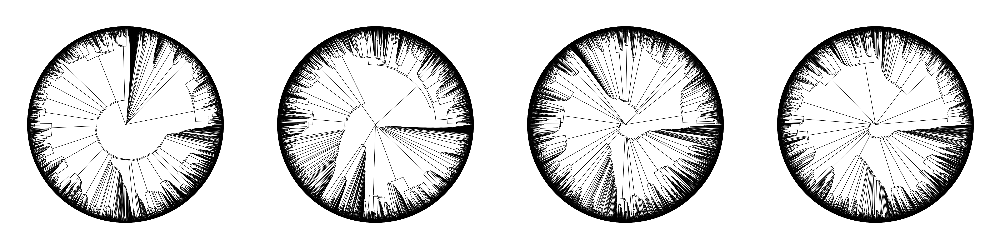

In [635]:
options(repr.plot.width=40,repr.plot.height=10,repr.plot.res=120)
grid.arrange(p1,p2,p3,p4,nrow=1)

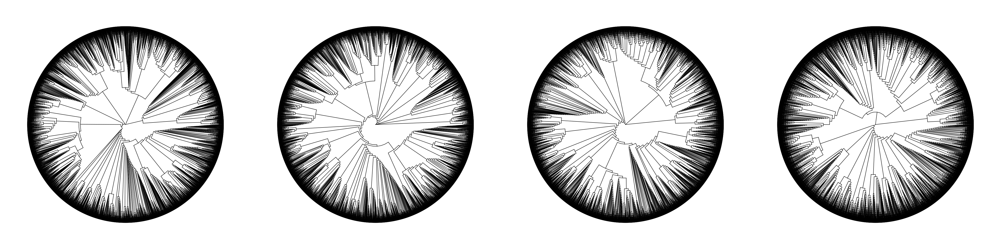

In [644]:
options(repr.plot.width=40,repr.plot.height=10,repr.plot.res=120)
grid.arrange(p5,p6,p7,p8,nrow=1)

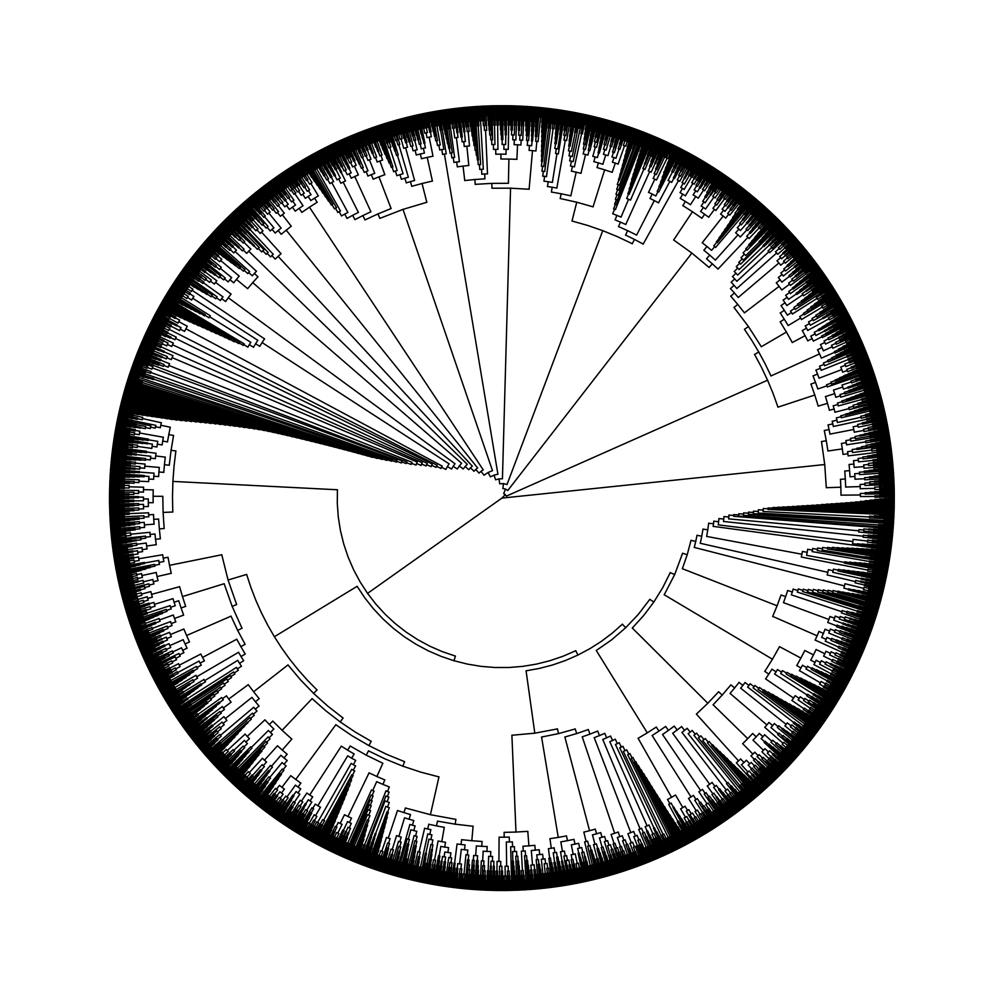

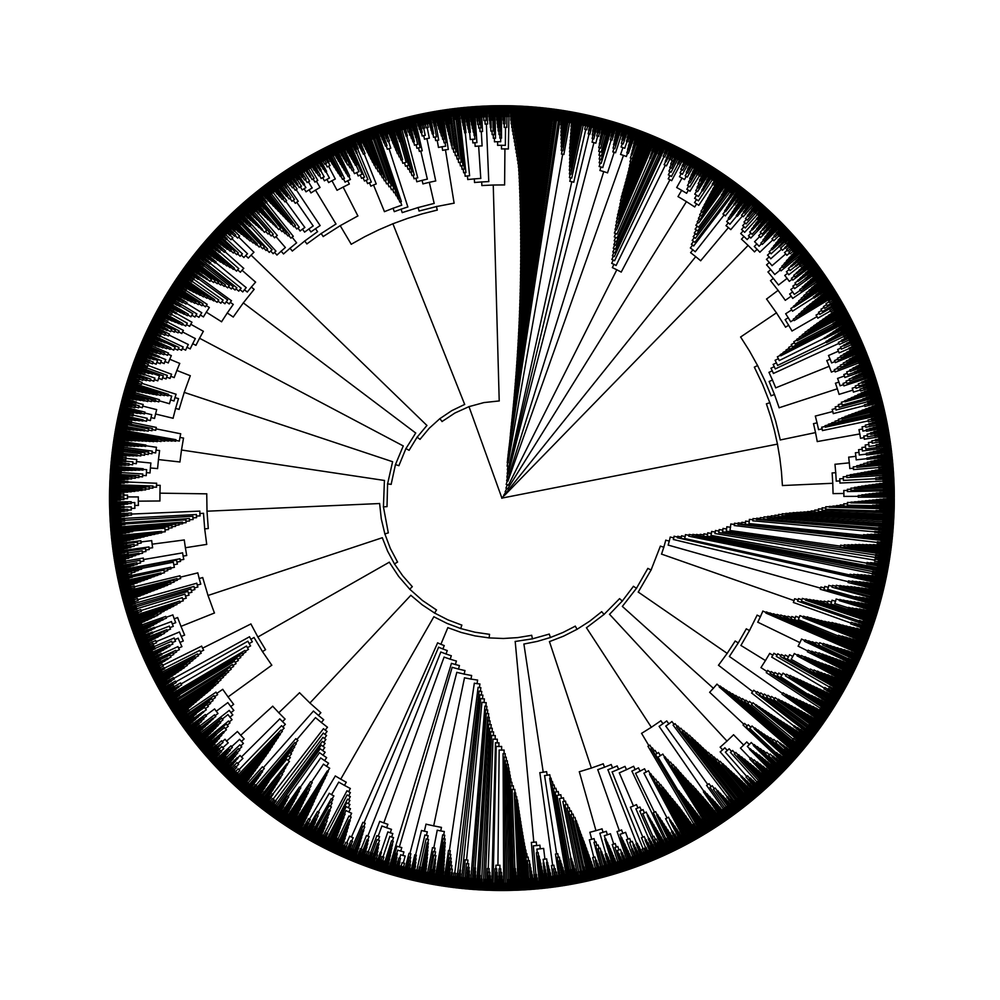

In [665]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=300)
ggtree(DN1_BMMC_w_jaccard.njtree@treedata, layout="circular",branch.length='none') 
p1

# Lineage analysis- Old method

In [212]:
HPC_BMMC_mitoTracing<-Create_mitoTracing(GTsummary_list=list(DN4_BMMC.VariantsGTSummary,DN4_HPC.VariantsGTSummary),
                depth_list=list(DN4_BMMC.depth,DN4_HPC.depth),
                feature.list_list=list(DN4_BMMC.Variants.feature.lst,DN4_HPC.Variants.feature.lst),
                meta_list=list(Donor04_BMMC.meta,Donor04_HPC.meta),
                labels=c("BMMC","HPC"))
HPC_BMMC_mitoTracing<-Make_matrix(HPC_BMMC_mitoTracing)
HPC_BMMC_mitoTracing<-SeuratLSIClustering(HPC_BMMC_mitoTracing)
HPC_BMMC_mitoTracing<-AddDatatoplot_clustering(HPC_BMMC_mitoTracing)
HPC_BMMC_mitoTracing<-AddDist(HPC_BMMC_mitoTracing)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

10:10:26 UMAP embedding parameters a = 0.9922 b = 1.112

10:10:26 Read 12018 rows and found 20 numeric columns

10:10:26 Using Annoy for neighbor search, n_neighbors = 30

10:10:26 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:10:30 Writing NN index file to temp file /tmp/RtmpROxUAT/file493ca45c202

10:10:30 Searching Annoy index using 1 thread, search_k = 3000

10:10:35 Annoy recall = 100%

10:10:39 Commencing smooth kNN distance calibration using 1 thread

10:10:40 11 smooth knn distance failures

10:10:46 Initializing from normalized Laplacian + noise

10:10:46 Commencing optimization for 200 epochs, with 534178 positive edges

10:10:54 Optimization finished

Computing nearest neighbor graph

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12018
Number of edges: 393562

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9659
Number of communities: 34
Elapsed time: 0 seconds
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "

In [146]:
CellTypeInk<-function(x,k,CellTypeDistri){
NearByCell<-x[order(x)] %>% .[2:k] %>% names()
CellTypeT<-subset(CellTypeDistri,Cell %in% NearByCell) 
Ratio<-table(CellTypeT$CellType)/nrow(CellTypeT)
return(Ratio)
}

In [214]:
DistMatrix<-as.matrix(BMMC_mitoTracing@DistObjects@jaccard)

In [215]:
DistMatrix<-as.matrix(HPC_BMMC_mitoTracing@DistObjects@jaccard)

In [216]:
NearByCellType.k10<-apply(DistMatrix,1,CellTypeInk,k=11,CellTypeDistri=BMMC_mitoTracing@CellMeta)
NearByCellType.k20<-apply(DistMatrix,1,CellTypeInk,k=21,CellTypeDistri=BMMC_mitoTracing@CellMeta)
NearByCellType.k50<-apply(DistMatrix,1,CellTypeInk,k=51,CellTypeDistri=BMMC_mitoTracing@CellMeta)

In [219]:
NearByCellType.k10<-apply(DistMatrix,1,CellTypeInk,k=11,CellTypeDistri=HPC_BMMC_mitoTracing@CellMeta)
NearByCellType.k20<-apply(DistMatrix,1,CellTypeInk,k=21,CellTypeDistri=HPC_BMMC_mitoTracing@CellMeta)
NearByCellType.k50<-apply(DistMatrix,1,CellTypeInk,k=51,CellTypeDistri=HPC_BMMC_mitoTracing@CellMeta)

In [217]:
# X<-BMMC_mitoTracing@CellMeta[,c("Cell","CellType")] %>% tibble::column_to_rownames("Cell")
X<-BMMC_mitoTracing@CellMeta[,"CellType",drop=F]
NearByCellType.k50.meta<-t(NearByCellType.k50) %>% Tomerge_v2(.,X) #%>% subset(.,CellType!="pDC")
NearByCellType.k20.meta<-t(NearByCellType.k20) %>% Tomerge_v2(.,X) #%>% subset(.,CellType!="pDC")
NearByCellType.k10.meta<-t(NearByCellType.k10) %>% Tomerge_v2(.,X) #%>% subset(.,CellType!="pDC")

In [218]:
head(NearByCellType.k50.meta)

,pDC,Ery,mDC,Mono,B,NK,CD8,CD4,CellType
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>
AAACAAGCAAACTAAC_1,0.00000000,0.02500000,0,0.05000000,0.07500000,0.15000000,0.22500000,0.4750000,CD4
AAACAAGCAAGGGAGC_1,0.02702703,0.02702703,0,0.16216216,0.08108108,0.18918919,0.10810811,0.4054054,CD4
AAACAAGCACCTCGAC_2,0.03448276,0.03448276,0,0.10344828,0.06896552,0.20689655,0.06896552,0.4827586,NA
AAACAAGCACTTCAAC_1,0.02564103,0.00000000,0,0.12820513,0.07692308,0.02564103,0.15384615,0.5897436,CD8
AAACCAGGTAACGAGC_2,0.03846154,0.03846154,0,0.07692308,0.03846154,0.23076923,0.15384615,0.4230769,NA
AAACCAGGTGCAACGG_2,0.00000000,0.04761905,0,0.28571429,0.19047619,0.04761905,0.14285714,0.2857143,NA


In [194]:
# NearByCellType.k50.meta.summary<-NearByCellType.k50.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),pDC=mean(pDC),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))
# NearByCellType.k20.meta.summary<-NearByCellType.k20.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),pDC=mean(pDC),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))
# NearByCellType.k10.meta.summary<-NearByCellType.k10.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),pDC=mean(pDC),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))
## Remove pDC
NearByCellType.k50.meta.summary<-NearByCellType.k50.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))
NearByCellType.k20.meta.summary<-NearByCellType.k20.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))
NearByCellType.k10.meta.summary<-NearByCellType.k10.meta %>% group_by(CellType) %>% dplyr::summarise(CD4=mean(CD4),CD8=mean(CD8),B=mean(B),NK=mean(NK),mDC=mean(mDC),Ery=mean(Ery),Mono=mean(Mono))

In [195]:
NearByCellType.k20.meta.summary

CellType,CD4,CD8,B,NK,mDC,Ery,Mono
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Ery,0.4041353,0.1581454,0.08032581,0.1909774,0.005137845,0.05939850,0.09561404
mDC,0.4254717,0.1528302,0.07075472,0.1849057,0.008490566,0.04905660,0.10377358
Mono,0.4230028,0.1588154,0.06714876,0.1888430,0.005991736,0.04566116,0.10544077
B,0.4197557,0.1611351,0.07693966,0.1660201,0.006537356,0.04719828,0.11580460
NK,0.4061529,0.1458184,0.04534050,0.2590203,0.003584229,0.05866189,0.07813620
CD8,0.4382696,0.1621550,0.05132696,0.2029724,0.004033970,0.04639066,0.08964968
CD4,0.4378159,0.1526705,0.04566047,0.2166905,0.003981879,0.04868860,0.08972341


In [205]:
NearByCellType.k10.meta.summary[1:8,2:ncol(NearByCellType.k10.meta.summary)] %>% apply(.,2,scale) %>% 
cbind(.,CellType=as.character(NearByCellType.k10.meta.summary$CellType[1:8])) %>%
as.data.frame %>% melt(.,id.vars = "CellType") %>% mutate(value=as.numeric(value)) -> datatoplot.k10

NearByCellType.k20.meta.summary[1:8,2:ncol(NearByCellType.k20.meta.summary)] %>% apply(.,2,scale) %>% 
cbind(.,CellType=as.character(NearByCellType.k20.meta.summary$CellType[1:8])) %>%
as.data.frame %>% melt(.,id.vars = "CellType") %>% mutate(value=as.numeric(value)) -> datatoplot.k20

NearByCellType.k50.meta.summary[1:8,2:ncol(NearByCellType.k50.meta.summary)] %>% apply(.,2,scale) %>% 
cbind(.,CellType=as.character(NearByCellType.k50.meta.summary$CellType[1:8])) %>%
as.data.frame %>% melt(.,id.vars = "CellType") %>% mutate(value=as.numeric(value)) -> datatoplot.k50


In [206]:
datatoplot.k10$variable<-factor(datatoplot.k10$variable,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))
datatoplot.k10$CellType<-factor(datatoplot.k10$CellType,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))
datatoplot.k20$variable<-factor(datatoplot.k20$variable,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))
datatoplot.k20$CellType<-factor(datatoplot.k20$CellType,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))
datatoplot.k50$variable<-factor(datatoplot.k50$variable,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))
datatoplot.k50$CellType<-factor(datatoplot.k50$CellType,levels=c("CD4","CD8","NK","B","mDC","Mono","Ery"))


In [210]:
datatoplot.k10<-datatoplot.k10[complete.cases(datatoplot.k10),] 
datatoplot.k20<-datatoplot.k20[complete.cases(datatoplot.k20),] 
datatoplot.k50<-datatoplot.k50[complete.cases(datatoplot.k50),] 

In [220]:
options(repr.plot.width=6, repr.plot.height=6,repr.plot.res=30)
p1<-ggplot(datatoplot.k10)+aes(CellType,variable,fill=value)+geom_tile()+scale_fill_gradient2(low="steelblue",mid="white",high="red")+theme(panel.background = element_blank(),axis.text=element_text(size=15,color="black"),axis.title=element_blank())+ggtitle("k10")
p2<-ggplot(datatoplot.k20)+aes(CellType,variable,fill=value)+geom_tile()+scale_fill_gradient2(low="steelblue",mid="white",high="red")+theme(panel.background = element_blank(),axis.text=element_text(size=15,color="black"),axis.title=element_blank())+ggtitle("k20")
p3<-ggplot(datatoplot.k50)+aes(CellType,variable,fill=value)+geom_tile()+scale_fill_gradient2(low="steelblue",mid="white",high="red")+theme(panel.background = element_blank(),axis.text=element_text(size=15,color="black"),axis.title=element_blank())+ggtitle("k50")

grid.arrange(p1,p2,p3)

ERROR: Error in ggplot(datatoplot.k10): object 'datatoplot.k10' not found


# Lineage analysis-2 

## Loading object

In [935]:
# saveRDS(HPC_BMMC_mitoTracing.Sensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.Sensitive.rds")
# saveRDS(HPC_BMMC_mitoTracing.VerySensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.VerySensitive.rds")
HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.Sensitive.rds")
HPC_BMMC_mitoTracing.VerySensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HPC_BMMC_mitoTracing.VerySensitive.rds")

In [936]:
data(CellPCT)
V.weight<-data.frame(weight=1-CellPCT$muRate)
V.weight$Variants<-paste("Variants",gsub("_","",CellPCT$Variant),sep="")
head(V.weight)

,weight,Variants
,<dbl>,<chr>
1,0.2149264,Variants310TC
2,0.7603385,Variants3109TC
3,0.9287734,Variants5764CT
4,0.9497623,Variants5765CA
5,0.9564624,Variants5766CG
6,0.9958641,Variants9979GA


In [937]:
HPC_BMMC_mitoTracing.Sensitive<-AddDist(HPC_BMMC_mitoTracing.Sensitive,weightDF=V.weight)

[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    


In [938]:
HPC_BMMC_mitoTracing.VerySensitive<-AddDist(HPC_BMMC_mitoTracing.VerySensitive,weightDF=V.weight)

[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    


## Benchmark the distances

### Prepare LSI distance (all variants)

In [939]:
M=HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi
RecurrentV<-c("Variants310TC","Variants3109TC","Variants5764CT") #,,"Variants5764CT","Variants5765CA","Variants5766CG"
Mminus<-M[,-which(colnames(M) %in% RecurrentV)] 
Mminus<-Mminus[rowSums(Mminus)>0,]
# hist(rowSums(M))
# hist(rowSums(Mminus))
# dim(Mminus)

Cell_Variant.seurat<-CreateSeuratObject(counts = t(as.matrix(Mminus)), assay = "mitoV") 
VariableFeatures(Cell_Variant.seurat) <- row.names(Cell_Variant.seurat)
Cell_Variant.seurat <- RunTFIDF(Cell_Variant.seurat)
Cell_Variant.seurat<- FindTopFeatures(Cell_Variant.seurat, min.cutoff = 2)
Cell_Variant.seurat <- RunSVD(Cell_Variant.seurat, n = 50)
Cell_Variant.seurat <- RunUMAP(Cell_Variant.seurat, reduction = "lsi", dims = 2:50)
Cell_Variant.seurat <- FindNeighbors(Cell_Variant.seurat,reduction ="lsi"  ,dims = 2:50)
Cell_Variant.seurat <- FindClusters(Cell_Variant.seurat, resolution = 0.6)


Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

23:18:29 UMAP embedding parameters a = 0.9922 b = 1.112

23:18:29 Read 12006 rows and found 49 numeric columns

23:18:29 Using Annoy for neighbor search, n_neighbors = 30

23:18:29 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

23:18:35 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b459c44bfd

23:18:35 Searching Annoy index using 1 thread, search_k = 3000

23:18:39 Annoy recall = 100%

23:18:46 Commencing smooth kNN distance calibration using 1 thread

23:18:56 Initializing from normalized Laplacian + noise

23:18:56 Commencing optimization for 200 epochs, with 572258 positive edges

23:19:08 Optimization finished

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 12006
Number of edges: 585644

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9651
Number of communities: 64
Elapsed time: 1 seconds


Warning message:
“Removed 20 rows containing missing values (geom_point).”


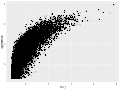

In [195]:
## LSI 1 is strongly correlated with depth, removed
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=15)
Cell_Variant.seurat@reductions$lsi@cell.embeddings %>% Tomerge_v2(HPC_BMMC_mitoTracing.VerySensitive@CellMeta,.) %>% ggplot()+aes(LSI_1,log(meanCov))+geom_point()

<blockquote>LSI1 is strongly correlated with depth, removed</blockquote>

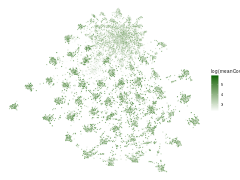

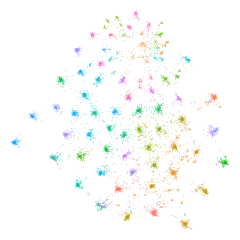

In [940]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=30)
Cell_Variant.seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,HPC_BMMC_mitoTracing.VerySensitive@CellMeta) %>%  ggplot()+aes(UMAP_1,UMAP_2,color=log(meanCov))+
    geom_point(size=0.8,alpha=0.5)+scale_color_gradient(low="white",high="darkgreen")+theme_void()
options(repr.plot.width=8, repr.plot.height=8,repr.plot.res=30)
Cell_Variant.seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,Cell_Variant.seurat@meta.data) %>% subset(.,seurat_clusters!=0) %>% ggplot()+aes(UMAP_1,UMAP_2, color=seurat_clusters)+
    geom_point(size=0.8,alpha=0.2)+theme_void()+theme(legend.position = "none")
# Cell_Variant.seurat@reductions$lsi@cell.embeddings %>% as.data.frame() %>% 
#ggplot()+aes(LSI_7,LSI_8)+geom_point(size=0.3)

In [942]:
## To visulize marker variants
DN4_BMMC_HPC_Variant.markers <- FindAllMarkers(Cell_Variant.seurat, only.pos = TRUE, min.pct = 0.01, logfc.threshold = 1)
DN4_BMMC_HPC_Variant.markers %>% group_by(cluster) %>% subset(.,p_val_adj<0.05) %>% top_n(n = -1, wt = p_val_adj)-> top1

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32

Calculating cluster 33

Calculating cluster 34

Calculating cluster 35

Calculating cluster 36

Calculating cluster 37

Calculating cluster 38

Calculating cluster 39

Calculating cluster 40

Calculating cluster 41

Ca

In [974]:
head(top1)

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,6.716865,1.000,0.020,0.000000e+00,1,Variants9979GA
0.000000e+00,6.026950,0.914,0.030,0.000000e+00,2,Variants5766CG
0.000000e+00,5.987411,0.980,0.035,0.000000e+00,2,Variants5765CA
0.000000e+00,5.795613,1.000,0.032,0.000000e+00,3,Variants13589TC
2.063731e-85,4.474751,0.214,0.020,1.575658e-81,4,Variants11594CG
0.000000e+00,6.005467,1.000,0.027,0.000000e+00,5,Variants1468TC


In [985]:
Cells<-Cell_Variant.seurat@meta.data %>% subset(.,seurat_clusters!=0) %>% row.names(.)
V2Show<-top1$gene[1:80]
DN4_HPC_BMMC.Vshow.datatoplot<-as.data.frame(Mminus[,V2Show]) %>% Tomerge_v2(.,Cell_Variant.seurat@reductions$umap@cell.embeddings[Cells,]) %>% melt(.,id.vars = c("UMAP_1","UMAP_2"))

Warning message in melt(., id.vars = c("UMAP_1", "UMAP_2")):
“The melt generic in data.table has been passed a data.frame and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is deprecated, and this redirection is now deprecated as well. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace like reshape2::melt(.). In the next version, this warning will become an error.”


In [970]:
head(DN4_HPC_BMMC.Vshow.datatoplot)

,UMAP_1,UMAP_2,variable,value
,<dbl>,<dbl>,<fct>,<dbl>
1,-2.71365353,0.1485869,Variants9979GA,0
2,3.10390977,-4.4555311,Variants9979GA,0
3,0.09511568,-4.3448777,Variants9979GA,0
4,-5.10254832,2.5448088,Variants9979GA,0
5,0.67391572,0.2711460,Variants9979GA,0
6,-5.69946405,-3.1996060,Variants9979GA,0


In [986]:
options(repr.plot.width=16, repr.plot.height=36,repr.plot.res=600)
DN4_HPC_BMMC.Vshow.datatoplot$value<-as.factor(DN4_HPC_BMMC.Vshow.datatoplot$value)
#ggplot(DN4_HPC_BMMC.Vshow.datatoplot)+aes(UMAP_1,UMAP_2,color=value)+geom_point(size=0.01)+facet_wrap(~variable,ncol = 6)+theme_void()+scale_color_manual(values = c("grey","red"))

In [983]:
pick

[1] "Variants 7486GT"  "Variants 11594CG" "Variants 12818GC" "Variants 12882CT"
 [5] "Variants 976AC"   "Variants 15113AC" "Variants 767CT"   "Variants 15981CT"
 [9] "Variants 11229CG" "Variants 8000GT"  "Variants 14365CG" "Variants 13380CT"

Warning message:
“Removed 30600 rows containing missing values (geom_point).”


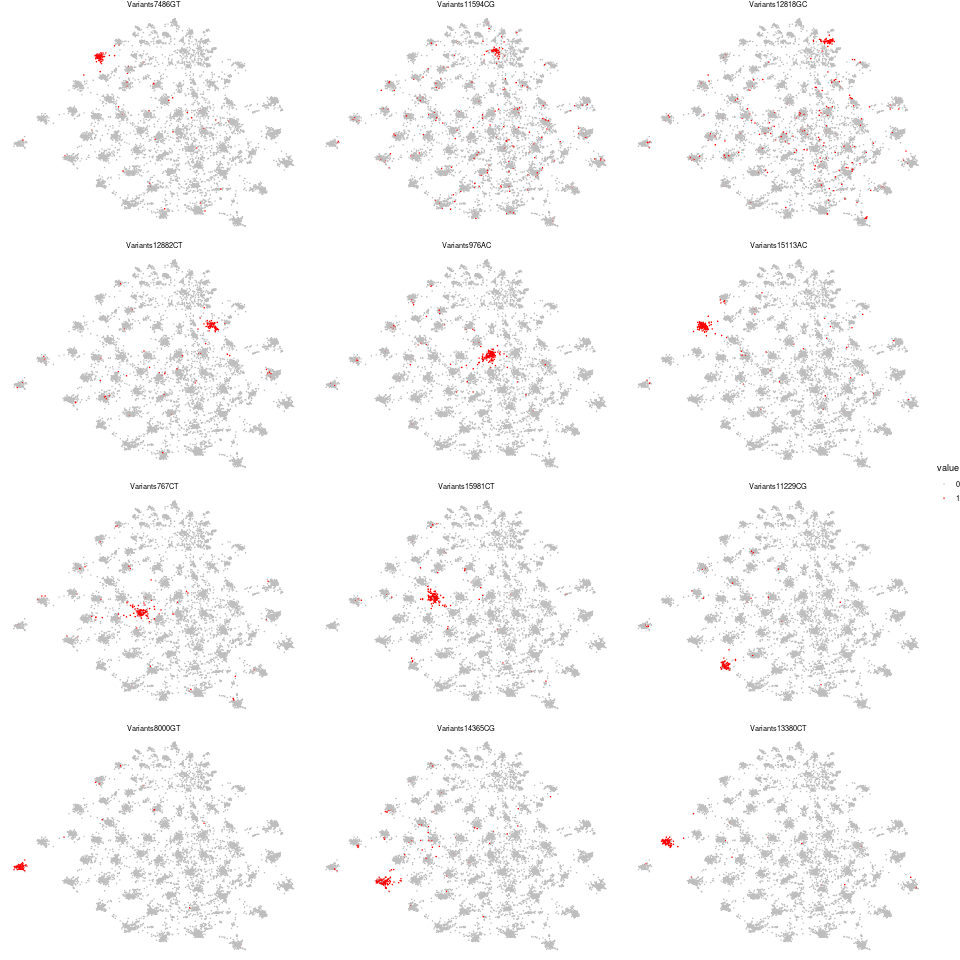

In [988]:
options(repr.plot.width=16, repr.plot.height=16,repr.plot.res=60)
pick<-paste("Variants",c("7486GT","11594CG","12818GC",
"12882CT", "976AC","15113AC",
"767CT","15981CT", "11229CG",
"8000GT","14365CG","13380CT"),sep="")
DN4_HPC_BMMC.Vshow.datatoplot<-subset(DN4_HPC_BMMC.Vshow.datatoplot,variable %in% pick)
DN4_HPC_BMMC.Vshow.datatoplot$variable<-factor(DN4_HPC_BMMC.Vshow.datatoplot$variable,levels=pick)
ggplot(DN4_HPC_BMMC.Vshow.datatoplot)+aes(UMAP_1,UMAP_2,color=value)+geom_point(size=0.01)+facet_wrap(~variable,ncol = 3)+theme_void()+scale_color_manual(values = c("grey","red"))

### Prepare LSI distance (selected informative variants)

<code style="background:yellow;color:black">Use DN4.MyeLym.specificV from Donor4Donor9.basics.ipynb, 179 variants in total </code>

In [593]:
DN4.MyeLym.specificV<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4.MyeLym.specificV")
# DN4.HSC.dep.V<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4.HSC.dep.V")
DN4.MyeLym.specificV<-paste("Variants",gsub("_","",DN4.MyeLym.specificV),sep="")
# DN4.HSC.dep.V<-paste("Variants",gsub("_","",DN4.HSC.dep.V),sep="")

# DN4.Commited.V<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4.Commited.V")
# DN4.Commited.V<-paste("Variants",gsub("_","",DN4.Commited.V),sep="")

length(DN4.MyeLym.specificV)
# length(DN4.HSC.dep.V)
# length(DN4.Commited.V)

[1] 179

In [597]:
M=HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[,DN4.MyeLym.specificV[DN4.MyeLym.specificV %in% colnames(HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi)] ]
#M=HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[,DN4.HSC.dep.V[DN4.HSC.dep.V %in% colnames(HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi)] ]
#M=HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[,DN4.Commited.V[DN4.Commited.V %in% colnames(HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi)] ]
# M=HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi
# RecurrentV<-c("Variants310TC","Variants3109TC","Variants5764CT") #,,"Variants5764CT","Variants5765CA","Variants5766CG"
# M<-M[,-which(colnames(M) %in% RecurrentV)] 
# # M=Mminus[,sample(1:ncol(M),1000)]
M<-M[rowSums(M)>0,]

Cell_Variant.seurat.spec<-CreateSeuratObject(counts = t(as.matrix(M)), assay = "mitoV") 
VariableFeatures(Cell_Variant.seurat.spec) <- row.names(Cell_Variant.seurat.spec)
Cell_Variant.seurat.spec <- RunTFIDF(Cell_Variant.seurat.spec)
Cell_Variant.seurat.spec<- FindTopFeatures(Cell_Variant.seurat.spec, min.cutoff = 2)
Cell_Variant.seurat.spec <- RunSVD(Cell_Variant.seurat.spec, n = 50)
Cell_Variant.seurat.spec <- RunUMAP(Cell_Variant.seurat.spec, reduction = "lsi", dims = 2:50)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

21:26:38 UMAP embedding parameters a = 0.9922 b = 1.112

21:26:38 Read 1965 rows and found 49 numeric columns

21:26:38 Using Annoy for neighbor search, n_neighbors = 30

21:26:38 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

21:26:38 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd504c438b

21:26:38 Searching Annoy index using 1 thread, search_k = 3000

21:26:39 Annoy recall = 93.18%

21:26:42 Commencing smooth kNN distance calibration using 1 thread

21:26:42 1885 smooth knn distance failures

21:26:48 Found 2 connected components, 
falling back to 'spca' initialization with init_sdev = 1

21:26:48 Initializing from PCA

21:26:48 Using 'irlba' for PCA

21:26:48 PCA: 2 components expla

In [598]:
dim(M)
table(rowSums(M))

[1] 1965  152


   1    2    3    4    5 
1693  239   26    6    1 

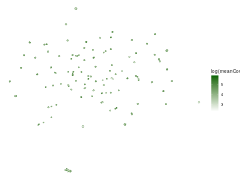

In [600]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=30)
Cell_Variant.seurat.spec@reductions$umap@cell.embeddings %>% Tomerge_v2(.,HPC_BMMC_mitoTracing.VerySensitive@CellMeta) %>%  ggplot()+aes(UMAP_1,UMAP_2,color=log(meanCov))+
    geom_point(size=0.8,alpha=0.5)+scale_color_gradient(low="white",high="darkgreen")+theme_void()


### plot distance VS coverage

- Load the w_jaccard; w_cosine; jaccard

In [613]:
test.sensitive.w_j<-as.matrix(HPC_BMMC_mitoTracing.Sensitive@DistObjects@w_jaccard)
test.sensitive.w_cos<-as.matrix(HPC_BMMC_mitoTracing.Sensitive@DistObjects@w_cosine)
test.sensitive.jc<-as.matrix(HPC_BMMC_mitoTracing.Sensitive@DistObjects@jaccard)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'as.matrix': no slot of name "w_jaccard" for this object of class "DistObjects"


- W_jaccard;w_cosine; jaccard; Plot distance (For any given cell, take the average distance from the k nearest neighbours) against log(mitocoverage)

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



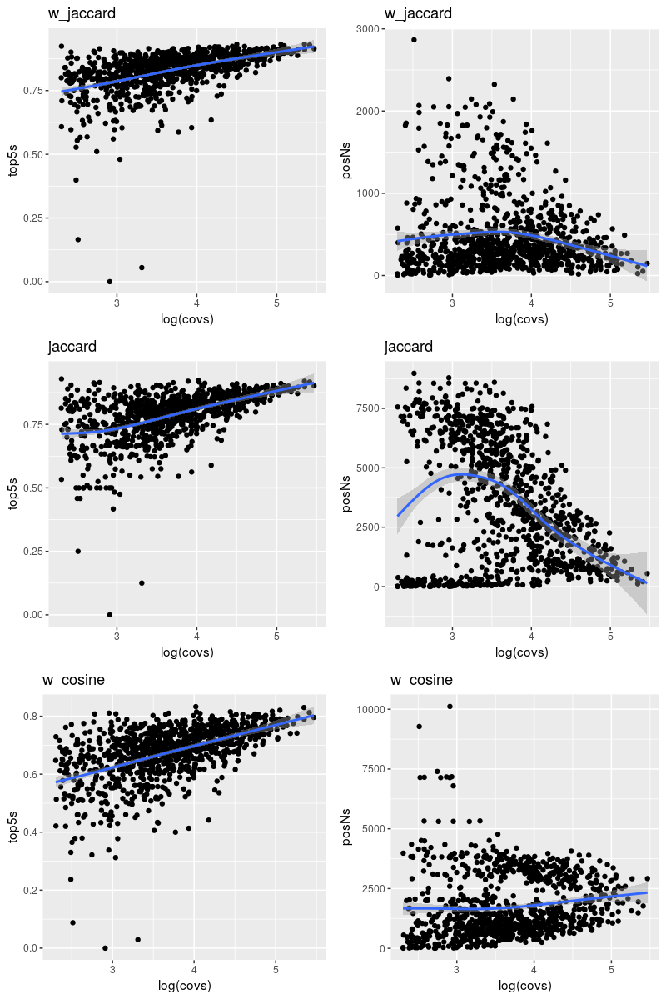

In [202]:
# Explore
#test.sensitive.w_j["AAACCAGGTGGATTAG_1",] %>% .[order(.)]
k=5
D<-test.sensitive.w_j
i=1
top5s<-c()
covs<-c()
posNs<-c()
for(i in 1:1000){
Cell<-row.names(D)[i]
top5mean<-D[i,] %>% .[order(.)] %>% .[2:k] %>% mean
PosN<-length(which(D[i,]<0.95))
cov<-HPC_BMMC_mitoTracing.VerySensitive@CellMeta[Cell,"meanCov"]
covs<-c(covs,cov)
top5s<-c(top5s,top5mean)
posNs<-c(posNs,PosN)
}


#sum(HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[c("AAACCAGGTGGATTAG_1"),] * HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[c("GGAATCTAGCCGCAAA_2"),])
p1<-data.frame(top5s,covs) %>% ggplot()+aes(log(covs),top5s)+geom_point()+geom_smooth()+ggtitle("w_jaccard")
p2<-data.frame(posNs,covs) %>% ggplot()+aes(log(covs),posNs)+geom_point()+geom_smooth()+ggtitle("w_jaccard")



D<-test.sensitive.jc
i=1
top5s<-c()
covs<-c()
posNs<-c()
for(i in 1:1000){
Cell<-row.names(D)[i]
top5mean<-D[i,] %>% .[order(.)] %>% .[2:k] %>% mean
PosN<-length(which(D[i,]<0.95))
cov<-HPC_BMMC_mitoTracing.VerySensitive@CellMeta[Cell,"meanCov"]
covs<-c(covs,cov)
top5s<-c(top5s,top5mean)
posNs<-c(posNs,PosN)
}

#sum(HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[c("AAACCAGGTGGATTAG_1"),] * HPC_BMMC_mitoTracing.VerySensitive@Cts.Mtx.bi[c("GGAATCTAGCCGCAAA_2"),])
p3<-data.frame(top5s,covs) %>% ggplot()+aes(log(covs),top5s)+geom_point()+geom_smooth()+ggtitle("jaccard")
p4<-data.frame(posNs,covs) %>% ggplot()+aes(log(covs),posNs)+geom_point()+geom_smooth()+ggtitle("jaccard")


D<-test.sensitive.w_cos
i=1
top5s<-c()
covs<-c()
posNs<-c()
for(i in 1:1000){
Cell<-row.names(D)[i]
top5mean<-D[i,] %>% .[order(.)] %>% .[2:k] %>% mean
PosN<-length(which(D[i,]<0.95))
cov<-HPC_BMMC_mitoTracing.VerySensitive@CellMeta[Cell,"meanCov"]
covs<-c(covs,cov)
top5s<-c(top5s,top5mean)
posNs<-c(posNs,PosN)
}
p5<-data.frame(top5s,covs) %>% ggplot()+aes(log(covs),top5s)+geom_point()+geom_smooth()+ggtitle("w_cosine")
p6<-data.frame(posNs,covs) %>% ggplot()+aes(log(covs),posNs)+geom_point()+geom_smooth()+ggtitle("w_cosine")





options(repr.plot.width=8, repr.plot.height=12,repr.plot.res=100)
grid.arrange(p1,p2,p3,p4,p5,p6,nrow=3)

- LSI distance; Plot distance (For any given cell, take the average distance from the k nearest neighbours) against log(mitocoverage)

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



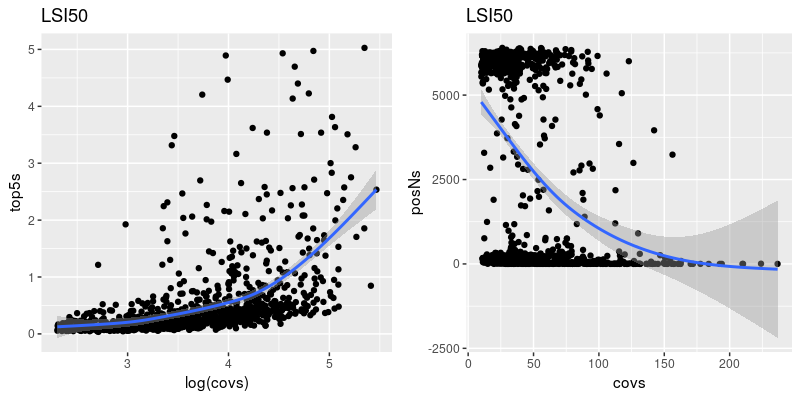

In [493]:
#run the distance VS log coverage above using theLSI
k=10
D=as.matrix(dist(Cell_Variant.seurat@reductions$lsi@cell.embeddings[,2:10]))
i=1
top5s<-c()
covs<-c()
posNs<-c()
for(i in 1:1000){
Cell<-row.names(D)[i]
top5mean<-D[i,] %>% .[order(.)] %>% .[2:k] %>% mean
PosN<-length(which(D[i,]<0.95))
cov<-HPC_BMMC_mitoTracing.VerySensitive@CellMeta[Cell,"meanCov"]
covs<-c(covs,cov)
top5s<-c(top5s,top5mean)
posNs<-c(posNs,PosN)
}
p7<-data.frame(top5s,covs) %>% ggplot()+aes(log(covs),top5s)+geom_point()+geom_smooth()+ggtitle("LSI50")
p8<-data.frame(posNs,covs) %>% ggplot()+aes(covs,posNs)+geom_point()+geom_smooth()+ggtitle("LSI50")
options(repr.plot.width=8, repr.plot.height=4,repr.plot.res=100)
grid.arrange(p7,p8,nrow=1)


<blockquote>the mito coverage is linked with true biology, or different cell types, The observed correlation may have something to do with cell-type specific neighbourhood size. To avoid overcorrecting, I'll just leave it there for now</blockquote>

In [ ]:
- Another way to check: Given a cell, order the neighbours from nearest (as x axis), look at the mito depth 

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACCAGGTAACGAGC_1,AAACCAGGTAACGAGC_1,51.04997,SeuratProject,4087,2182,23872,10610,4557,2181,0.5472383,0.4527617,3,3,CLP,HPC


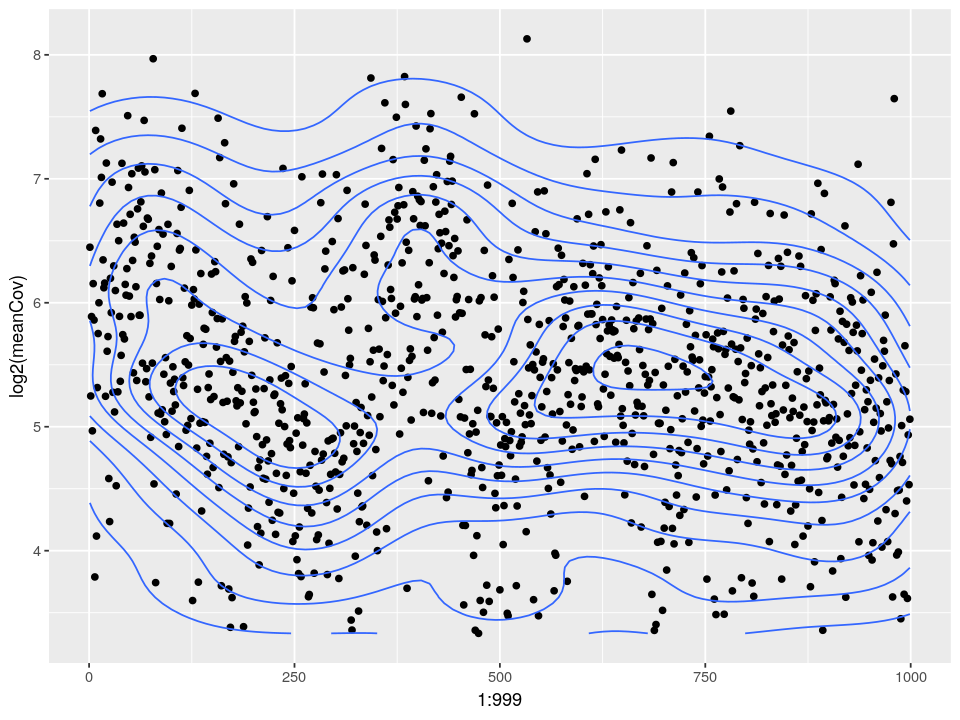

In [621]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=120)
D=as.matrix(dist(Cell_Variant.seurat@reductions$lsi@cell.embeddings[,2:10]))
i=5  # Test one by one
HPC_BMMC_mitoTracing.VerySensitive@CellMeta[row.names(D)[i],]
# D[i,] %>% .[order(.)]  %>% .[2:500] %>% names() %>% HPC_BMMC_mitoTracing.VerySensitive@CellMeta[.,"meanCov"] %>% log2(.) %>% plot
D[i,] %>% .[order(.)]  %>% .[2:1000] %>% names() %>% HPC_BMMC_mitoTracing.VerySensitive@CellMeta[.,]  %>% ggplot()+aes(1:999,log2(meanCov))+geom_point()+geom_density_2d()

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACCAGGTAACGAGC_1,AAACCAGGTAACGAGC_1,51.04997,SeuratProject,4087,2182,23872,10610,4557,2181,0.5472383,0.4527617,3,3,CLP,HPC


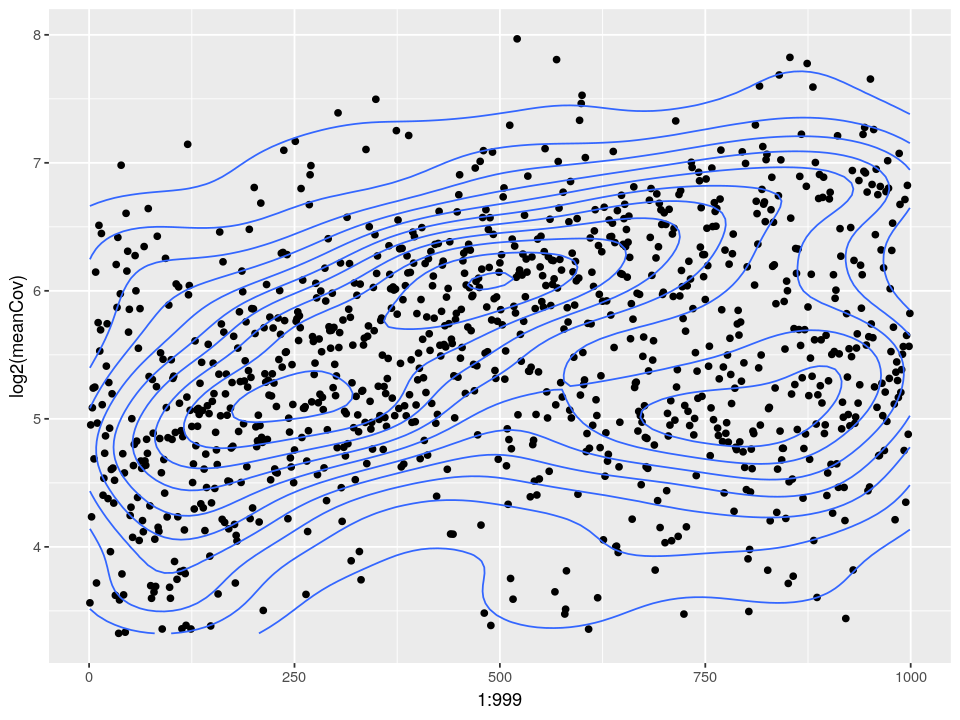

In [622]:
D=as.matrix(HPC_BMMC_mitoTracing.Sensitive@DistObjects@w_jaccard)
i=5
HPC_BMMC_mitoTracing.VerySensitive@CellMeta[row.names(D)[i],]
# D[i,] %>% .[order(.)]  %>% .[2:500] %>% names() %>% HPC_BMMC_mitoTracing.VerySensitive@CellMeta[.,"meanCov"] %>% log2(.) %>% plot
D[i,] %>% .[order(.)]  %>% .[2:1000] %>% names() %>% HPC_BMMC_mitoTracing.VerySensitive@CellMeta[.,]  %>% ggplot()+aes(1:999,log2(meanCov))+geom_point()+geom_density_2d()

## Raw examples (To randomly pick a cell, look for its neighbouthood)

In [576]:
HPC_BMMC_mitoTracing.VerySensitive@CellMeta %>% subset(.,CellType=="Mono") %>% .[sample(1:700,5),]

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
GCTCCATAGTCACTAT_2,GCTCCATAGTCACTAT_2,13.39870,SeuratProject,4408,2140,5226,2591,3219,2111,0.5752310,0.4247690,2,2,Mono,BMMC
ACTTAGTTCAGGAGGG_2,ACTTAGTTCAGGAGGG_2,31.53648,SeuratProject,4743,2215,9954,4719,3365,2158,0.5542265,0.4457735,2,2,Mono,BMMC
GCTTAGCTCGCAATTT_2,GCTTAGCTCGCAATTT_2,31.80669,SeuratProject,1625,1064,11729,5391,2091,1061,0.6139411,0.3860589,2,2,Mono,BMMC
AAGGGCCTCTTTAGCG_2,AAGGGCCTCTTTAGCG_2,23.90754,SeuratProject,1708,1096,9053,4363,2124,1092,0.5974200,0.4025800,2,2,Mono,BMMC
AAAGGCGCACAAACGC_2,AAAGGCGCACAAACGC_2,67.79727,SeuratProject,7191,3333,26179,9873,2550,1603,0.8081169,0.1918831,2,2,Mono,BMMC


In [578]:
Cell<-"ACTTAGTTCAGGAGGG_2"
D[Cell,] %>% .[order(.)] %>% .[2:10]
D[Cell,] %>% .[order(.)] %>% .[2:10] %>% names %>% HPC_BMMC_mitoTracing.VerySensitive@CellMeta[.,]

ACTTAGTTCAGGAGGG_2 CTAATGAAGGTGAATC_2 ATCACAAAGTCAATAG_2 ATGGCGGGTTAGGCGG_2 
        0.00000000         0.00000000         0.04067351         0.04067351 
CATTGTGTCAATACAG_2 CCATGATGTATAGTGG_1 GAATGAACAGTTGGGT_1 GTAAGACTCAGGTTGG_2 
        0.04067351         0.04067351         0.04067351         0.04067351 
TAATGTGAGTCCTTGA_1 
        0.04067351

,Cell,meanCov,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,CellType,Label
,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
ACTTAGTTCAGGAGGG_2,ACTTAGTTCAGGAGGG_2,31.53648,SeuratProject,4743,2215,9954,4719,3365,2158,0.5542265,0.4457735,2,2,Mono,BMMC
CTAATGAAGGTGAATC_2,CTAATGAAGGTGAATC_2,12.39906,SeuratProject,2643,1491,3905,1934,2639,1488,0.5724501,0.4275499,3,3,CD8,BMMC
ATCACAAAGTCAATAG_2,ATCACAAAGTCAATAG_2,36.22965,SeuratProject,3711,1947,13004,6067,3201,1941,0.4920359,0.5079641,2,2,Mono,BMMC
ATGGCGGGTTAGGCGG_2,ATGGCGGGTTAGGCGG_2,22.78442,SeuratProject,2498,1370,8054,3722,2508,1370,0.5992466,0.4007534,0,0,CD4,BMMC
CATTGTGTCAATACAG_2,CATTGTGTCAATACAG_2,29.18088,SeuratProject,1474,899,10868,4845,2201,900,0.4677760,0.5322240,0,0,CD4,BMMC
CCATGATGTATAGTGG_1,CCATGATGTATAGTGG_1,25.08673,SeuratProject,4520,2267,9093,4414,4731,2265,0.5000000,0.5000000,2,2,HSC,HPC
GAATGAACAGTTGGGT_1,GAATGAACAGTTGGGT_1,35.35434,SeuratProject,2898,1679,15546,7474,4480,1686,0.5388849,0.4611151,2,2,HSC,HPC
GTAAGACTCAGGTTGG_2,GTAAGACTCAGGTTGG_2,26.38916,SeuratProject,2780,1550,3653,1769,2772,1550,0.4573129,0.5426871,3,3,CD8,BMMC
TAATGTGAGTCCTTGA_1,TAATGTGAGTCCTTGA_1,79.97906,SeuratProject,7446,3252,25980,11639,5927,3245,0.4989468,0.5010532,3,3,CLP,HPC


## Method1: k-nearest neighbour 
For any given cell, look at the composition of the k-nearest neighbour

In [623]:
## Input 
CellMeta=HPC_BMMC_mitoTracing.VerySensitive@CellMeta
col="CellType"
#D=as.matrix(HPC_BMMC_mitoTracing.VerySensitive@DistObjects@w_jaccard)  # Distance matrix
#D=as.matrix(HPC_BMMC_mitoTracing.VerySensitive@DistObjects@w_cosine) 
#D=as.matrix(dist(HPC_BMMC_mitoTracing.VerySensitive@Seurat@reductions$lsi@cell.embeddings[,c(2,3,5:20)]))
#D=as.matrix(dist(Cell_Variant.seurat@reductions$lsi@cell.embeddings[,c(2:10)]))
D=as.matrix(dist(Cell_Variant.seurat.spec@reductions$lsi@cell.embeddings[,2:10]))  # Prepared in 11.2.2 "Prepare LSI distance (selected informative variants)""
k=10
tt="LSI  comp mean"

In [624]:
## Make cell type dictionary
CellDic<-CellMeta[,col]  
names(CellDic)<-CellMeta$Cell
table(CellDic)

CellDic
 CDP  MDP  GMP  MEP  MKP PreB LMPP  HSC  CLP  MPP  pDC  Ery  mDC Mono    B   NK 
 239  310  972 1351  154  101  548  570 1153  812   43  400   53  726  696  849 
 CD8  CD4 
 943 2106 

In [625]:
## Generate celltype.mtx which is a cell vs celltype matrix
celltype.mtx<-c()
Rnames<-row.names(D)
Cnames<-levels(CellDic)
for (i in 1:ncol(D)){
# i<-sample(1:ncol(test.sensitive.w_j),1)
# print(i)
x<-D[,i] %>% .[order(.)] %>% names %>% .[2:k]
celltype.mtx<-rbind(celltype.mtx,as.numeric(table(CellDic[x])))
}

In [626]:
row.names(celltype.mtx)<-Rnames
colnames(celltype.mtx)<-Cnames
celltype.df<-as.data.frame(celltype.mtx)
celltype.df$Seed=CellDic[Rnames]

Seed,MKP,MPP,HSC,LMPP,Mono,GMP,CDP,MDP,mDC,MEP,Ery,PreB,CLP,pDC,B,NK,CD8,CD4
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CDP,0.14285714,0.8285714,0.3714286,0.2285714,0.6000000,1.2285714,0.94285714,0.22857143,0.08571429,1.771429,0.3714286,0.11428571,0.2571429,0.02857143,0.5428571,0.2857143,0.2285714,0.7428571
MDP,0.17187500,0.7343750,0.4531250,0.4218750,0.7500000,1.0156250,0.28125000,0.54687500,0.03125000,1.546875,0.4843750,0.09375000,0.3906250,0.04687500,0.4531250,0.2187500,0.3750000,0.9843750
GMP,0.12987013,0.7229437,0.2943723,0.3116883,0.7705628,1.5021645,0.37229437,0.28571429,0.02597403,1.549784,0.4242424,0.09956710,0.4155844,0.04329004,0.4545455,0.3073593,0.4415584,0.8484848
MEP,0.20192308,0.5336538,0.3365385,0.3293269,0.4543269,0.7932692,0.21153846,0.23557692,0.02644231,2.644231,0.6033654,0.11298077,0.5360577,0.03605769,0.5120192,0.2956731,0.4086538,0.7283654
MKP,0.84210526,1.0000000,0.5526316,0.4473684,0.3421053,0.6842105,0.07894737,0.23684211,0.02631579,2.210526,0.5000000,0.07894737,0.4210526,0.10526316,0.3421053,0.3421053,0.2105263,0.5789474
PreB,0.09090909,0.5909091,0.2272727,0.4090909,0.5000000,1.1363636,0.22727273,0.09090909,0.04545455,1.318182,0.2727273,0.68181818,0.5000000,0.04545455,0.8181818,0.5454545,0.5454545,0.9545455
LMPP,0.18055556,0.5555556,0.3194444,1.0277778,0.3750000,0.7083333,0.20833333,0.20833333,0.02777778,1.638889,0.3611111,0.11111111,0.7222222,0.04166667,0.6388889,0.3472222,0.3750000,1.1527778
HSC,0.20689655,0.6206897,0.9310345,0.2241379,0.4310345,0.8103448,0.22413793,0.24137931,0.01724138,1.793103,0.5517241,0.05172414,0.5000000,0.05172414,0.3275862,0.2931034,0.5000000,1.2241379
CLP,0.17886179,0.4390244,0.3170732,0.3577236,0.4390244,0.7804878,0.15447154,0.21951220,0.01626016,1.756098,0.4471545,0.09756098,1.1382114,0.04065041,0.5284553,0.4227642,0.5609756,1.1056911


Seed,MKP,MPP,HSC,LMPP,Mono,GMP,CDP,MDP,mDC,MEP,Ery,PreB,CLP,pDC,B,NK,CD8,CD4
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CDP,-0.26783170,0.63079068,-0.01942336,-0.8003545,0.2223175,1.35017976,3.139119588,0.13711347,0.1029166,0.46527709,-0.50581415,-0.1909017,-1.32825553,-0.38052134,0.01569636,-0.60032746,-1.01748634,-0.65621082
MDP,-0.09712041,0.23078301,0.48185247,0.1962162,0.8683411,0.43685336,0.001797654,3.21944873,-0.2562863,-0.08355501,0.12232474,-0.3342932,-0.61560292,-0.27140302,-0.52139571,-0.93540209,-0.43918538,-0.24695314
GMP,-0.34423396,0.18223978,-0.49222799,-0.3718479,0.9569013,2.52361940,0.433527433,0.69046398,-0.2910824,-0.07644621,-0.21209583,-0.2936751,-0.48234620,-0.29277505,-0.51289357,-0.49202051,-0.17632130,-0.47722219
MEP,0.07965163,-0.62158478,-0.23350333,-0.2809126,-0.4050707,-0.51682968,-0.328772445,0.20495212,-0.2879940,2.59849572,0.78407641,-0.2000136,0.16085290,-0.33589133,-0.16888407,-0.55049584,-0.30627380,-0.68076744
MKP,3.84582662,1.35876672,1.09240845,0.3276468,-0.8883896,-0.98458204,-0.957515574,0.21720368,-0.2888284,1.53847729,0.20922142,-0.4376532,-0.45315175,0.07668302,-1.18590475,-0.31815935,-1.08875322,-0.93395978
PreB,-0.57344073,-0.37844884,-0.90393988,0.1303082,-0.2083648,0.95470090,-0.254161012,-1.19595821,-0.1626045,-0.64250474,-1.05473034,3.7719168,-0.03165681,-0.27987118,1.66365321,0.69935595,0.23400311,-0.29750001
LMPP,-0.04605293,-0.52857858,-0.33838940,3.3199297,-0.7467177,-0.88111941,-0.343971071,-0.05886483,-0.2791863,0.14133643,-0.56319354,-0.2130685,1.15477340,-0.30245295,0.59049473,-0.29255520,-0.43918538,0.03840932
HSC,0.10891046,-0.25198487,3.41422636,-0.8232113,-0.5053871,-0.44359251,-0.269026125,0.26114031,-0.3486759,0.51825273,0.49687941,-0.6277405,-0.03165681,-0.24249446,-1.27280861,-0.56335370,0.05448618,0.15933077
CLP,-0.05601732,-1.02343131,-0.35293915,-0.1345145,-0.4709760,-0.57164916,-0.599382114,0.04938717,-0.3551473,0.42780652,-0.08467305,-0.3076829,3.37571287,-0.30851147,-0.07050602,0.08544046,0.29530157,-0.04138023


Using Seed as id variables



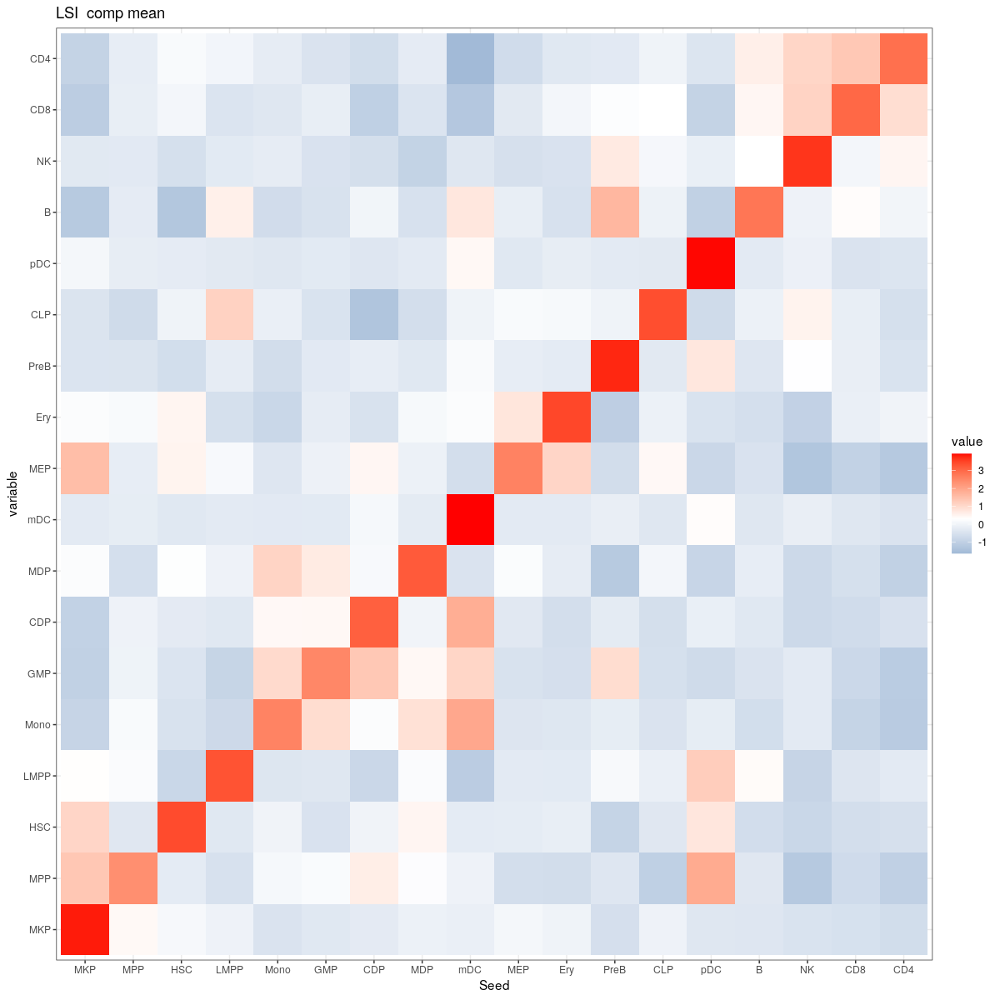

In [627]:
# Define NeighbourComp_mean, given a seed celltype, take the mean of the number of a certain target cell type in a k-neighbourhood
NeibourComp_mean<-celltype.df %>% group_by(Seed) %>% dplyr::summarise(MKP=mean(MKP),MPP=mean(MPP),HSC=mean(HSC),LMPP=mean(LMPP),
                                                                                Mono=mean(Mono),GMP=mean(GMP),CDP=mean(CDP),MDP=mean(MDP), mDC=mean(mDC),
                                                                                MEP=mean(MEP),Ery=mean(Ery),
                                                                                PreB=mean(PreB),CLP=mean(CLP),pDC=mean(pDC),B=mean(B),NK=mean(NK),CD8=mean(CD8),CD4=mean(CD4)) 



NeibourComp_mean$Seed<-factor(NeibourComp_mean$Seed,levels=c("MKP","MPP","HSC","LMPP","Mono","GMP","CDP","MDP","mDC","MEP","Ery","PreB","CLP","pDC","B","NK","CD8","CD4"))
# Scale by column or the target cell type, becasue it is comparable given a target celltype across different seed,but not vice versa
NeibourComp_mean.scale<-NeibourComp_mean[,2:ncol(NeibourComp_mean)] %>% scale %>% cbind(NeibourComp_mean[,1],.) 
NeibourComp_mean
NeibourComp_mean.scale
options(repr.plot.width=12, repr.plot.height=12,repr.plot.res=100)
# melt(NeibourComp_mean.scale) %>% ggplot()+aes(Seed,variable,color=value,size=value)+geom_point()+scale_color_gradient2(high="red",low="steelblue",mid="white")+ggtitle(tt)+theme_bw()
melt(NeibourComp_mean.scale) %>% ggplot()+aes(Seed,variable,fill=value)+geom_tile()+scale_fill_gradient2(high="red",low="steelblue",mid="white",midpoint=0.3)+ggtitle(tt)+theme_bw()


Seed,MKP,MPP,HSC,LMPP,Mono,GMP,CDP,MDP,mDC,MEP,Ery,PreB,CLP,pDC,B,NK,CD8,CD4
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CDP,0.9230769,1.3610036,1.1379939,0.6928517,1.2679803,1.5199953,4.3282453,1.1367986,3.1617171,1.1627839,0.8401541,1.1131563,0.5314456,0.6213465,1.0434799,0.8241250,0.5172083,0.7487064
MDP,1.1105769,1.2062774,1.3882979,1.2787985,1.5849754,1.2565368,1.2910959,2.7198795,1.1527094,1.0153846,1.0956337,0.9131360,0.8073175,1.0193966,0.8709968,0.6309707,0.8485448,0.9921260
GMP,0.8391608,1.1875005,0.9019066,0.9447977,1.6284307,1.8584861,1.7090408,1.4209983,0.9580961,1.0172938,0.9596166,0.9697953,0.8589020,0.9414340,0.8737272,0.8865587,0.9991523,0.8551658
MEP,1.3047337,0.8765748,1.0310966,0.9982644,0.9601293,0.9814370,0.9710807,1.1716404,0.9753695,1.7357002,1.3647844,1.1004460,1.1078881,0.7841512,0.9842033,0.8528505,0.9246962,0.7341005
MKP,5.4412955,1.6425906,1.6931691,1.3560748,0.7229712,0.8465090,0.3624129,1.1779328,0.9707026,1.4510121,1.1309767,0.7689567,0.8702033,2.2891712,0.6575947,0.9867813,0.4763760,0.5835060
PreB,0.5874126,0.9706217,0.6963250,1.2400470,1.0566502,1.4059153,1.0433098,0.4521358,1.6766682,0.8652681,0.6168964,6.6409893,1.0333664,0.9885057,1.5727090,1.5733296,1.2342470,0.9620616
LMPP,1.1666667,0.9125503,0.9787234,3.1154268,0.7924877,0.8763539,0.9563673,1.0361446,1.0246305,1.0757835,0.8168165,1.0822353,1.4926404,0.9061303,1.2280722,1.0015408,0.8485448,1.1618548
HSC,1.3368700,1.0195390,2.8525312,0.6794127,0.9109054,1.0025630,1.0289193,1.2004985,0.6359776,1.1770115,1.2479743,0.5037992,1.0333664,1.1248514,0.6296862,0.8454386,1.1313930,1.2337768
CLP,1.1557223,0.7211373,0.9714582,1.0843410,0.9277905,0.9656238,0.7091114,1.0917426,0.5997837,1.1527205,1.0114426,0.9502554,2.3523789,0.8840295,1.0157967,1.2194370,1.2693678,1.1143973


,Var1,Var2,value
,<fct>,<fct>,<dbl>
1,S.CDP,MKP,-0.26783170
2,S.MDP,MKP,-0.09712041
3,S.GMP,MKP,-0.34423396
4,S.MEP,MKP,0.07965163
5,S.MKP,MKP,3.84582662
6,S.PreB,MKP,-0.57344073


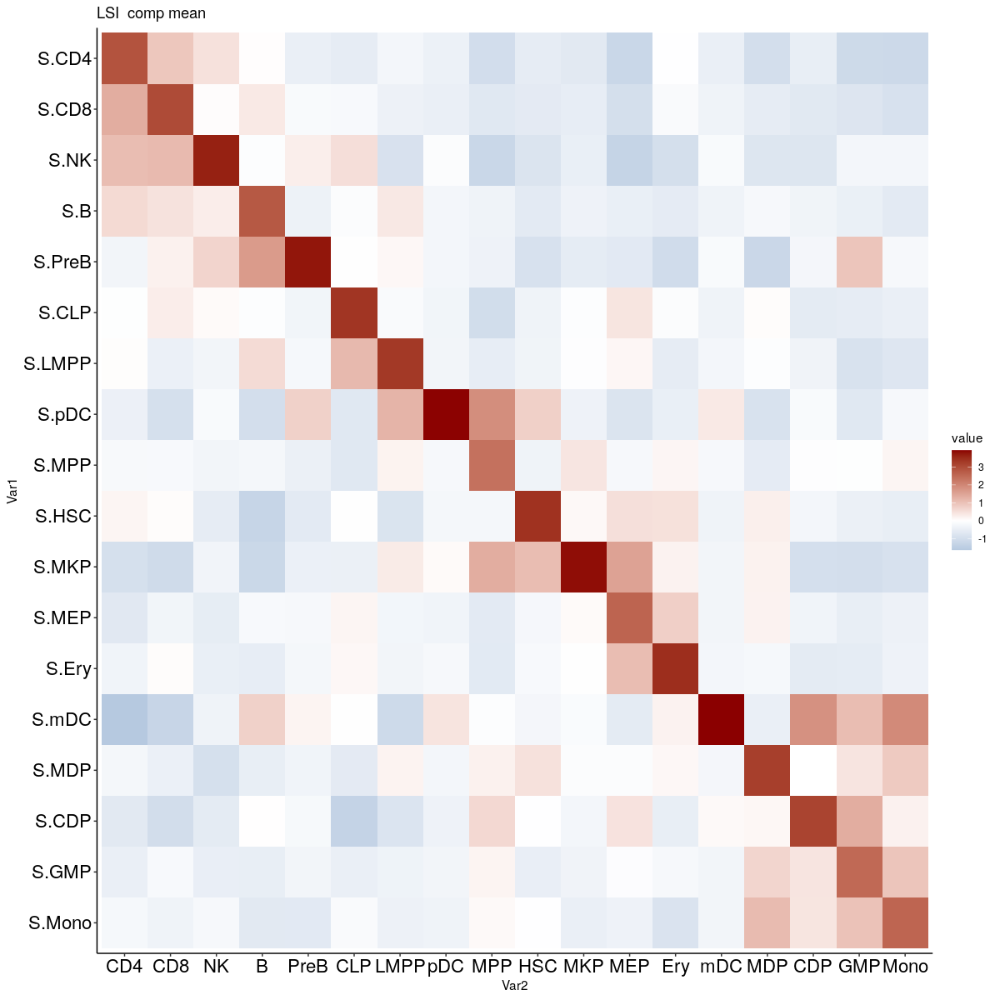

In [643]:
m.normed<-NeibourComp_mean[,2:ncol(NeibourComp_mean)] %>% apply(.,2,function(x){x/median(x)}) %>% cbind(NeibourComp_mean[,1],.)
m.normed.scaled<-m.normed[,2:ncol(m.normed)] %>% scale 
row.names(m.normed.scaled)<-paste("S.",m.normed[,1],sep="")
m.normed
od<-c("Mono","GMP","CDP","MDP","mDC","Ery","MEP","MKP","HSC","MPP","pDC","LMPP","CLP","PreB","B","NK","CD8","CD4")

datatoplot<-melt(m.normed.scaled)
head(datatoplot)
datatoplot$Var1<-factor(datatoplot$Var1,levels=paste("S.",od,sep=""))
datatoplot$Var2<-factor(datatoplot$Var2,levels=rev(od))
ggplot(datatoplot)+aes(Var2,Var1,fill=value)+geom_tile()+scale_fill_gradient2(high="darkred",low="steelblue",mid="white",midpoint=0)+ggtitle(tt)+
theme_classic()+theme(axis.text = element_text(size=16,color="black"))

#+scale_fill_viridis_b()
#
#melt(m.normed.scaled) %>% ggplot()+aes(Var1,Var1,fill=value)+geom_tile()#+scale_fill_gradient2(high="red",low="steelblue",mid="white")+ggtitle(tt)+theme_bw()

Seed,MKP,MPP,HSC,LMPP,Mono,GMP,CDP,MDP,mDC,MEP,Ery,PreB,CLP,pDC,B,NK,CD8,CD4
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
S.CDP,0.9230769,1.3610036,1.1379939,0.6928517,1.2679803,1.5199953,4.3282453,1.1367986,3.1617171,1.1627839,0.8401541,1.1131563,0.5314456,0.6213465,1.0434799,0.8241250,0.5172083,0.7487064
S.MDP,1.1105769,1.2062774,1.3882979,1.2787985,1.5849754,1.2565368,1.2910959,2.7198795,1.1527094,1.0153846,1.0956337,0.9131360,0.8073175,1.0193966,0.8709968,0.6309707,0.8485448,0.9921260
S.GMP,0.8391608,1.1875005,0.9019066,0.9447977,1.6284307,1.8584861,1.7090408,1.4209983,0.9580961,1.0172938,0.9596166,0.9697953,0.8589020,0.9414340,0.8737272,0.8865587,0.9991523,0.8551658
S.MEP,1.3047337,0.8765748,1.0310966,0.9982644,0.9601293,0.9814370,0.9710807,1.1716404,0.9753695,1.7357002,1.3647844,1.1004460,1.1078881,0.7841512,0.9842033,0.8528505,0.9246962,0.7341005
S.MKP,5.4412955,1.6425906,1.6931691,1.3560748,0.7229712,0.8465090,0.3624129,1.1779328,0.9707026,1.4510121,1.1309767,0.7689567,0.8702033,2.2891712,0.6575947,0.9867813,0.4763760,0.5835060
S.PreB,0.5874126,0.9706217,0.6963250,1.2400470,1.0566502,1.4059153,1.0433098,0.4521358,1.6766682,0.8652681,0.6168964,6.6409893,1.0333664,0.9885057,1.5727090,1.5733296,1.2342470,0.9620616
S.LMPP,1.1666667,0.9125503,0.9787234,3.1154268,0.7924877,0.8763539,0.9563673,1.0361446,1.0246305,1.0757835,0.8168165,1.0822353,1.4926404,0.9061303,1.2280722,1.0015408,0.8485448,1.1618548
S.HSC,1.3368700,1.0195390,2.8525312,0.6794127,0.9109054,1.0025630,1.0289193,1.2004985,0.6359776,1.1770115,1.2479743,0.5037992,1.0333664,1.1248514,0.6296862,0.8454386,1.1313930,1.2337768
S.CLP,1.1557223,0.7211373,0.9714582,1.0843410,0.9277905,0.9656238,0.7091114,1.0917426,0.5997837,1.1527205,1.0114426,0.9502554,2.3523789,0.8840295,1.0157967,1.2194370,1.2693678,1.1143973


Using Seed as id variables



,Seed,variable,value
,<chr>,<fct>,<dbl>
1,S.CDP,MKP,0.9230769
2,S.MDP,MKP,1.1105769
3,S.GMP,MKP,0.8391608
4,S.MEP,MKP,1.3047337
5,S.MKP,MKP,5.4412955
6,S.PreB,MKP,0.5874126


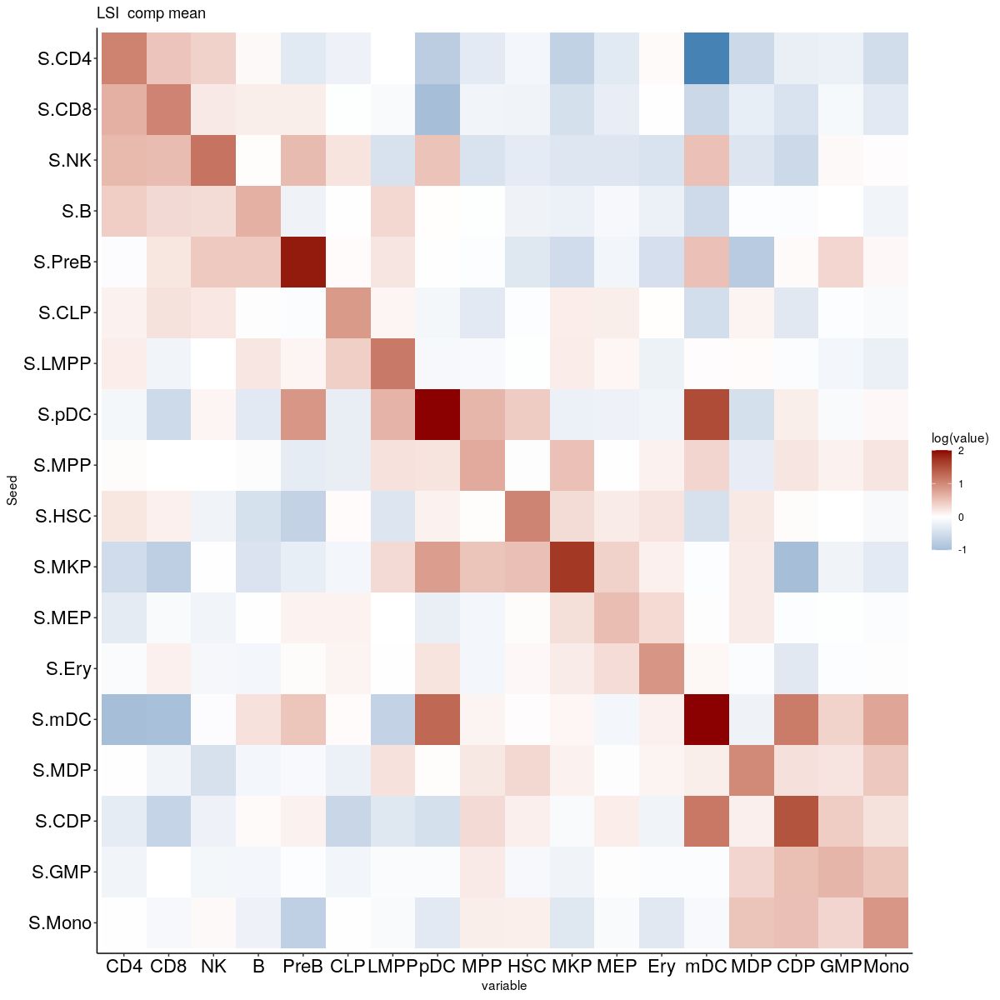

In [659]:
m.normed<-NeibourComp_mean[,2:ncol(NeibourComp_mean)] %>% apply(.,2,function(x){x/median(x)}) %>% cbind(NeibourComp_mean[,1],.)
m.normed$Seed<-paste("S.",m.normed[,1],sep="")
m.normed
datatoplot<-melt(m.normed)
head(datatoplot)
datatoplot$Seed<-factor(datatoplot$Seed,levels=paste("S.",od,sep=""))
datatoplot$variable<-factor(datatoplot$variable,levels=rev(od))
ggplot(datatoplot)+aes(variable,Seed,fill=log(value))+geom_tile()+scale_fill_gradient2(high="darkred",low="steelblue",mid="white",midpoint=0,na.value = "steelblue",limits=c(-1,2),oob=scales::squish)+ggtitle(tt)+
theme_classic()+theme(axis.text = element_text(size=16,color="black"))

# Use LSI distance (All variant) to build a neighbour joining tree

In [660]:
as.matrix(dist(Cell_Variant.seurat@reductions$lsi@cell.embeddings[,c(2:10)])

ERROR: Error in parse(text = x, srcfile = src): <text>:2:0: unexpected end of input
1: as.matrix(dist(Cell_Variant.seurat@reductions$lsi@cell.embeddings[,c(2:10)])
   ^


In [573]:
# ## Compuate the positive fraction for a given neighbourhoods with a certain cell typye
# PositiveP<-function(x){
#     p<-length(which(x>0))/length(x)
#     return(p)
# }

In [290]:
# Define NeighbourComp_mean, given a seed celltype, take the mean of the number of a certain target cell type in a k-neighbourhood
# NeibourComp_mean<-Test.celltype.df %>% group_by(Seed) %>% dplyr::summarise(MKP=mean(MKP),MPP=mean(MPP),HSC=mean(HSC),LMPP=mean(LMPP),
#                                                                                 Mono=mean(Mono),GMP=mean(GMP),CDP=mean(CDP),MDP=mean(MDP), mDC=mean(mDC),
#                                                                                 MEP=mean(MEP),Ery=mean(Ery),
#                                                                                 PreB=mean(PreB),CLP=mean(CLP),pDC=mean(pDC),B=mean(B),NK=mean(NK),CD8=mean(CD8),CD4=mean(CD4)) 



# NeibourComp_mean$Seed<-factor(NeibourComp_mean$Seed,levels=c("MKP","MPP","HSC","LMPP","Mono","GMP","CDP","MDP","mDC","MEP","Ery","PreB","CLP","pDC","B","NK","CD8","CD4"))
# # Scale by column or the target cell type, becasue it is comparable given a target celltype across different seed,but not vice versa
# NeibourComp_mean.scale<-NeibourComp_mean[,2:ncol(NeibourComp_mean)] %>% scale %>% cbind(NeibourComp_mean[,1],.) 
# NeibourComp_mean
# NeibourComp_mean.scale
# options(repr.plot.width=12, repr.plot.height=12,repr.plot.res=100)
# melt(NeibourComp_mean.scale) %>% ggplot()+aes(Seed,variable,color=value,size=value)+geom_point()+scale_color_gradient2(high="red",low="steelblue",mid="white")+ggtitle("w_jaccard  comp mean")+theme_bw()

# Below commented out part is using the percentage of non-zero cells in a certain celltype for a grouped seed celltype, the pattern looks similar to the mean above
# NeibourComp_Compct<-Test.celltype.mtx.df %>% group_by(Seed) %>% dplyr::summarise(MKP=PositiveP(MKP),MPP=PositiveP(MPP),HSC=PositiveP(HSC),LMPP=PositiveP(LMPP),
#                                                                                 Mono=PositiveP(Mono),GMP=PositiveP(GMP),CDP=PositiveP(CDP),MDP=PositiveP(MDP), mDC=PositiveP(mDC),
#                                                                                 MEP=PositiveP(MEP),Ery=PositiveP(Ery),
#                                                                                 PreB=PositiveP(PreB),CLP=PositiveP(CLP),pDC=PositiveP(pDC),B=PositiveP(B),NK=PositiveP(NK),CD8=PositiveP(CD8),CD4=PositiveP(CD4)) 


# NeibourComp_Compct$Seed<-factor(NeibourComp_Compct$Seed,levels=c("MKP","MPP","HSC","LMPP","Mono","GMP","CDP","MDP","mDC","MEP","Ery","PreB","CLP","pDC","B","NK","CD8","CD4"))
# # Scale
# NeibourComp_Compct.scale<-NeibourComp_Compct[,2:ncol(NeibourComp_Compct)] %>% scale %>% cbind(NeibourComp_Compct[,1],.)
# NeibourComp_Compct.scale
# melt(NeibourComp_Compct.scale) %>% ggplot()+aes(Seed,variable,color=value,size=value)+geom_point()+scale_color_gradient2(high="red",low="steelblue",mid="white")+ggtitle("w_jaccard  comp pct")


# #NeibourComp_mean[,2:ncol(NeibourComp_mean)] %>% apply(.,1,function(x){1e4*x/NormFactor}) %>% t() %>% cbind(NeibourComp_mean[,1],.)

# # %>% .[,2:ncol(.)] 
# # %>% apply(.,1,)

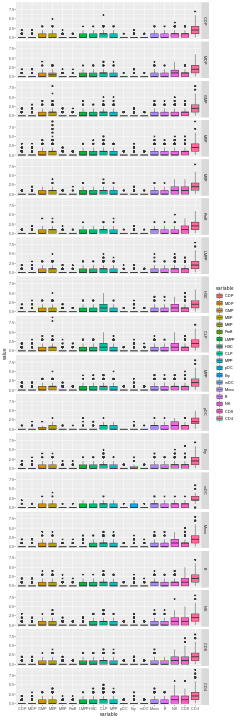

In [555]:
## Alternatively, directly use the boxplot to show number of cells in a given target celltype (variable) for a seed grouo (facet), doesnot look informtive 
options(repr.plot.width=8, repr.plot.height=24,repr.plot.res=30)
ggplot(w_jaccard.celltype.df.m)+aes(variable,value,fill=variable)+geom_boxplot()+facet_grid(Seed~.)

# Visulize consensus family sizes, leading to the consensus rejection rate normalization

In [362]:
DN4_BMMC_Consensus.raw<-read.table("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_BMMC/MTenrichCombine/mitoV/final/RawGenotypes.Total.StrandBalance")
DN4_HPC_Consensus.raw<-read.table("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HPC/MTenrichCombine/mitoV/final/RawGenotypes.Total.StrandBalance")
DN4_HSC_Consensus.raw<-read.table("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/DN4_HSC/MTenrichCombine/mitoV/final/RawGenotypes.Total.StrandBalance")

In [29]:
colnames(DN4_BMMC_Consensus.raw)<-c("ID","Cell","Pos","Call","Alt","Ref","FamSize","GT_cts","CSS","DB_cts","SG_cts","Strand0","Strand1","TotalQualifyCTS")
colnames(DN4_HPC_Consensus.raw)<-c("ID","Cell","Pos","Call","Alt","Ref","FamSize","GT_cts","CSS","DB_cts","SG_cts","Strand0","Strand1","TotalQualifyCTS")
colnames(DN4_HSC_Consensus.raw)<-c("ID","Cell","Pos","Call","Alt","Ref","FamSize","GT_cts","CSS","DB_cts","SG_cts","Strand0","Strand1","TotalQualifyCTS")

In [26]:
options(repr.plot.width=3.5,repr.plot.height=3,repr.plot.res=300)

In [361]:
m<-median(subset(DN4_BMMC_Consensus.raw,FamSize>=3)$FamSize)
p1<-ggplot(DN4_BMMC_Consensus.raw)+aes(FamSize)+geom_histogram(binwidth=1,color="black")+xlim(0,50)+theme_classic()+geom_vline(xintercept=3,linetype=2,color="red")+
    labs(x="Family size(no of reads per family)",y="Candidate variants")+theme(axis.text = element_text(color="black"))+ggtitle(paste("Median family size:",m))

ERROR: Error in eval(e, x, parent.frame()): object 'FamSize' not found


In [221]:
options(repr.plot.width=16, repr.plot.height=6,repr.plot.res=30)
m<-median(subset(DN4_HPC_Consensus.raw,FamSize>=3)$FamSize)
p2<-ggplot(DN4_HPC_Consensus.raw)+aes(FamSize)+geom_histogram(binwidth=1,color="black")+xlim(0,50)+theme_classic()+geom_vline(xintercept=3,linetype=2,color="red")+
    labs(x="Family size(no of reads per family)",y="Candidate variants")+theme(axis.text = element_text(color="black"))+ggtitle(paste("Median family size:",m))

ERROR: Error in subset(DN4_HPC_Consensus.raw, FamSize >= 3): object 'DN4_HPC_Consensus.raw' not found


Warning message:
“Removed 838 rows containing non-finite values (stat_bin).”
Warning message:
“Removed 2 rows containing missing values (geom_bar).”


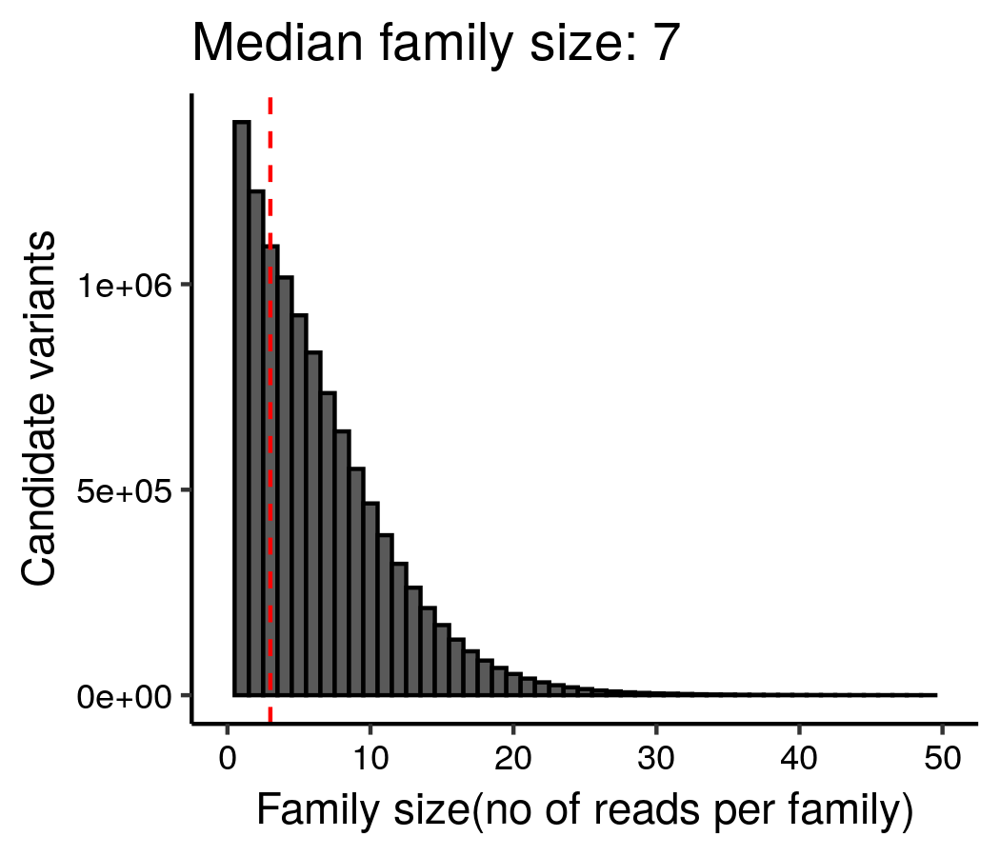

In [41]:
m<-median(subset(DN4_HSC_Consensus.raw,FamSize>=3)$FamSize)
p3<-ggplot(DN4_HSC_Consensus.raw)+aes(FamSize)+geom_histogram(binwidth=1,color="black")+xlim(0,50)+theme_classic()+geom_vline(xintercept=3,linetype=2,color="red")+labs(x="Consensus family size")+
    labs(x="Family size(no of reads per family)",y="Candidate variants")+theme(axis.text = element_text(color="black"))+ggtitle(paste("Median family size:",m))

## Explore the mutation relationships between STEM, comitted progenitors and mature cells

In [517]:
HSC_HPC_BMMC_mitoTracing.Sensitive

        Threhold qualifiedCellCut       OnlyHetero           VAFcut 
     "Sensitive"             "10"           "TRUE"              "1" 
         Cellcut        maxctscut 
             "2"              "2" 
[1] "Total Cell number: 17710"

BMMC  HPC  HSC 
5816 6210 5684 
[1] "Total Variant number: 8086"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: para"               "Slot: Seurat"            
 [9] "Slot: DataToplotList"     "Slot: DistObjects"       
[11] "Slot: TREE"              

In [537]:
HSC_HPC_BMMC_mitoTracing.Sensitive@GTsummary.filtered %>% head

,Var1,Cell,Variants,Freq,depth,Type,Context,hetero
,<fct>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<dbl>
2,AAACAAGCACATTGTC_10537_G_A,AAACAAGCACATTGTC_1,10537_G_A,1,53,G_A,GCG,0.01886792
12,AAACAAGCACATTGTC_13041_A_G,AAACAAGCACATTGTC_1,13041_A_G,1,55,A_G,GTC,0.01818182
13,AAACAAGCACATTGTC_13339_T_C,AAACAAGCACATTGTC_1,13339_T_C,2,69,T_C,CTT,0.02898551
24,AAACAAGCACATTGTC_16048_G_A,AAACAAGCACATTGTC_1,16048_G_A,1,57,G_A,CCC,0.01754386
25,AAACAAGCACATTGTC_16049_G_A,AAACAAGCACATTGTC_1,16049_G_A,1,58,G_A,CCA,0.01724138
26,AAACAAGCACATTGTC_16051_A_T,AAACAAGCACATTGTC_1,16051_A_T,1,54,A_T,ATG,0.01851852


In [541]:
HSC_HPC_BMMC_GTsummary_Anno<-merge(HSC_HPC_BMMC_mitoTracing.Sensitive@GTsummary.filtered,CheckVNumber.sensitive[,c("Cell","STD_Cat")],by="Cell") 

In [549]:
HSC_HPC_BMMC_GTsummary_Anno %>% subset(.,Variants=="11040_T_C")

,Cell,Var1,Variants,Freq,depth,Type,Context,hetero,STD_Cat
,<chr>,<fct>,<chr>,<int>,<dbl>,<chr>,<chr>,<dbl>,<fct>
1,AAACAAGCAAACTAAC_3,AAACAAGCAAACTAAC_11040_T_C,11040_T_C,1,28,T_C,CTC,0.035714286,Lym
15507,ACAAGGTTCACACCGT_3,ACAAGGTTCACACCGT_11040_T_C,11040_T_C,1,55,T_C,CTC,0.018181818,Lym
56879,CAATGAGGTCCCTCTG_2,CAATGAGGTCCCTCTG_11040_T_C,11040_T_C,1,118,T_C,CTC,0.008474576,Mye_P
74198,CCGTTACAGATAACCA_3,CCGTTACAGATAACCA_11040_T_C,11040_T_C,1,38,T_C,CTC,0.026315789,Lym
80684,CGACTTGGTTAGGCGG_2,CGACTTGGTTAGGCGG_11040_T_C,11040_T_C,30,70,T_C,CTC,0.428571429,Mye_P
88046,CGGTCCATCGACAAAC_1,CGGTCCATCGACAAAC_11040_T_C,11040_T_C,28,59,T_C,CTC,0.474576271,EarlyP
106324,CTTGCTCGTATAGCGA_1,CTTGCTCGTATAGCGA_11040_T_C,11040_T_C,13,43,T_C,CTC,0.302325581,Stem
106975,CTTTAGCCAAGGCTGT_3,CTTTAGCCAAGGCTGT_11040_T_C,11040_T_C,1,43,T_C,CTC,0.023255814,Lym
126335,GCATGTTGTTATGGGA_2,GCATGTTGTTATGGGA_11040_T_C,11040_T_C,17,47,T_C,CTC,0.361702128,EarlyP


In [550]:
HSC_HPC_BMMC_GTsummary_Anno$STD_Cat %>% unique

[1] Lym    Stem   EarlyP Mye_P  Lym_P  Mye   
Levels: Stem EarlyP Mye_P Lym_P Mye Lym

In [559]:
Variant_Cell_Distribution<-HSC_HPC_BMMC_GTsummary_Anno %>% group_by(Variants) %>% count(STD_Cat) %>% dcast(Variants~STD_Cat) %>% tibble::column_to_rownames(var = "Variants")

Using n as value column: use value.var to override.



In [561]:
Variant_Cell_Distribution[is.na(Variant_Cell_Distribution)]<-0

In [595]:
subset(Variant_Cell_Distribution,Stem<=1 & EarlyP<=1 & Mye_P<=1 & Lym>=3) %>% .[order(.$Lym,decreasing=T),]

,Stem,EarlyP,Mye_P,Lym_P,Mye,Lym
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
10962_T_A,1,1,1,0,0,12
11210_T_G,1,0,1,2,0,12
16316_A_G,1,1,1,2,1,9
657_G_A,1,1,1,2,0,9
8578_C_T,1,1,1,2,2,9
1897_A_C,0,0,1,1,1,8
8458_A_C,0,1,0,2,2,7
10155_A_G,1,1,1,2,1,6
13895_T_C,1,0,0,1,0,6


In [596]:
subset(Variant_Cell_Distribution,Stem<=1) %>% dim

[1] 2038    6

In [568]:
(Lineage.Repr.Exp<-colSums(Variant_Cell_Distribution)/sum(colSums(Variant_Cell_Distribution)))

#Variant_Cell_Distribution[order(Variant_Cell_Distribution$Lym_P,decreasing=T),] %>% head(.,n=50)

Stem     EarlyP      Mye_P      Lym_P        Mye        Lym 
0.18389621 0.15003565 0.26237754 0.09814898 0.07951995 0.22602167

In [581]:
subset(Variant_Cell_Distribution,Stem<=1) %>% .[order(.$Lym_P,decreasing=T),] %>% .[1:50,]

,Stem,EarlyP,Mye_P,Lym_P,Mye,Lym
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
854_T_C,0,6,24,11,6,25
12571_A_T,0,9,21,10,12,24
10541_A_C,1,8,14,8,2,4
6060_A_G,0,5,10,8,4,12
6274_C_A,1,5,20,8,7,14
13469_T_C,1,2,11,7,0,5
14266_C_A,1,4,10,7,9,7
14459_G_A,1,3,13,7,4,14
8901_A_G,1,2,3,7,0,5


In [582]:
apply(Variant_Cell_Distribution,1,function(x){x/sum(x)}) %>% t() -> test

In [588]:
apply(test,1,function(x){log2(x/Lineage.Repr.Exp)}) %>% t()

,Stem,EarlyP,Mye_P,Lym_P,Mye,Lym
1000_T_C,-0.25740336,0.03618306,0.8148066,-Inf,-0.04790037,-0.55497272
10000_G_A,0.53614576,-Inf,-0.3916443,-Inf,1.33061126,0.56050450
10001_T_C,0.44303636,0.73662278,-1.6546787,-0.2360796,0.06757685,0.14546700
10002_A_C,-Inf,0.73662278,-1.0697162,-Inf,0.65253935,1.14546700
10005_A_G,-1.25740336,0.03618306,0.8148066,-0.3515568,-Inf,0.02998978
10007_T_C,-Inf,-0.07073214,0.7078914,-Inf,0.84518443,0.33811207
10009_G_A,-1.01639526,-0.72280884,-0.5291478,0.8894513,0.19310773,0.68603538
10010_T_C,-Inf,1.15166028,0.3453213,-Inf,1.48261435,-1.02445801
10013_C_A,-0.50649858,0.01974860,0.3453213,0.2868733,0.02493251,-0.29310602
10014_G_A,0.08046628,-0.11137413,0.5677138,-0.2360796,0.48261435,-1.43949550


In [597]:
head(Variant_Cell_Distribution)

,Stem,EarlyP,Mye_P,Lym_P,Mye,Lym
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1000_T_C,2,2,6,0,1,2
10000_G_A,4,0,3,0,3,5
10001_T_C,3,3,1,1,1,3
10002_A_C,0,2,1,0,1,4
10005_A_G,1,2,6,1,0,3
10007_T_C,0,1,3,0,1,2


In [622]:

compute.binom.p<-function(x){
m<-binom.test(x[1],sum(x),Lineage.Repr.Exp[1],alternative = "less")
return(m$p.value)    
}


In [625]:
allPs<-apply(Variant_Cell_Distribution,1,compute.binom.p)

In [649]:
# Variant_Cell_Distribution[names(allPs[which(allPs<=0.1)]),] %>% subset(.,Stem<=1)

In [641]:
binom.test(0,10,0.18,alternative = "less")


	Exact binomial test

data:  0 and 10
number of successes = 0, number of trials = 10, p-value = 0.1374
alternative hypothesis: true probability of success is less than 0.18
95 percent confidence interval:
 0.0000000 0.2588656
sample estimates:
probability of success 
                     0 


In [644]:
rowSums(Variant_Cell_Distribution) %>% quantile()

0%   25%   50%   75%  100% 
    1     9    16    26 14818

In [647]:
subset(Variant_Cell_Distribution,Stem==0) %>% dim

[1] 748   6

In [646]:
dim(Variant_Cell_Distribution)

[1] 8085    6

In [648]:
head(Variant_Cell_Distribution)

,Stem,EarlyP,Mye_P,Lym_P,Mye,Lym
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1000_T_C,2,2,6,0,1,2
10000_G_A,4,0,3,0,3,5
10001_T_C,3,3,1,1,1,3
10002_A_C,0,2,1,0,1,4
10005_A_G,1,2,6,1,0,3
10007_T_C,0,1,3,0,1,2


# Explore treemut

In [ ]:
library(devtools)
install_git("https://github.com/NickWilliamsSanger/treemut")

In [ ]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/DN4_HSC_HPC_BMMC_mitoTracing.Sensitive")

In [657]:
HSC_HPC_BMMC_mitoTracing.Sensitive<-AddDist(HSC_HPC_BMMC_mitoTracing.Sensitive)

In [661]:
HSC_HPC_BMMC_mitoTracing.Sensitive@DistObjects

An object of class "DistObjects"
Slot "jaccard":
NULL

Slot "Dice":
NULL

Slot "jaccard3W":
NULL


In [665]:
#detach("package:scMitoTracing",unload=T)
install.packages("/lab/solexa_weissman/cweng/Packages/scMitoTracing/")
library(scMitoTracing)

Installing scMitoTracing [0.0.0.9000] ...
	OK [built from source]


Warning message:
“replacing previous import ‘ape::rotate’ by ‘ggtree::rotate’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘dplyr::combine’ by ‘gridExtra::combine’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘dplyr::filter’ by ‘stats::filter’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘dplyr::lag’ by ‘stats::lag’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘stats::filter’ by ‘tidytree::filter’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘phytools::read.newick’ by ‘treeio::read.newick’ when loading ‘scMitoTracing’”
Warning message:
“replacing previous import ‘ape::drop.tip’ by ‘treeio::drop.tip’ when loading ‘scMitoTracing’”

Attaching package: ‘scMitoTracing’


The following object is masked _by_ ‘.GlobalEnv’:

    ComputeRejectRate




# Stem cell focused phylo

## Make DN4_HSC_mitoTracing.Sensitive (Subset_MitoTracing)

In [673]:
# Legacy
# HSC_HPC_mitoTracing.verysensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary,DN4_HPC.VariantsGTSummary),
#                 depth_list=list(DN4_HSC.depth,DN4_HPC.depth),
#                 feature.list_list=list(DN4_HSC.Variants.feature.lst,DN4_HPC.Variants.feature.lst),
#                 meta_list=list(Donor04_HSC.meta,Donor04_HPC.meta),
#                 labels=c("HSC","HPC"),thr="VerySensitive")
# HSC_HPC_mitoTracing.verysensitive<-Make_matrix(HSC_HPC_mitoTracing.verysensitive)
# HSC_HPC_mitoTracing.verysensitive<-SeuratLSIClustering(HSC_HPC_mitoTracing.verysensitive)
# HSC_HPC_mitoTracing.verysensitive<-AddDatatoplot_clustering(HSC_HPC_mitoTracing.verysensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

10:36:37 UMAP embedding parameters a = 0.9922 b = 1.112

10:36:37 Read 11889 rows and found 20 numeric columns

10:36:37 Using Annoy for neighbor search, n_neighbors = 30

10:36:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:36:41 Writing NN index file to temp file /tmp/RtmpKT5jpD/file31cd3b9e3c5b

10:36:41 Searching Annoy index using 1 thread, search_k = 3000

10:36:46 Annoy recall = 100%

10:36:50 Commencing smooth kNN distance calibration using 1 thread

10:36:50 6 smooth knn distance failures

10:36:57 Initializing from normalized Laplacian + noise

10:36:57 Commencing optimization for 200 epochs, with 516846 positive edges

10:37:06 Optimization finished

Computing nearest neighbor graph

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11889
Number of edges: 387110

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9650
Number of communities: 36
Elapsed time: 1 seconds


In [499]:
## To make HSC_HPC_mitoTracing.sensitive
HSC_HPC_mitoTracing.sensitive<-Create_mitoTracing(GTsummary_list=list(DN4_HSC.VariantsGTSummary,DN4_HPC.VariantsGTSummary),
                depth_list=list(DN4_HSC.depth,DN4_HPC.depth),
                feature.list_list=list(DN4_HSC.Variants.feature.lst,DN4_HPC.Variants.feature.lst),
                meta_list=list(Donor04_HSC.meta,Donor04_HPC.meta),
                labels=c("HSC","HPC"),thr="Sensitive")
HSC_HPC_mitoTracing.sensitive<-Make_matrix(HSC_HPC_mitoTracing.sensitive)
HSC_HPC_mitoTracing.sensitive<-SeuratLSIClustering(HSC_HPC_mitoTracing.sensitive,)
HSC_HPC_mitoTracing.sensitive<-AddDatatoplot_clustering(HSC_HPC_mitoTracing.sensitive)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

12:12:41 UMAP embedding parameters a = 0.9922 b = 1.112

12:12:41 Read 11866 rows and found 20 numeric columns

12:12:41 Using Annoy for neighbor search, n_neighbors = 30

12:12:41 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:12:46 Writing NN index file to temp file /tmp/Rtmpi0IxYs/file7b7873e4b30

12:12:46 Searching Annoy index using 1 thread, search_k = 3000

12:12:51 Annoy recall = 99.92%

12:12:54 Commencing smooth kNN distance calibration using 1 thread

12:12:54 45 smooth knn distance failures

12:12:59 Initializing from normalized Laplacian + noise

12:13:01 Commencing optimization for 200 epochs, with 517884 positive edges

12:13:09 Optimization finished

Computing nearest neighbor gra

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 11866
Number of edges: 378558

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9712
Number of communities: 38
Elapsed time: 0 seconds


In [6]:
#saveRDS(HSC_HPC_mitoTracing.sensitive,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HSC_HPC_mitoTracing.sensitive.rds")
HSC_HPC_mitoTracing.sensitive<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/HSC_HPC_mitoTracing.sensitive.rds")

---
- Make HSC only Gene expression/ ATAC Seurat object
- The order in the object Donor04_agg_Multiome_wrapper was BMMC -1; HPC -2;  HSC -3
- In the HSC_HPC_mitoTracing.sensitive, HSC -1  HPC -2 \
- Therefor Use Translate_RNA2ATAC(..., from= c(2,3),to=c(2,1))

Below is to Extract HSC cells and subset a new MitoTracing object from HSC_HPC_mitoTracing.sensitive

In [101]:
## Extract the HSCs cell names
HSCs<-subset(HSC_HPC_mitoTracing.sensitive@CellMeta,CellType=="HSC")$Cell %>% .[. %in% row.names(HSC_HPC_mitoTracing.sensitive@Cts.Mtx.bi)]
## Make the Subset MitoTracing object 
DN4_SLCT_HSC_mitoTracing.Sensitive<-Subset_MitoTracing(HSC_HPC_mitoTracing.sensitive,Cells=HSCs,ExtraInfo="Subset from HSC_HPC_mitoTracing.sensitive")


[1] "Raw slots are skipped: -GTsummary.filtered, -V.fitered.list, "


In [102]:
DN4_SLCT_HSC_mitoTracing.Sensitive

                                   Threhold 
                                "Sensitive" 
                           qualifiedCellCut 
                                       "10" 
                                 OnlyHetero 
                                     "TRUE" 
                                     VAFcut 
                                        "1" 
                                    Cellcut 
                                        "2" 
                                  maxctscut 
                                        "2" 
                                      Extra 
"Subset from HSC_HPC_mitoTracing.sensitive" 
[1] "Total Cell number: 3991"

 HPC  HSC 
 570 3421 
[1] "Total Variant number: 5249"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplo

In [103]:
DN4_SLCT_HSC_mitoTracing.Sensitive<-SeuratLSIClustering(DN4_SLCT_HSC_mitoTracing.Sensitive,lsidim=2:50,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))
DN4_SLCT_HSC_mitoTracing.Sensitive<-AddDist(DN4_SLCT_HSC_mitoTracing.Sensitive,weightDF=V.weight,LSIdist=T,dim=2:50)

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

14:44:18 UMAP embedding parameters a = 0.9922 b = 1.112

14:44:18 Read 3920 rows and found 49 numeric columns

14:44:18 Using Annoy for neighbor search, n_neighbors = 30

14:44:18 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

14:44:20 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b41a6dffd7

14:44:20 Searching Annoy index using 1 thread, search_k = 3000

14:44:21 Annoy recall = 100%

14:44:26 Commencing smooth kNN distance calibration using 1 thread

14:44:26 22 smooth knn distance failures

14:44:32 Initializing from normalized Laplacian + noise

14:44:32 Commencing optimization for 500 epochs, with 159914 positive edges

14:44:40 Optimization finished

Computing nearest neighbor graph

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3920
Number of edges: 140465

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9116
Number of communities: 35
Elapsed time: 0 seconds
[1] "Weight vector matches well with the Cell-Variant matrix, continue..."
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Available method:"
[1] "Jaccard"     "Dice"        "3WJaccard"   "Simpson"     "Kulczynski2"
[6] "Ochiai"      "Hamming"    
[1] "This function compute pairwise distance(row-row) for binary matrix, input sparse matrix(Each row is cell, each column is variant)"
[1] "Availa

## Plot the HSC clone (UMAP)

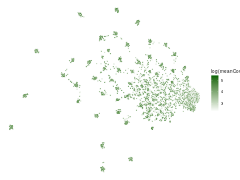

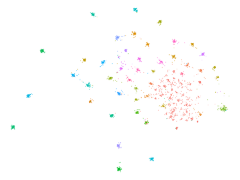

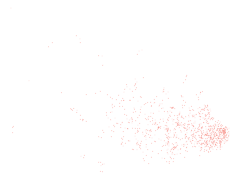

In [105]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=30)
DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,HSC_HPC_mitoTracing.sensitive@CellMeta) %>%  ggplot()+aes(UMAP_1,UMAP_2,color=log(meanCov))+
    geom_point(size=0.8,alpha=0.5)+scale_color_gradient(low="white",high="darkgreen")+theme_void()
DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data) %>% subset(.,seurat_clusters!=0) %>% ggplot()+aes(UMAP_1,UMAP_2, color=seurat_clusters)+
    geom_point(size=0.8,alpha=0.2)+theme_void()+theme(legend.position = "none")
DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data) %>% subset(.,seurat_clusters==0) %>% ggplot()+aes(UMAP_1,UMAP_2, color=seurat_clusters)+
    geom_point(size=0.8,alpha=0.2)+theme_void()+theme(legend.position = "none")

## Building trees, in-house

In [106]:
DN4_SLCT_HSC_LSI.njtree<-Make_tree(DN4_SLCT_HSC_mitoTracing.Sensitive,d = "LSIdist",algorithm = "nj",onlyreturntree = T)

In [107]:
DN4_SLCT_HSC_w_jaccard.njtree<-Make_tree(DN4_SLCT_HSC_mitoTracing.Sensitive,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)

In [108]:
DN4_SLCT_HSC_w_cosine.njtree<-Make_tree(DN4_SLCT_HSC_mitoTracing.Sensitive,d = "w_cosine",algorithm = "nj",onlyreturntree = T)

In [129]:
options(repr.plot.width=30,repr.plot.height=10,repr.plot.res=60)
#ggtree(DN4_HSC_w_jaccard.njtree@treedata, layout="circular", branch.length='none')
p1<-ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata ) #, branch.length='none' layout="circular"
p2<-ggtree(DN4_SLCT_HSC_w_cosine.njtree@treedata, layout="circular",branch.length='none')
p3<-ggtree(DN4_SLCT_HSC_LSI.njtree@treedata, layout="circular", branch.length='none')
grid.arrange(p1,p2,p3,nrow=1)

Warning message:
“The tree contained negative edge lengths. If you want to ignore the edges,
you can set 'options(ignore.negative.edge=TRUE)', then re-run ggtree.”


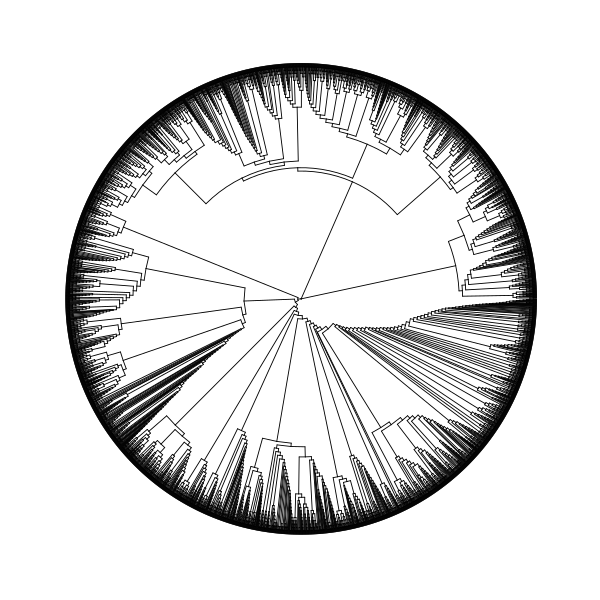

In [639]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=60)
ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata,branch.length = "none",layout = "circular") 


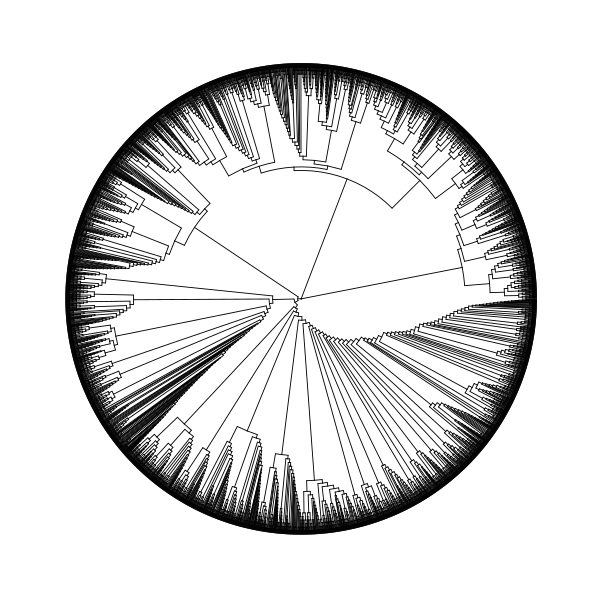

In [640]:
ggtree(DN4_SLCT_HSC_w_cosine.njtree@treedata,branch.length = "none",layout = "circular") 


## Clone Partitioning: LSI (Default), w_Jaccard and w_cosine based 

In [324]:
library(Seurat)

In [325]:
DN4_SLCT_HSC_w_jaccard.SNN<-FindNeighbors(DN4_SLCT_HSC_mitoTracing.Sensitive@DistObjects@w_jaccard)
DN4_SLCT_HSC_w_cosine.SNN<-FindNeighbors(DN4_SLCT_HSC_mitoTracing.Sensitive@DistObjects@w_cosine)

Building SNN based on a provided distance matrix

Computing SNN

Building SNN based on a provided distance matrix

Computing SNN



In [619]:
jaccard_cluster_2<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 2)
jaccard_cluster_2.2<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 2.2)
jaccard_cluster_2.4<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 2.4)
jaccard_cluster_2.6<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 2.6)
jaccard_cluster_2.8<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 2.8)
jaccard_cluster_3<-FindClusters(DN4_SLCT_HSC_w_jaccard.SNN[[2]],resolution = 3.0)
cosine<-FindClusters(DN4_SLCT_HSC_w_cosine.SNN[[2]],resolution = 1.6)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4026
Number of communities: 35
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3860
Number of communities: 40
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3712
Number of communities: 63
Elapsed time: 0 seconds
Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3597
Number of communities: 90
Elapsed time: 0 seconds


5 singletons identified. 85 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3495
Number of communities: 107
Elapsed time: 0 seconds


5 singletons identified. 102 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 269177

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.3401
Number of communities: 133
Elapsed time: 0 seconds


18 singletons identified. 115 final clusters.



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3924
Number of edges: 697702

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.1849
Number of communities: 91
Elapsed time: 1 seconds


5 singletons identified. 86 final clusters.



In [620]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=120)
# plot(table(jaccard_cluster_2$res.2))
# plot(table(jaccard_cluster_2.2$res.2.2))
# plot(table(jaccard_cluster_2.4$res.2.4))
# plot(table(jaccard_cluster_2.6$res.2.6))
# plot(table(jaccard_cluster_2.8$res.2.8))
# plot(table(jaccard_cluster_3.0$res.3))

# table(jaccard_cluster_3.0$res.3)

In [621]:
# as.hclust.phylo(DN4_SLCT_HSC_w_jaccard.njtree@phylo)   the tree is not ultrametric

### Subclustering reclustering 0 and 1

,orig.ident.x,nCount_mitoV,nFeature_mitoV,mitoV_snn_res.0.6,seurat_clusters.x,Cell,meanCov,orig.ident.y,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters.y,CellType,Label
,<fct>,<dbl>,<int>,<fct>,<fct>,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCACATTGTC_1,SeuratProject,16,16,5,5,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACCTCGAC_2,SeuratProject,12,12,1,1,AAACAAGCACCTCGAC_2,47.40672,SeuratProject,3555,2016,18492,8735,4483,2017,0.5287142,0.4712858,2,2,HSC,HPC
AAACCAGGTTAGCCAT_1,SeuratProject,12,12,9,9,AAACCAGGTTAGCCAT_1,63.90531,SeuratProject,5366,2202,29607,12383,5367,2202,0.6139536,0.3860464,4,4,HSC,HSC


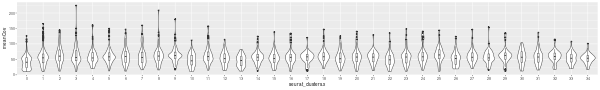

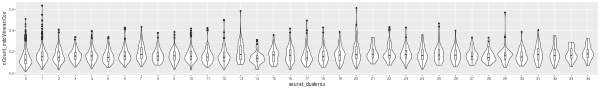

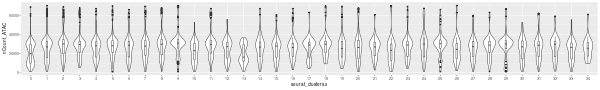

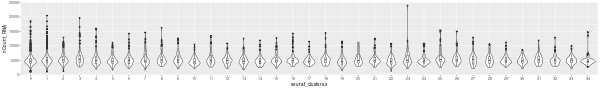

In [618]:
options(repr.plot.width=20,repr.plot.height=3,repr.plot.res=30)
MetaMeta<-DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data %>% Tomerge_v2(.,DN4_SLCT_HSC_mitoTracing.Sensitive@CellMeta)
head(MetaMeta,n=3) 
ggplot(MetaMeta)+aes(seurat_clusters.x,meanCov)+geom_violin()+geom_boxplot(width=0.1)
ggplot(MetaMeta)+aes(seurat_clusters.x,nCount_mitoV/meanCov)+geom_violin()+geom_boxplot(width=0.1)
ggplot(MetaMeta)+aes(seurat_clusters.x,nCount_ATAC)+geom_violin()+geom_boxplot(width=0.1)
ggplot(MetaMeta)+aes(seurat_clusters.x,nCount_RNA)+geom_violin()+geom_boxplot(width=0.1)

In [611]:
A<-colSums(DN4_SLCT_HSC_mitoTracing.Sensitive@Cts.Mtx.bi)

In [612]:
A["Variants16086TC"]
A["Variants8155GA"]

Variants16086TC 
             11

Variants8155GA 
            11

In [613]:
Cluster0<-subset(DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data,seurat_clusters==0)  %>% row.names
Cluster16<-subset(DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data,seurat_clusters==16) %>% row.names
x<-DN4_SLCT_HSC_mitoTracing.Sensitive@Cts.Mtx.bi[sample(Cluster16,1),]
A[names(x[x>0])]

Variants10232AG Variants12302CT Variants12868GA Variants12878GA  Variants1421GT 
              3               9              17               3              18 
Variants15196AG Variants16541AG   Variants310TC   Variants570CT  Variants5728TG 
             27              29            3438               5              76 
 Variants6221TC  Variants6895AG  Variants7880TC  Variants9498TA 
             25               2              22               3

In [614]:
## Extract Cluster 0 cell name
Cluster0<-subset(DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data,seurat_clusters==0) %>% row.names

DN4_SLCT_HSC_C0_mitoTracing.Sensitive<-Subset_MitoTracing(DN4_SLCT_HSC_mitoTracing.Sensitive,Cells = Cluster0, ExtraInfo = "Subet cluster 0 from DN4_HSC_mitoTracing.Sensitive")


[1] "Raw slots are skipped: -GTsummary.filtered, -V.fitered.list, "


In [615]:
## Clustering
DN4_SLCT_HSC_C0_mitoTracing.Sensitive<-SeuratLSIClustering(DN4_SLCT_HSC_C0_mitoTracing.Sensitive,lsidim=2:30,rmvariants=c("Variants310TC","Variants3109TC","Variants5764CT"))

Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

10:18:43 UMAP embedding parameters a = 0.9922 b = 1.112

10:18:43 Read 983 rows and found 29 numeric columns

10:18:43 Using Annoy for neighbor search, n_neighbors = 30

10:18:43 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

10:18:44 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b42173ec84

10:18:44 Searching Annoy index using 1 thread, search_k = 3000

10:18:44 Annoy recall = 83.83%

10:18:48 Commencing smooth kNN distance calibration using 1 thread

10:18:48 194 smooth knn distance failures

10:18:53 Initializing from normalized Laplacian + noise

10:18:53 Commencing optimization for 500 epochs, with 37580 positive edges

10:18:58 Optimization finished

Computing nearest neighbor grap

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 983
Number of edges: 71578

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4912
Number of communities: 2
Elapsed time: 0 seconds


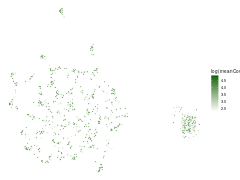

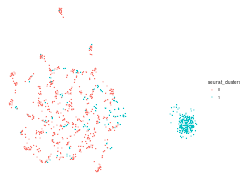

In [616]:
## Plot
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=30)
DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,DN4_SLCT_HSC_C0_mitoTracing.Sensitive@CellMeta) %>%  ggplot()+aes(UMAP_1,UMAP_2,color=log(meanCov))+
    geom_point(size=0.8,alpha=0.5)+scale_color_gradient(low="white",high="darkgreen")+theme_void()
DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings %>% Tomerge_v2(.,DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Seurat@meta.data) %>% ggplot()+aes(UMAP_1,UMAP_2, color=seurat_clusters)+
    geom_point(size=0.8,alpha=1)+theme_void()#+theme(legend.position = "none")

### Find marker and plot on the UMAP for subclone0 and 1

In [629]:
DN4_SLCT_HSC_C0_Variant.markers <- FindAllMarkers(DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Seurat, only.pos = TRUE, min.pct = 0.0001, logfc.threshold = 0.1)

Calculating cluster 0

Calculating cluster 1

Warning message:
“No DE genes identified”


In [630]:
head(DN4_SLCT_HSC_C0_Variant.markers,n=3)

<0 x 0 matrix>

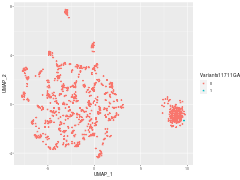

In [631]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=30)
datatoplot<-Tomerge_v2(DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Seurat@reductions$umap@cell.embeddings,as.data.frame(DN4_SLCT_HSC_C0_mitoTracing.Sensitive@Cts.Mtx.bi[,"Variants11711GA",drop=F])) 
datatoplot$Variants11711GA<-as.factor(datatoplot$Variants11711GA)
ggplot(datatoplot)+aes(UMAP_1,UMAP_2,color=Variants11711GA)+geom_point()

## Build external trees using MPboot,  IQtree, and Matt's Casiopea

- Write .phy format for MPboot and IQtree ( Write out two versions, full variants)

In [83]:
setwd("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/PhyloTree")

In [84]:
cat(paste(paste(dim(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi),collapse=" "),"\n",sep=""),file="DN4_HSC_mitoTracing.Sensitive.phy")
write.table(as.matrix(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi),"DN4_HSC_mitoTracing.Sensitive.phy",append=T,col.names = F,quote = F,)

- Write .phy format with top three recurrent variant removed

In [91]:
DN4_HSC_Sensitive.Mtx.bi.RmRecV<-DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi[,!colnames(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi) %in% c("Variants310TC","Variants3109TC","Variants5764CT")]
DN4_HSC_Sensitive.Mtx.bi.RmRecV<-DN4_HSC_Sensitive.Mtx.bi.RmRecV[rowSums(DN4_HSC_Sensitive.Mtx.bi.RmRecV)>0,]

In [94]:
cat(paste(paste(dim(DN4_HSC_Sensitive.Mtx.bi.RmRecV),collapse=" "),"\n",sep=""),file="DN4_HSC_Sensitive.Mtx.bi.RmRecV.phy")
write.table(as.matrix(DN4_HSC_Sensitive.Mtx.bi.RmRecV),"DN4_HSC_Sensitive.Mtx.bi.RmRecV.phy",append=T,col.names = F,quote = F,)

- write out csv for Cas

In [95]:
setwd("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/PhyloTree/Cas")

In [99]:
write.table(as.matrix(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi),"DN4_HSC_mitoTracing.Sensitive.csv",col.names = T,quote = F,sep="\t")
write.table(as.matrix(DN4_HSC_Sensitive.Mtx.bi.RmRecV),"DN4_HSC_Sensitive.Mtx.bi.RmRecV.csv",col.names = T,quote = F,sep="\t")

## Compare trees

- w_jaccard
- w_cosine
- IQ
- MPboot

In [ ]:
read.tree()

## Prepare to annotate tree Make matched Multiome_wrapper for DN4_SLCT_HSC_mitoTracing.Sensitive

- Below to make the matched Multiome_wrapper, Here I can directly use Celltype to Extract RNAnames. Alternatively, I can use Translate_RNA2ATAC, and map use the ATACname to find RNAname(With the correct CellRanger postfix) to run Multi_Wrapper(path, atacmin=1000,umimin =1000,CellID = HSC.RNAname)

In [816]:
Donor04_agg_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_agg_Multiome_wrapper.rds")

In [817]:
HSC.RNAname<-row.names(subset(Donor04_agg_Multiome_wrapper@meta.data,CellType=="HSC"))

<blockquote>Here I'm going to directly use Multi_Wrapper to take from /lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs, therefore, the ATAC peak total set may be not the most appropriate</blockquote>

In [573]:
# Donor04_HSC_Multiome_wrapper<-Multi_Wrapper(path="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs",atacmin=1000,umimin =1000,CellID = HSC.RNAname )

Loading required package: EnsDb.Hsapiens.v86

Loading required package: ensembldb

Loading required package: BiocGenerics


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following object is masked from ‘package:gridExtra’:

    combine


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Loading required package: GenomicRanges

Loading required package: stats4

Loading required package: S4Vectors


Attaching package: ‘S4

In [815]:
#saveRDS(Donor04_HSC_Multiome_wrapper,"/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_HSC_Multiome_wrapper.RDS")
Donor04_HSC_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_HSC_Multiome_wrapper.RDS")

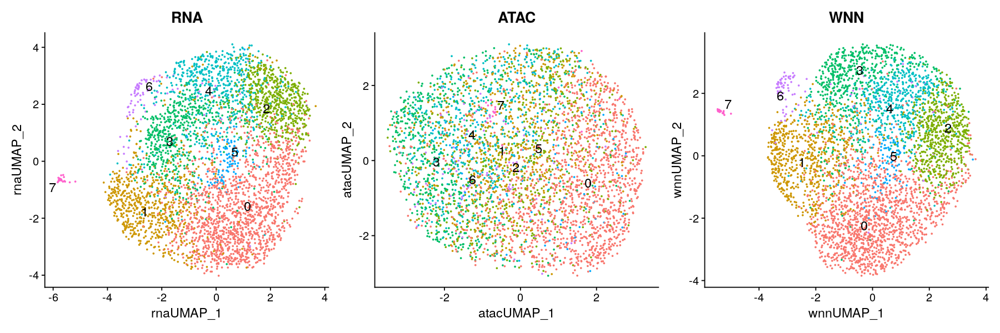

In [818]:
options(repr.plot.width=15, repr.plot.height=5,repr.plot.res=120)
p1 <- DimPlot(Donor04_HSC_Multiome_wrapper, reduction = "umap.rna",  label = T, label.size = 5, repel = TRUE) + ggtitle("RNA")
p2 <- DimPlot(Donor04_HSC_Multiome_wrapper, reduction = "umap.atac",  label = T, label.size = 5, repel = TRUE) + ggtitle("ATAC")
p3 <- DimPlot(Donor04_HSC_Multiome_wrapper, reduction = "wnn.umap", label = T, label.size = 5, repel = TRUE) + ggtitle("WNN")
p1 + p2 + p3 & NoLegend() & theme(plot.title = element_text(hjust = 0.5))

In [824]:
## Generate a annotable that plot clone cluster on RNA umap, ATACumap amd LSIs
DN4_HSC_mitoTracing.AnnTable<-Make_AnnTable(DN4_SLCT_HSC_mitoTracing.Sensitive,Donor04_HSC_Multiome_wrapper,PostTrans_from=c(2,3),PostTrans_to=c(2,1),LSI=T)

[1] "3991 Cells in MitoTracing object, 4107 Cells in Multiome_wrapper object --- 3893 Cells matched"


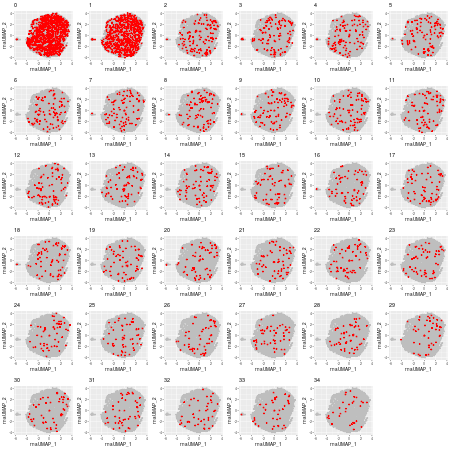

In [1206]:
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res=30)
datatoplot<-DN4_HSC_mitoTracing.AnnTable
ps<-list()
for(i in 0:34){
p<-ggplot(datatoplot)+aes(rnaUMAP_1,rnaUMAP_2)+geom_point(color="grey")+geom_point(aes(rnaUMAP_1,rnaUMAP_2),data=subset(datatoplot,clone_clusters==i),color="red")+ggtitle(i)
ps<-c(ps,list(p))
}  
  
grid.arrange(grobs=ps)
#ifelse2(.$seurat_clusters==0,"X","Y")
#ifelse(.$seurat_clusters=="0","Check","X")

#ggplot()+aes(rnaUMAP_1,rnaUMAP_2,color=seurat_clusters)+geom_point()
#ggplot(DN4_HSC_clones)+aes()

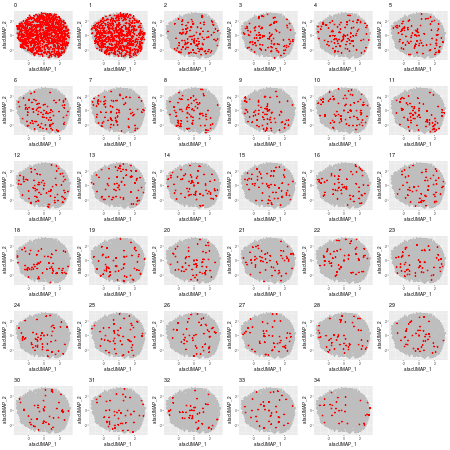

In [1207]:
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res=30)
datatoplot<-DN4_HSC_mitoTracing.AnnTable
ps<-list()
for(i in 0:34){
p<-ggplot(datatoplot)+aes(atacUMAP_1,atacUMAP_2)+geom_point(color="grey")+geom_point(aes(atacUMAP_1,atacUMAP_2),data=subset(datatoplot,clone_clusters==i),color="red")+ggtitle(i)
ps<-c(ps,list(p))
}  
  
grid.arrange(grobs=ps)

In [1208]:
# options(repr.plot.width=15, repr.plot.height=15,repr.plot.res=30)
# datatoplot<-merge(DN4_HSC_wnn_umap,DN4_HSC_clones,by="ATACName")
# ps<-list()
# for(i in 0:33){
# p<-ggplot(datatoplot)+aes(wnnUMAP_1	,wnnUMAP_2)+geom_point(color="grey")+geom_point(aes(wnnUMAP_1,wnnUMAP_2),data=subset(datatoplot,seurat_clusters==i),color="red")+ggtitle(i)
# ps<-c(ps,list(p))
# }    

# grid.arrange(grobs=ps)

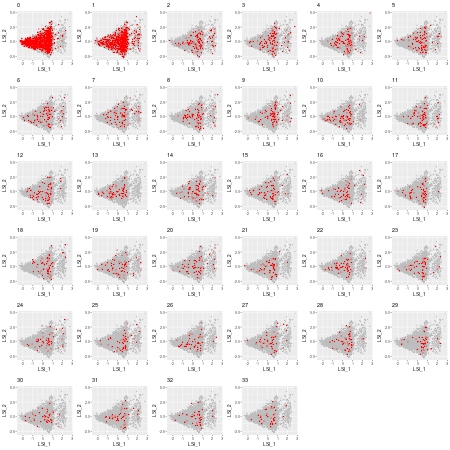

In [825]:
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res=30)
datatoplot<-DN4_HSC_mitoTracing.AnnTable
ps<-list()
for(i in 0:33){
p<-ggplot(datatoplot)+aes(LSI_1,LSI_2)+geom_point(color="grey",size=0.25)+geom_point(aes(LSI_1,LSI_2),data=subset(datatoplot,clone_clusters==i),color="red",size=0.25)+ggtitle(i)
ps<-c(ps,list(p))
}    

grid.arrange(grobs=ps)

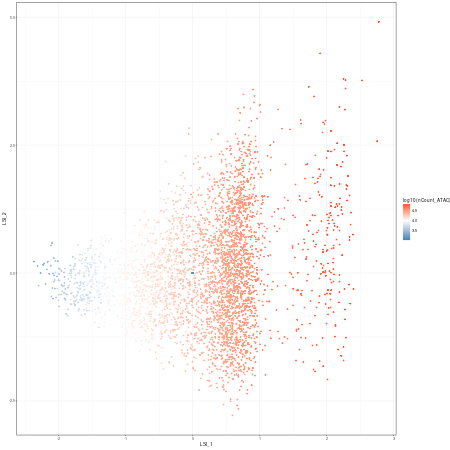

In [834]:
options(repr.plot.width=15, repr.plot.height=15,repr.plot.res=30)
ggplot(datatoplot)+aes(LSI_1,LSI_2,color=log10(nCount_ATAC))+geom_point()+scale_color_gradient2(high="red",low="steelblue",mid="white",midpoint=4)+theme_bw()

So the two key objects used are 
- DN4_HSC_mitoTracing.Sensitive
- Donor04_HSC_Multiome_wrapper

In [83]:
dim(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi) # 3924 cells against 5249 variants
colSums(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi) %>% .[.>10] %>% length  # 461 variants show in > 10 cells
colSums(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi) %>% .[.>5] %>% length   # 1760 variants show in > 5 cells

[1] 5767 3894

[1] 825

[1] 1981

## Prepare2- Reanalyze HSC ATAC data

### Make HSC only monoclonal fragment files

In [648]:
#DN4.monoclonal<-read.table("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs/atac_fragments.tsv.gz")

In [653]:
WD="/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs/Donor4Explor_ipynb"
write.table(as.data.frame(HSC.RNAname),paste(WD,"/DN4.HSCNames",sep=""),col.names = F, quote=F,row.names = F)

In [50]:
HSC_ATAC_Long.mtx<-read.table("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/Donor4/aggr/DN4_agg/outs/Donor4Explor_ipynb/HSC_Fragment.Peak.cts.LongMatrix")

In [51]:
names(HSC_ATAC_Long.mtx)<-c("Cell","Peak","Count")
# If binarize 
HSC_ATAC_Long.mtx$Count<-1

In [52]:
library(Matrix)
library(Matrix.utils)
HSC.PeakVSCell.Mtx<-dMcast(HSC_ATAC_Long.mtx,Peak~Cell)

##tm<-HSC.atac@meta.data %>% subset(.,nCount_ATAC>=4000) %>% row.names()
##HSC_ATAC_Long.mtx<-subset(HSC_ATAC_Long.mtx,!Cell %in% gsub("Cell","",tm))

In [53]:
HSC.atac<-ATAC_Wrapper(HSC.PeakVSCell.Mtx)

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

22:22:56 UMAP embedding parameters a = 0.9922 b = 1.112

22:22:56 Read 4111 rows and found 20 numeric columns

22:22:56 Using Annoy for neighbor search, n_neighbors = 30

22:22:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

22:22:57 Writing NN index file to temp file /tmp/RtmpBEkKwr/file7f00b847a6c

22:22:57 Searching Annoy index using 1 thread, search_k = 3000

22:22:58 Annoy recall = 100%

22:23:05 Commencing smooth kNN distance calibration using 1 thread

22:23:13 Initializing from normalized Laplacian + noise

22:23:13 Commencing optimization for 500 epochs, with 172552 positive edges

22:23:23 Optimi

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4111
Number of edges: 125128

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8092
Number of communities: 3
Elapsed time: 0 seconds


In [57]:
ATAC_Wrapper

function (MTX, res = 0.3, dim1 = 1, dim2 = 20) 
{
    require(Signac)
    Cell_Variant.seurat <- CreateSeuratObject(counts = MTX, assay = "ATAC")
    VariableFeatures(Cell_Variant.seurat) <- row.names(Cell_Variant.seurat)
    Cell_Variant.seurat <- RunTFIDF(Cell_Variant.seurat, n = 50)
    Cell_Variant.seurat <- FindTopFeatures(Cell_Variant.seurat, 
        min.cutoff = "q0")
    Cell_Variant.seurat <- RunSVD(Cell_Variant.seurat, n = 50)
    Cell_Variant.seurat <- RunUMAP(Cell_Variant.seurat, reduction = "lsi", 
        dims = dim1:dim2)
    Cell_Variant.seurat <- FindNeighbors(Cell_Variant.seurat, 
        reduction = "lsi", dims = dim1:dim2)
    Cell_Variant.seurat <- FindClusters(Cell_Variant.seurat, 
        resolution = res)
}
<bytecode: 0x55c93b6d34b0>
<environment: namespace:EZsinglecell2>

In [68]:
HSC.atac@graphs$ATAC_snn

   [[ suppressing 32 column names ‘CellAAACAGCCACAGGGAC-3’, ‘CellAAACAGCCACTAAATC-3’, ‘CellAAACAGCCAGGAAGCC-3’ ... ]]

   [[ suppressing 32 column names ‘CellAAACAGCCACAGGGAC-3’, ‘CellAAACAGCCACTAAATC-3’, ‘CellAAACAGCCAGGAAGCC-3’ ... ]]

   [[ suppressing 32 column names ‘CellAAACAGCCACAGGGAC-3’, ‘CellAAACAGCCACTAAATC-3’, ‘CellAAACAGCCAGGAAGCC-3’ ... ]]



4111 x 4111 sparse Matrix of class "Graph"
                                                                                        
CellAAACAGCCACAGGGAC-3 1.00000000 .          .          .          0.08108108 .         
CellAAACAGCCACTAAATC-3 .          1.00000000 .          .          .          .         
CellAAACAGCCAGGAAGCC-3 .          .          1.00000000 .          .          .         
CellAAACAGCCATAATTGC-3 .          .          .          1.00000000 .          .         
CellAAACATGCAAGCCAGA-3 0.08108108 .          .          .          1.00000000 .         
CellAAACATGCAGTAGCCT-3 .          .          .          .          .          1.00000000
CellAAACATGCAGTAGGTG-3 .          .          .          .          .          .         
CellAAACATGCATATAACC-3 .          .          .          0.08108108 .          .         
CellAAACCAACACGTAAGG-3 .          .          .          .          .          .         
CellAAACCAACACTAAATC-2 .          .          .          .          

In [64]:
dim(HSC.atac@graphs$ATAC_nn)

[1] 4111 4111

In [911]:
HSC.atac <- CreateSeuratObject(counts = HSC.PeakVSCell.Mtx, assay = "ATAC")
#    HSC.atac(Cell_Variant.seurat) <- row.names(Cell_Variant.seurat)
HSC.atac <- RunTFIDF(HSC.atac, n = 50,method=3)
HSC.atac <- FindTopFeatures(HSC.atac,min.cutoff = "q0")
HSC.atac<- RunSVD(HSC.atac, n = 50)
HSC.atac<- RunUMAP(HSC.atac, reduction = "lsi", dims = 2:30)
HSC.atac <- FindNeighbors(HSC.atac, reduction = "lsi", dims = 2:30)
HSC.atac <- FindClusters(HSC.atac, resolution = 0.6)


Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Performing TF-IDF normalization

Running SVD

Scaling cell embeddings

20:34:37 UMAP embedding parameters a = 0.9922 b = 1.112

20:34:37 Read 4111 rows and found 29 numeric columns

20:34:37 Using Annoy for neighbor search, n_neighbors = 30

20:34:37 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

20:34:38 Writing NN index file to temp file /tmp/RtmpAxQVOQ/file73b477fbf1f9

20:34:38 Searching Annoy index using 1 thread, search_k = 3000

20:34:39 Annoy recall = 100%

20:34:46 Commencing smooth kNN distance calibration using 1 thread

20:34:56 Initializing from normalized Laplacian + noise

20:34:56 Commencing optimization for 500 epochs, with 132306 positive edges

20:35:05 Optim

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4111
Number of edges: 193282

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.4466
Number of communities: 3
Elapsed time: 0 seconds


1 singletons identified. 2 final clusters.



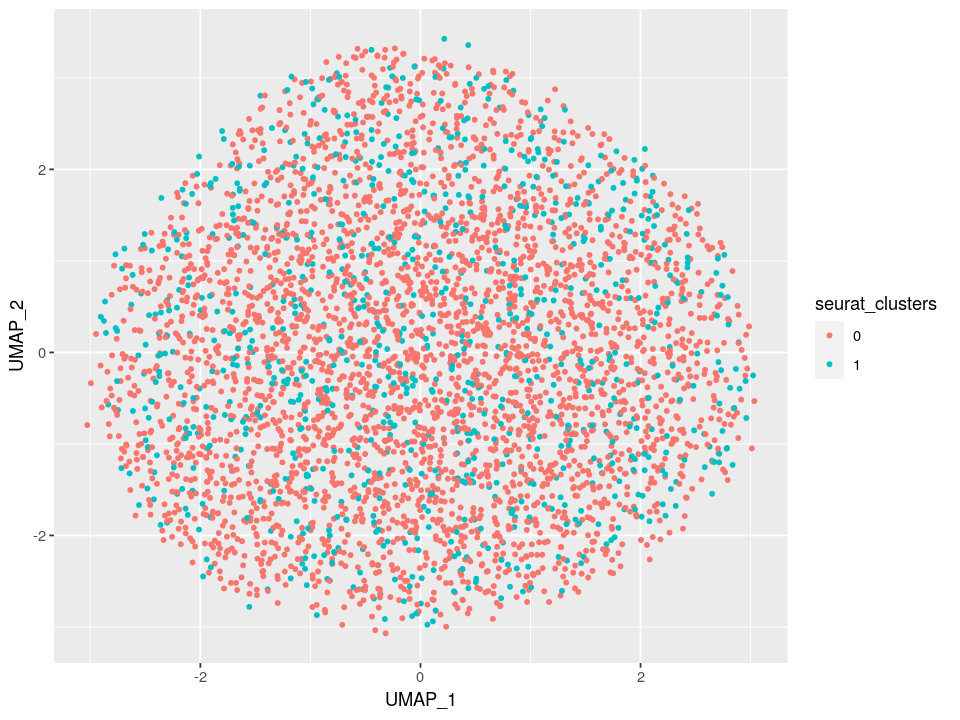

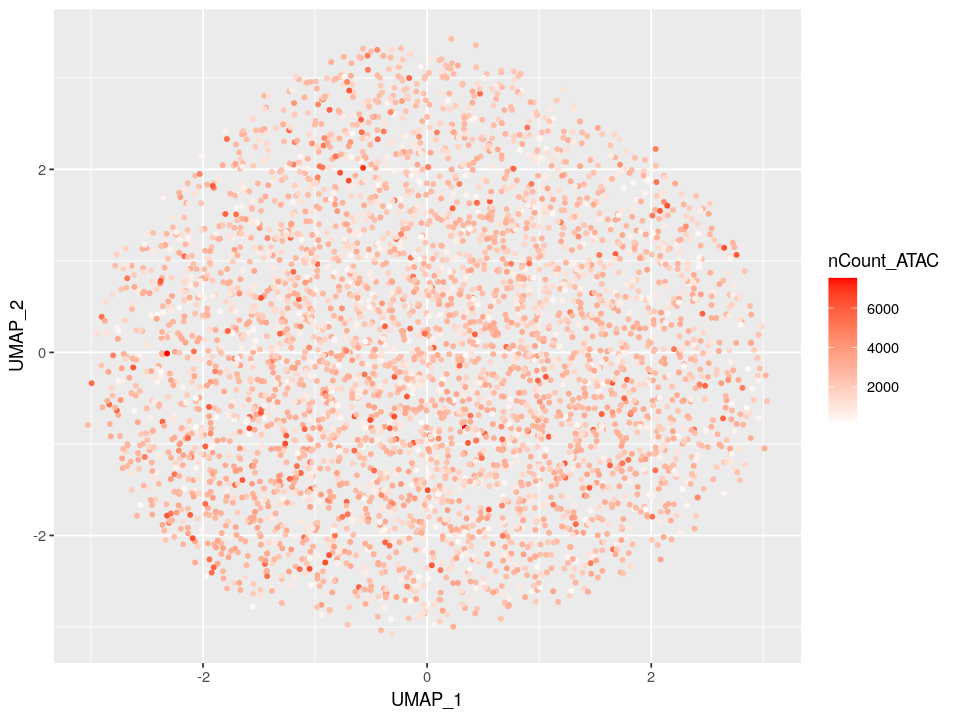

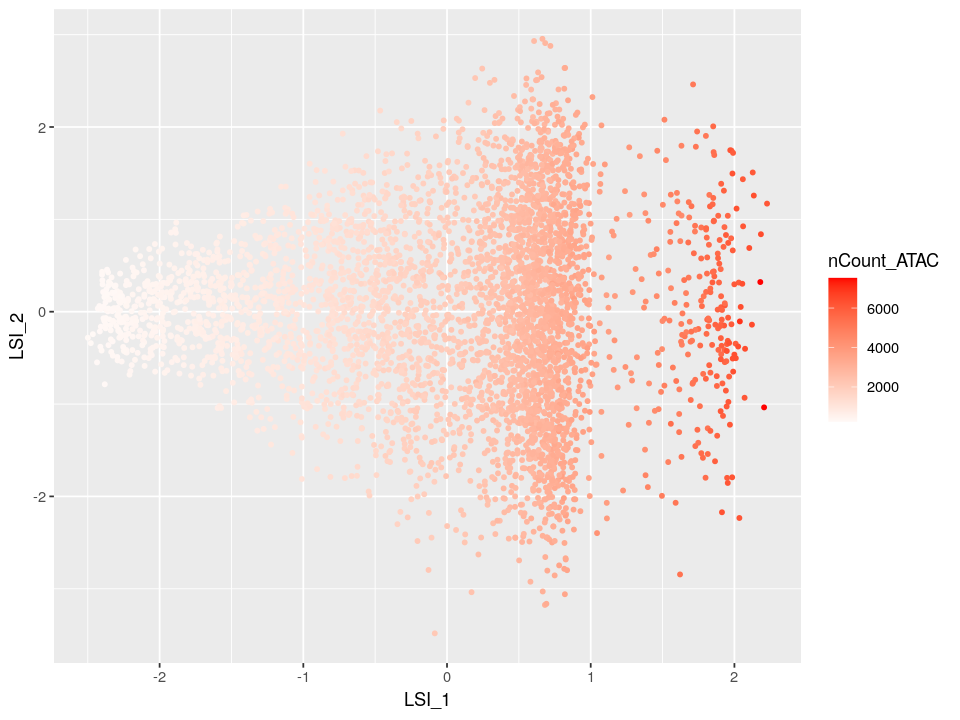

,orig.ident,nCount_ATAC,nFeature_ATAC,ATAC_snn_res.0.6,seurat_clusters
,<fct>,<dbl>,<int>,<fct>,<fct>
CellAAACAGCCACAGGGAC-3,SeuratProject,2822,2822,0,0
CellAAACAGCCACTAAATC-3,SeuratProject,2584,2584,0,0
CellAAACAGCCAGGAAGCC-3,SeuratProject,2174,2174,0,0
CellAAACAGCCATAATTGC-3,SeuratProject,2216,2216,0,0
CellAAACATGCAAGCCAGA-3,SeuratProject,3240,3240,0,0
CellAAACATGCAGTAGCCT-3,SeuratProject,3109,3109,0,0


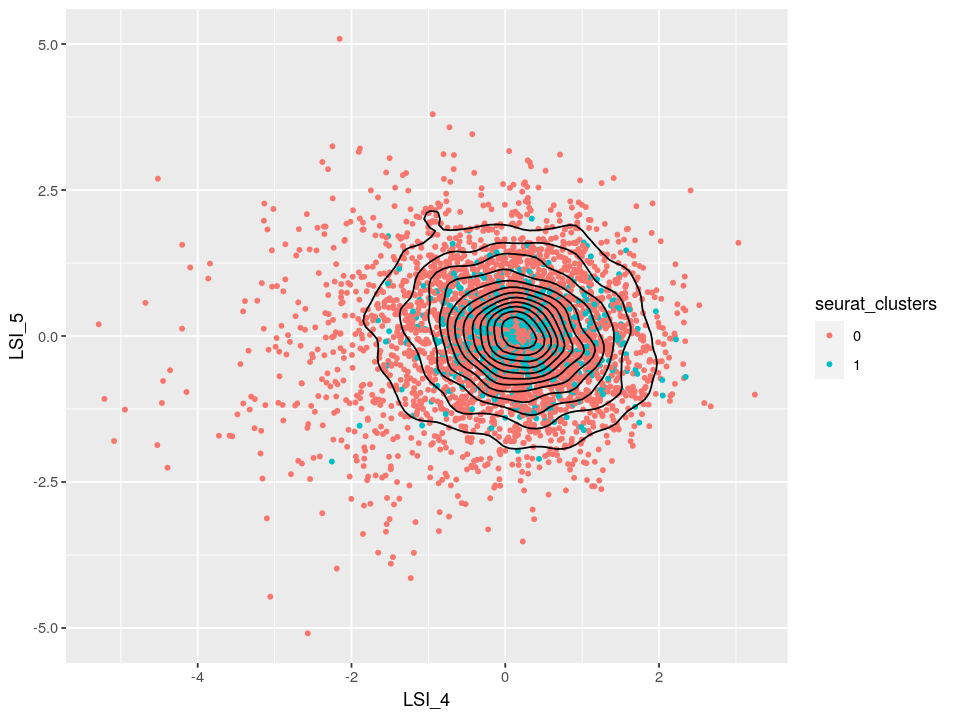

In [930]:
options(repr.plot.width=8, repr.plot.height=6,repr.plot.res=120)
HSC.atac@reductions$umap@cell.embeddings %>% Tomerge_v2(.,HSC.atac@meta.data) %>% ggplot()+aes(UMAP_1,UMAP_2,color=seurat_clusters)+geom_point(size=1) 
HSC.atac@reductions$umap@cell.embeddings %>% Tomerge_v2(.,HSC.atac@meta.data) %>% ggplot()+aes(UMAP_1,UMAP_2,color=nCount_ATAC)+geom_point(size=1)+scale_color_gradient2(low="steelblue",high="red",mid="white") 
HSC.atac@reductions$lsi@cell.embeddings %>% Tomerge_v2(.,HSC.atac@meta.data) %>% ggplot()+aes(LSI_1,LSI_2,color=nCount_ATAC)+geom_point(size=1) +scale_color_gradient2(low="steelblue",high="red",mid="white")
HSC.atac@reductions$lsi@cell.embeddings %>% Tomerge_v2(.,HSC.atac@meta.data) %>% ggplot()+aes(LSI_4,LSI_5,color=seurat_clusters)+geom_point(size=1)+geom_density_2d(color="black")

head(HSC.atac@meta.data)

In [921]:
DN4.HSC.reclu.meta<-data.frame(New.ATAC.cluster=HSC.atac@meta.data$seurat_clusters,row.names=gsub("Cell","",row.names(HSC.atac@meta.data)),nCount_ATAC=HSC.atac@meta.data$nCount_ATAC,nFeature_ATAC=HSC.atac@meta.data$nFeature_ATAC)

In [922]:
datatoplot<-Tomerge_v2(Donor04_HSC_Multiome_wrapper@meta.data,Donor04_HSC_Multiome_wrapper@reductions$umap.rna@cell.embeddings)  %>% Tomerge_v2(.,DN4.HSC.reclu.meta)
# %>% 
#         ggplot()+aes(rnaUMAP_1,rnaUMAP_2,color=New.ATAC.cluster)+geom_point()

In [923]:
head(datatoplot)

,orig.ident,nCount_RNA,nFeature_RNA,nCount_ATAC.x,nFeature_ATAC.x,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters,rnaUMAP_1,rnaUMAP_2,New.ATAC.cluster,nCount_ATAC.y,nFeature_ATAC.y
,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<dbl>,<dbl>,<fct>,<dbl>,<int>
AAACAGCCACAGGGAC-3,SeuratProject,5084,2212,11276,5270,4747,2210,0.5000000,0.5000000,0,0,0.5848644,-1.3494128,0,2822,2822
AAACAGCCACTAAATC-3,SeuratProject,6689,2656,10281,4877,5022,2621,0.5464850,0.4535150,4,4,-0.2752454,3.4012786,0,2584,2584
AAACAGCCAGGAAGCC-3,SeuratProject,3845,1917,8644,4136,4010,1916,0.5367165,0.4632835,0,0,-1.2115154,-1.3539914,0,2174,2174
AAACAGCCATAATTGC-3,SeuratProject,4344,2106,8766,4238,4342,2104,0.5000000,0.5000000,3,3,-0.3743734,0.7391721,0,2216,2216
AAACATGCAAGCCAGA-3,SeuratProject,5528,2200,13175,6169,4871,2195,0.6728900,0.3271100,2,2,2.1446326,2.8252641,0,3240,3240
AAACATGCAGTAGCCT-3,SeuratProject,5318,2302,12523,5911,4827,2298,0.5734611,0.4265389,3,3,-2.2619219,1.1540166,0,3109,3109


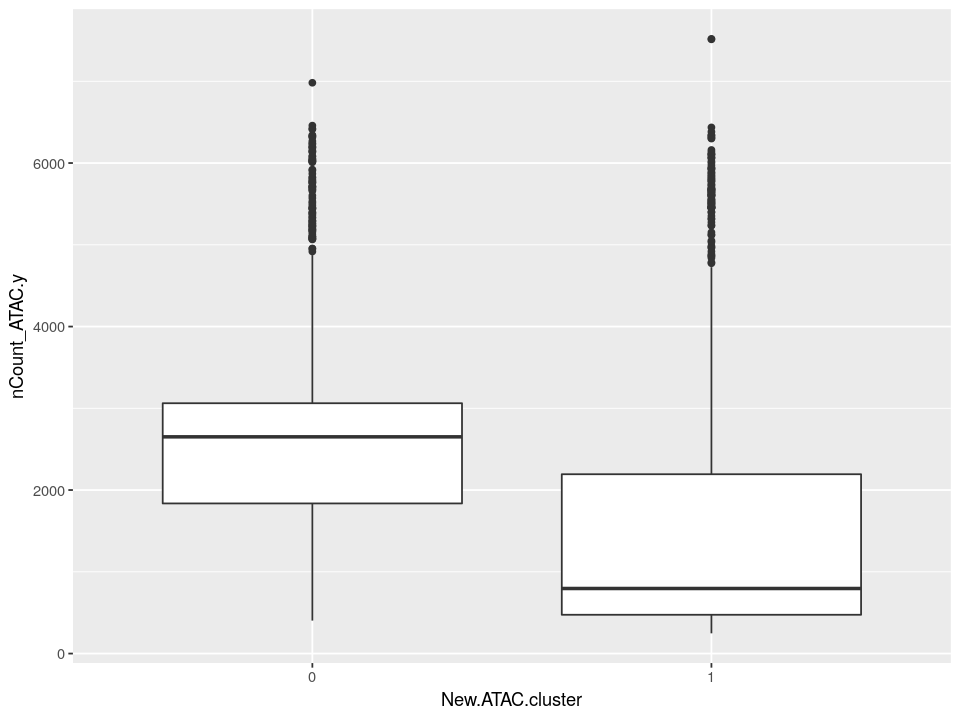

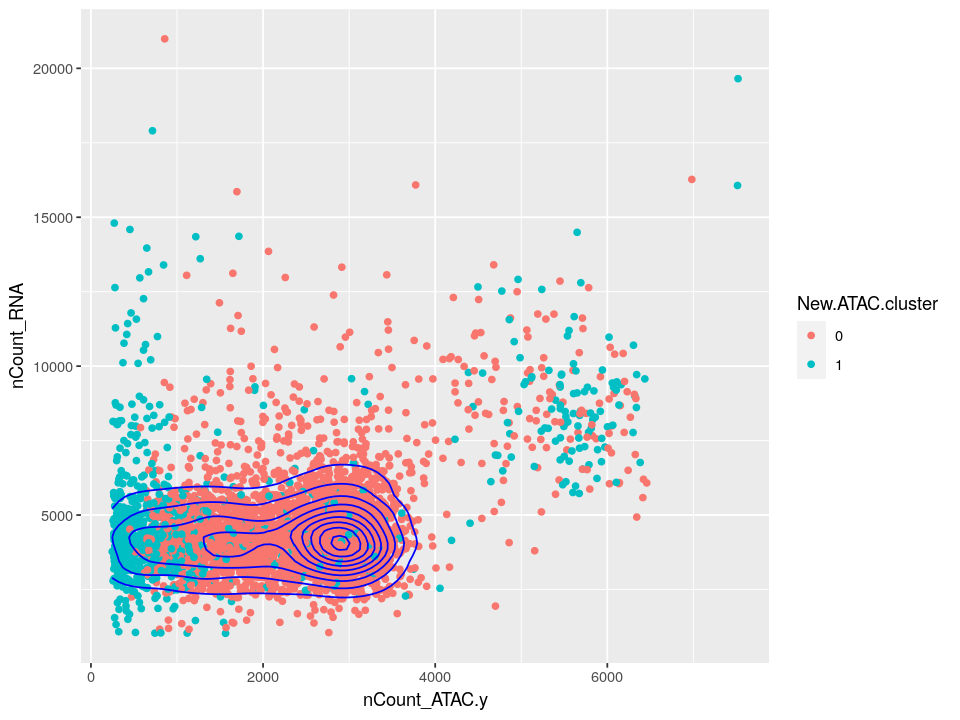

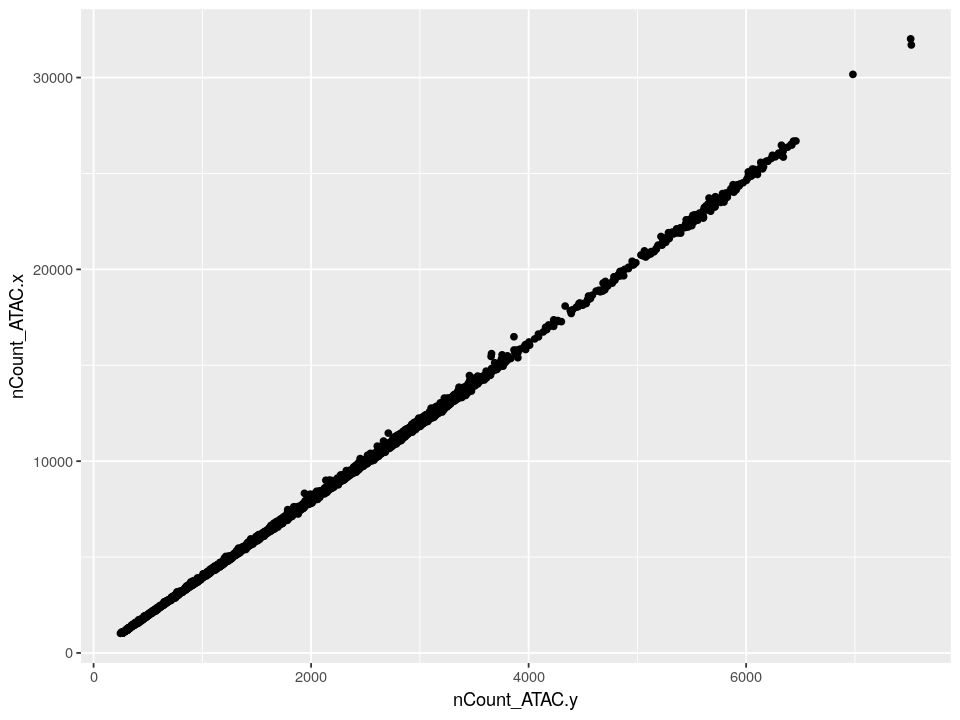

In [924]:
ggplot(datatoplot)+aes(New.ATAC.cluster,nCount_ATAC.y)+geom_boxplot()
ggplot(datatoplot)+aes(nCount_ATAC.y,nCount_RNA,color=New.ATAC.cluster)+geom_point()+geom_density_2d(color="blue")
ggplot(datatoplot)+aes(nCount_ATAC.y,nCount_ATAC.x)+geom_point()

In [899]:
DN4_HSC_ATAC.markers <- FindAllMarkers(HSC.atac, only.pos = TRUE, min.pct = 0.01, logfc.threshold = 1)

Calculating cluster 0

Calculating cluster 1



In [793]:
subset(DN4_HSC_ATAC.markers,cluster==0)  %>% head

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
chr15-41402059-41403038,3.143796e-14,1.094186,0.057,0.010,2.993114e-09,0,chr15-41402059-41403038
chr11-76768094-76769091,1.510297e-12,1.013182,0.053,0.010,1.437909e-07,0,chr11-76768094-76769091
chr6-108592525-108592919,7.480053e-12,1.159709,0.045,0.007,7.121534e-07,0,chr6-108592525-108592919
chr6-42547325-42548264,1.048817e-11,1.011004,0.048,0.009,9.985475e-07,0,chr6-42547325-42548264
chr1-167650143-167650819,1.253291e-11,1.160662,0.040,0.006,1.193220e-06,0,chr1-167650143-167650819
chr21-37207691-37208524,2.780799e-11,1.000943,0.044,0.008,2.647516e-06,0,chr21-37207691-37208524


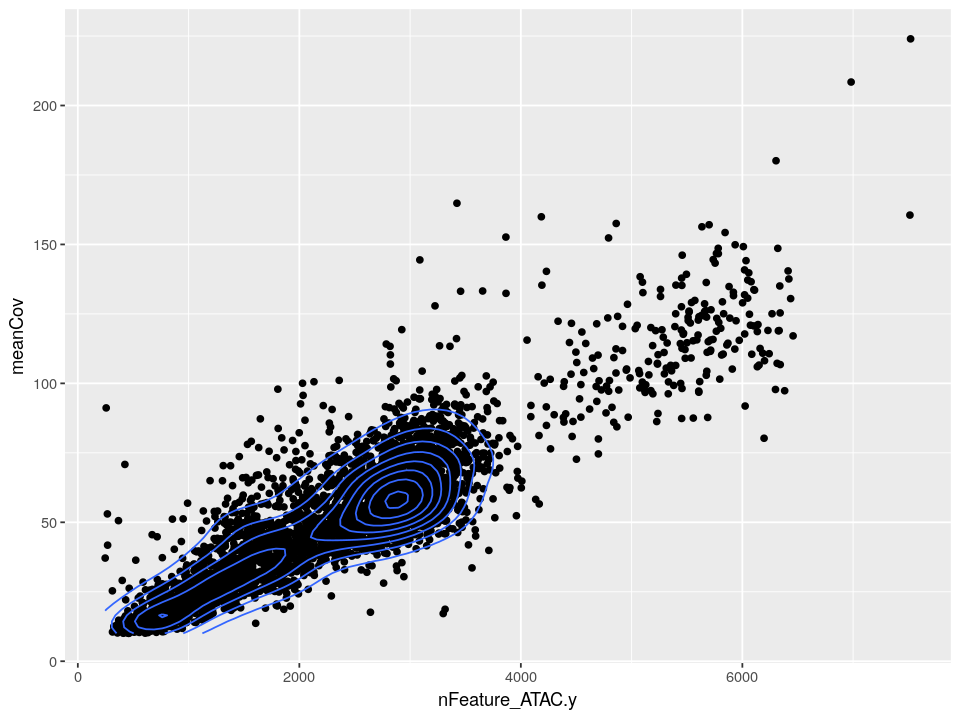

In [900]:
# To check the mito counts for these HSCs
datatoplot.tr<-Translate_RNA2ATAC(datatoplot,from=c(2,3),to=c(2,1))
merge(datatoplot.tr,DN4_SLCT_HSC_mitoTracing.Sensitive@CellMeta[,c("Cell","meanCov")],by.x="ATACName",by.y="Cell") %>% ggplot()+aes(nFeature_ATAC.y,meanCov)+geom_point()+geom_density_2d()

## Annotate the tree

- Stem cell clones 
- Mito mutations
- Stemness signature
- Cell cycles score
---
Use the LSI tree to set it up

### plot stem cell clone 

In [124]:
DN4_SLCT_HSC_mitoTracing.Sensitive

                                   Threhold 
                                "Sensitive" 
                           qualifiedCellCut 
                                       "10" 
                                 OnlyHetero 
                                     "TRUE" 
                                     VAFcut 
                                        "1" 
                                    Cellcut 
                                        "2" 
                                  maxctscut 
                                        "2" 
                                      Extra 
"Subset from HSC_HPC_mitoTracing.sensitive" 
[1] "Total Cell number: 3991"

 HPC  HSC 
 570 3421 
[1] "Total Variant number: 5249"
 [1] "Slot: GTsummary.filtered" "Slot: CellMeta"          
 [3] "Slot: V.fitered.list"     "Slot: UniqueV"           
 [5] "Slot: Cts.Mtx"            "Slot: Cts.Mtx.bi"        
 [7] "Slot: Ctx.Mtx.depth"      "Slot: para"              
 [9] "Slot: Seurat"             "Slot: DataToplo

In [513]:
## Create a Annotable to show clone ID, default is LSI clones
Annotable<-DN4_SLCT_HSC_mitoTracing.Sensitive@Seurat@meta.data %>% tibble::rownames_to_column("Cell")
row.names(Annotable)<-Annotable$Cell
unique(Annotable$seurat_clusters) %>% length
Annotable$Fakew<-10
## Add jaccard cluster res2 
colnames(jaccard_cluster_2)<-"wjaccard.res2"
Annotable<-Tomerge_v2(Annotable,jaccard_cluster_2) %>% Tomerge_v2(.,jaccard_cluster_3)
head(Annotable,n=3)

[1] 35

,Cell,orig.ident,nCount_mitoV,nFeature_mitoV,mitoV_snn_res.0.6,seurat_clusters,Fakew,wjaccard.res2,res.3
,<chr>,<fct>,<dbl>,<int>,<fct>,<fct>,<dbl>,<fct>,<fct>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,SeuratProject,16,16,5,5,10,28,29
AAACAAGCACCTCGAC_2,AAACAAGCACCTCGAC_2,SeuratProject,12,12,1,1,10,0,5
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,SeuratProject,12,12,9,9,10,32,45


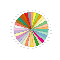

In [514]:
# Prepare color library(cols4all)  c4a("muted", 11)
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=6)
library(RColorBrewer)
n <- 35
qual_col_pals = brewer.pal.info[brewer.pal.info$category == 'qual',]
col_vector = unlist(mapply(brewer.pal, qual_col_pals$maxcolors, rownames(qual_col_pals)))
pie(rep(1,n), col=sample(col_vector, n))

Warning message:
“Ignoring unknown parameters: orientation”


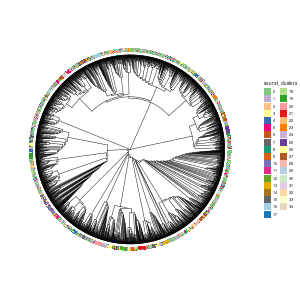

In [402]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=30)
p<-ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata, layout="circular", branch.length='none')
p+ geom_fruit(
         data=Annotable,
         geom=geom_tile,
         mapping=aes(y=Cell,x=2,fill=seurat_clusters),
         pwidth=0.001,
         width=3,
         offset=0.05,
         orientation="y"
     )+scale_fill_manual(values=col_vector)


In [433]:
table(Annotable$seurat_clusters)
table(Annotable$wjaccard.res2)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1062  721  119  103  100   95   88   82   80   79   77   75   75   68   66   61 
  16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31 
  60   60   59   59   58   57   57   56   53   52   49   49   49   46   46   46 
  32   33   34 
  42   40   31 


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1053  242  198  197  162  154  145  140  116  109  106  104   99   95   90   89 
  16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31 
  73   71   61   61   54   53   52   51   46   45   44   43   38   35   32   30 
  32   33   34 
  19   10    3 

In [439]:
Annotable.x_3<-Annotable %>% mutate(s=ifelse(wjaccard.res2==3,"3",""))
Annotable.x_33<-Annotable %>% mutate(s=ifelse(seurat_clusters==33,"33",""))

Warning message:
“Ignoring unknown parameters: orientation”


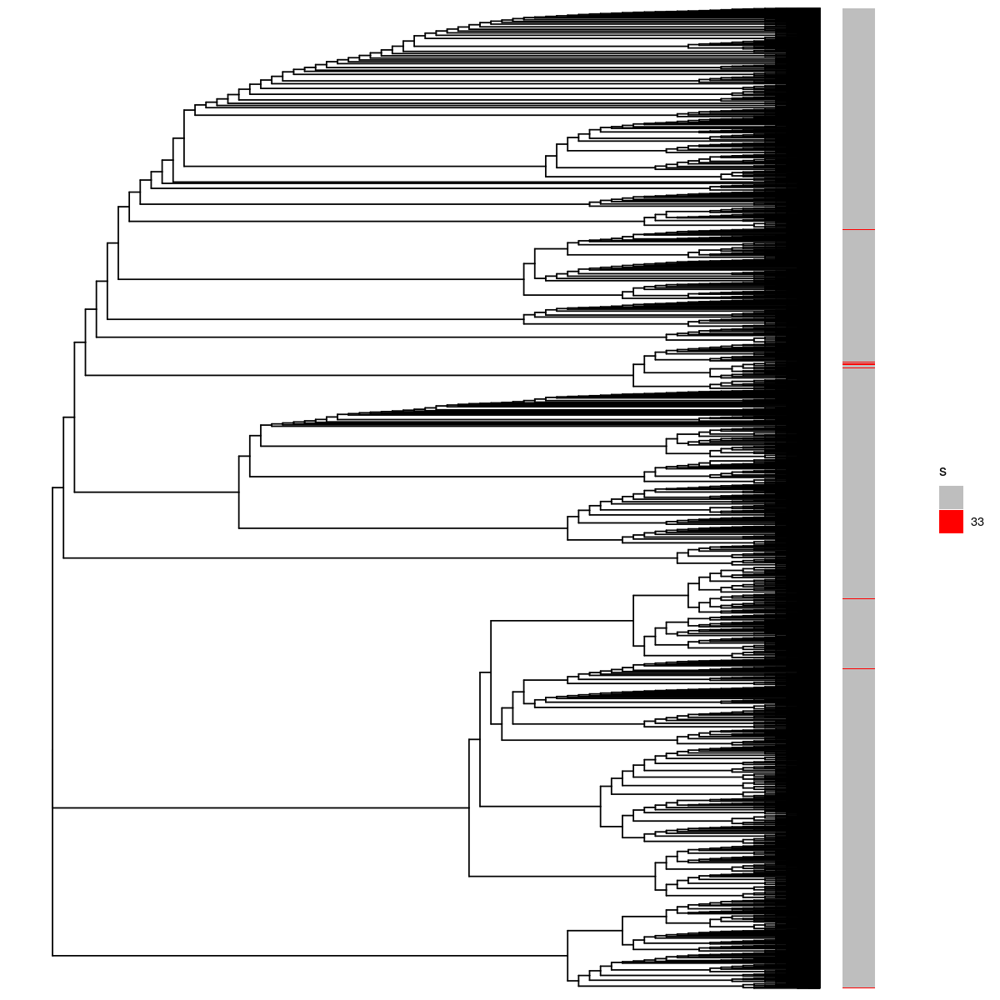

In [441]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=120)
p<-ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata, branch.length='none') #layout="circular",
p+ geom_fruit(
         data=Annotable.x_33,
         geom=geom_tile,
         mapping=aes(y=Cell,x=2,fill=s),
         pwidth=0.001,
         width=3,
         offset=0.05,
         orientation="y"
     )+scale_fill_manual(values=c("grey","red"))



In [332]:
colnames(jaccard_cluster_2)<-"wjaccard.res2"
Annotable<-Tomerge_v2(Annotable,jaccard_cluster_2)
#head(jaccard_cluster_2)

In [334]:
table(Annotable$wjaccard.res2)


   0    1    2    3    4    5    6    7    8    9   10   11   12   13   14   15 
1053  242  198  197  162  154  145  140  116  109  106  104   99   95   90   89 
  16   17   18   19   20   21   22   23   24   25   26   27   28   29   30   31 
  73   71   61   61   54   53   52   51   46   45   44   43   38   35   32   30 
  32   33   34 
  19   10    3 

In [553]:
## Refer back to 16.4Clone Partitioning
jaccard_cluster_2

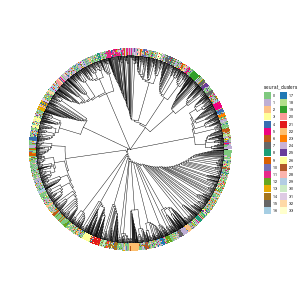

In [555]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=30)
p2+ geom_fruit(
         geom=geom_tile,
         mapping=aes(fill=seurat_clusters),
         pwidth=0.005,
         width=5,
         offset=0
     )+scale_fill_manual(values=col_vector)

- identify top mito V and visulize them on clonal map and the tree

In [709]:
DN4_HSC_Variant.markers <- FindAllMarkers(DN4_HSC_mitoTracing.Sensitive@Seurat, only.pos = TRUE, min.pct = 0.0001, logfc.threshold = 0.25)
DN4_HSC_Variant.markers %>% group_by(cluster) %>% subset(.,p_val_adj<0.05) %>% top_n(n = -1, wt = p_val_adj)-> top1

Calculating cluster 0

For a more efficient implementation of the Wilcoxon Rank Sum Test,
(default method for FindMarkers) please install the limma package
--------------------------------------------
install.packages('BiocManager')
BiocManager::install('limma')
--------------------------------------------
After installation of limma, Seurat will automatically use the more 
efficient implementation (no further action necessary).
This message will be shown once per session

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Cal

In [865]:
DN4_HSC_Variant.markers %>% group_by(cluster) %>% subset(.,p_val_adj<0.05) %>% top_n(n = -1, wt = p_val_adj)-> top1

In [793]:
# VShow<-subset(DN4_HSC_Variant.markers,cluster %in% c(22,23,24))$gene[1:5]

In [868]:
VShow<-subset(top1,cluster %in% 2:33)$gene

In [869]:
VShow<-unique(VShow)
length(VShow)

[1] 40

In [870]:
head(Annotable)

,Cell,orig.ident,nCount_mitoV,nFeature_mitoV,mitoV_snn_res.0.6,seurat_clusters
,<chr>,<fct>,<dbl>,<int>,<fct>,<fct>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,SeuratProject,15,15,4,4
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,SeuratProject,11,11,9,9
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,SeuratProject,4,4,27,27
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,SeuratProject,2,2,14,14
AAACCGGTCACTAAGA_1,AAACCGGTCACTAAGA_1,SeuratProject,8,8,1,1
AAACCGGTCATAGCTT_1,AAACCGGTCATAGCTT_1,SeuratProject,5,5,12,12


In [871]:
Annotable2<-as.matrix(DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi[,VShow]) %>% melt()
Annotable2$value<-as.factor(Annotable2$value)
Annotable2$Var1<-as.character(Annotable2$Var1)
head(Annotable2)

,Var1,Var2,value
,<chr>,<fct>,<fct>
1,AAACAAGCACATTGTC_1,Variants6763TC,0
2,AAACCAGGTTAGCCAT_1,Variants6763TC,0
3,AAACCGCCAAGTCCTT_1,Variants6763TC,0
4,AAACCGCCAATAGCAT_1,Variants6763TC,0
5,AAACCGGTCACTAAGA_1,Variants6763TC,0
6,AAACCGGTCATAGCTT_1,Variants6763TC,0


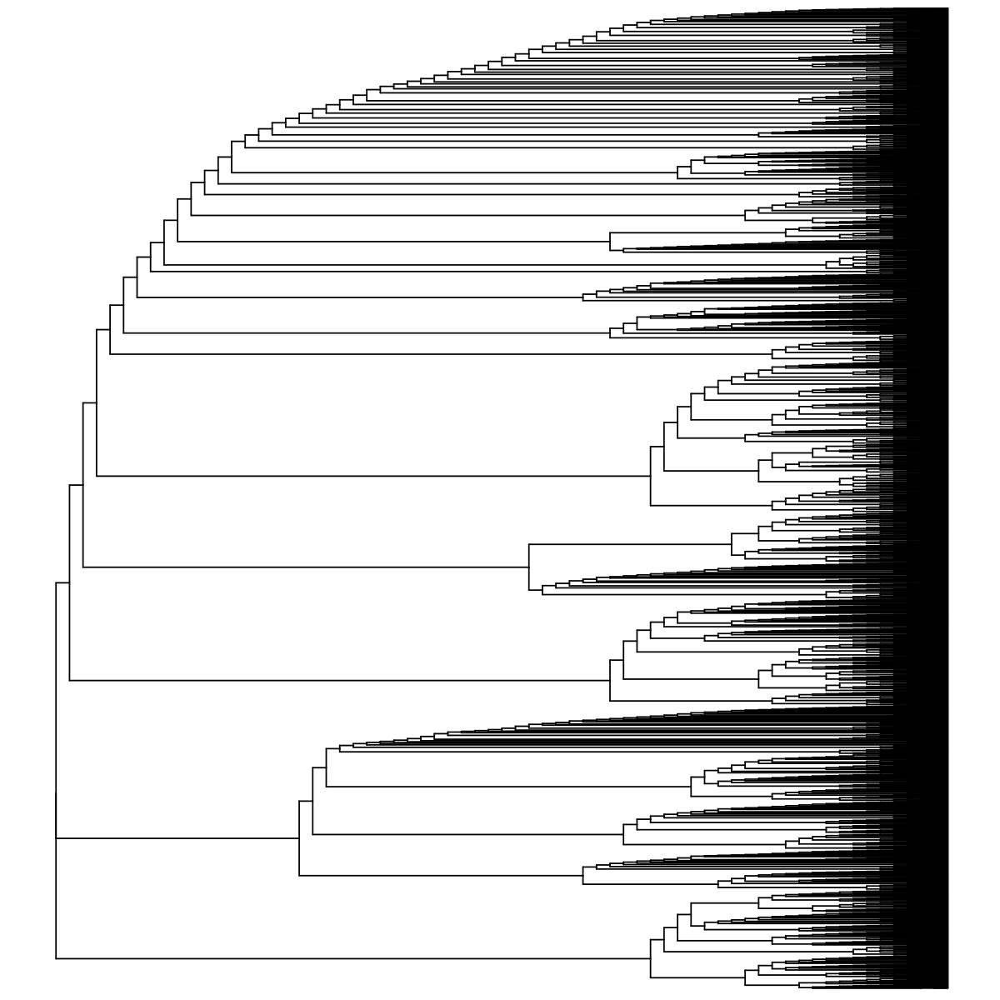

In [884]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=120)
p3<-ggtree(DN4_HSC_w_jaccard.njtree@treedata,branch.length='none') #layout="circular"
#p3<-ggtree(DN4_HSC_LSI.njtree@treedata, branch.length='none')
# p3 <- p3 %<+% Annotable2
p3

### Plot variants

#### clone group based find marker (Use Jaccard-based clonal variants to annotate tree)

In [1391]:
#DN4_HSC_mitoTracing.Sensitive@Seurat@active.ident
Ident<-jaccard_cluster[,1]
names(Ident)<-row.names(jaccard_cluster)
DN4_HSC_mitoTracing.Sensitive@Seurat@active.ident<-Ident
DN4_HSC_Variant.markers.w_jaccard_3 <- FindAllMarkers(DN4_HSC_mitoTracing.Sensitive@Seurat, only.pos = TRUE, min.pct = 0.0001, logfc.threshold = 0.1)

Calculating cluster 0

Calculating cluster 1

Calculating cluster 10

Calculating cluster 11

Calculating cluster 12

Calculating cluster 13

Calculating cluster 14

Calculating cluster 15

Calculating cluster 16

Calculating cluster 17

Calculating cluster 18

Calculating cluster 19

Calculating cluster 2

Calculating cluster 20

Calculating cluster 21

Calculating cluster 22

Calculating cluster 23

Calculating cluster 24

Calculating cluster 25

Calculating cluster 26

Calculating cluster 27

Calculating cluster 28

Calculating cluster 29

Calculating cluster 3

Calculating cluster 30

Calculating cluster 31

Calculating cluster 32

Calculating cluster 33

Calculating cluster 34

Calculating cluster 35

Calculating cluster 36

Calculating cluster 37

Calculating cluster 38

Calculating cluster 39

Calculating cluster 4

Calculating cluster 40

Calculating cluster 41

Calculating cluster 42

Calculating cluster 43

Calculating cluster 44

Calculating cluster 45

Calculating cluster 4

In [1337]:
table(Ident)
subset(DN4_HSC_Variant.markers.w_jaccard_0.6,cluster==3)

Ident
   0    1    2    3    4    5    6    7    8    9   10   11   12 
2312  416  248  156  100   97   90   87   86   72   50   33   26 

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Variants6425TC,0.000000e+00,6.645478,0.724,0.010,0.000000e+00,3,Variants6425TC
Variants3586CG,1.662643e-88,7.003203,0.128,0.001,8.722226e-85,3,Variants3586CG
Variants866AC,5.693880e-88,5.643552,0.160,0.003,2.987010e-84,3,Variants866AC
Variants865AC,2.580801e-76,6.706113,0.122,0.002,1.353888e-72,3,Variants865AC
Variants3587CG,3.210333e-67,5.236156,0.128,0.003,1.684141e-63,3,Variants3587CG
Variants3427GT,3.655081e-13,5.720215,0.019,0.000,1.917455e-09,3,Variants3427GT
Variants14424AC,3.690566e-13,5.606091,0.019,0.000,1.936071e-09,3,Variants14424AC
Variants8384AG,3.690566e-13,5.425947,0.019,0.000,1.936071e-09,3,Variants8384AG
Variants11500AT,3.740708e-12,15.786971,0.013,0.000,1.962376e-08,3,Variants11500AT


In [1341]:
head(DN4_HSC_Variant.markers.w_jaccard_0.6)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Variants9181AG,2.542478e-49,5.084023,0.094,0.004,1.333784e-45,0,Variants9181AG
Variants13175TC,4.238897e-37,4.182825,0.097,0.008,2.223726e-33,0,Variants13175TC
Variants11390GT,1.979500e-35,4.383301,0.094,0.008,1.038446e-31,0,Variants11390GT
Variants16129GA,5.367622e-21,3.939938,0.053,0.004,2.815854e-17,0,Variants16129GA
Variants7896GA,6.010243e-20,4.394105,0.047,0.003,3.152974e-16,0,Variants7896GA
Variants4057TC,2.587789e-17,3.419732,0.056,0.006,1.357554e-13,0,Variants4057TC


In [1412]:
DN4_HSC_Variant.markers.w_jaccard_3 %>% group_by(cluster) %>% subset(.,p_val_adj<0.01) %>% top_n(n = -1, wt = p_val_adj)-> top1

In [1416]:
length(unique(top1$gene))
Vshow<-DN4_HSC_mitoTracing.Sensitive@Cts.Mtx.bi[,unique(top1$gene)] %>% colSums %>% .[.>20] %>% names
Ann.tb1<- Make_AnnTable(DN4_HSC_mitoTracing.Sensitive,Donor04_HSC_Multiome_wrapper,PostTrans_from=c(2,3),PostTrans_to=c(2,1),ATACUMAP = F,RNAUMAP = F,WNNUMAP = F,
              Variants =Vshow)
Ann.tb1<-Ann.tb1[,c(1,13:ncol(Ann.tb1))] %>% melt
Ann.tb1$value<-as.factor(Ann.tb1$value)

[1] 82

[1] "3991 Cells in MitoTracing object, 4107 Cells in Multiome_wrapper object --- 3893 Cells matched"


Using Cell as id variables



In [1456]:
Ann.tb2<- Make_AnnTable(DN4_HSC_mitoTracing.Sensitive,Donor04_HSC_Multiome_wrapper,PostTrans_from=c(2,3),PostTrans_to=c(2,1),ATACUMAP = F,RNAUMAP = F,WNNUMAP = F,genes =c("HLF","CD34"))

[1] "3991 Cells in MitoTracing object, 4107 Cells in Multiome_wrapper object --- 3893 Cells matched"


In [1457]:
head(Ann.tb2)

,Cell,cloUMAP_1,cloUMAP_2,nCount_mitoV,clone_clusters,Mito_meanCov,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,CellType,NewSeurat_cluster,HLF,CD34
,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<int>,<dbl>,<int>,<fct>,<fct>,<dbl>,<dbl>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,0.03761411,3.3218628,16,5,74.74682,2664,1373,35552,14086,HSC,0,0.0000000,1.0986123
AAACAAGCACCTCGAC_2,AAACAAGCACCTCGAC_2,-0.20128321,-3.7101916,12,1,47.40672,3555,2016,18492,8735,HSC,1,0.6931472,0.6931472
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,-1.73601794,0.3838269,12,9,63.90531,5366,2202,29607,12383,HSC,2,0.0000000,0.0000000
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,-3.89532661,1.7983428,4,28,15.61856,5037,2129,8805,4279,HSC,3,0.0000000,1.0986123
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,-16.30106807,-7.3559292,2,14,63.88509,3855,1803,24233,10397,HSC,0,1.6094379,0.0000000
AAACCGCCACCATGCC_1,AAACCGCCACCATGCC_1,6.43974042,2.0113393,2,0,25.48518,10853,3816,14235,6458,HSC,1,0.0000000,0.0000000


In [84]:
Ann.tb2 %>% group_by(clone_clusters) %>% dplyr::summarise(mHLF=mean(HLF)) %>% .[order(.$mHLF),] %>% head(.,n=3)

ERROR: Error in h(simpleError(msg, call)): error in evaluating the argument 'x' in selecting a method for function 'head': object 'Ann.tb2' not found


In [1442]:
DN4_HSC_C0_LSI.njtree<-Make_tree(DN4_HSC_C0_mitoTracing.Sensitive,d = "LSIdist",algorithm = "nj",onlyreturntree = T)
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=20)
p1<-ggtree(DN4_HSC_LSI.njtree@treedata,layout="circular", branch.length='none') 

DN4_HSC_C0_w_jaccard.njtree<-Make_tree(DN4_HSC_C0_mitoTracing.Sensitive,d = "w_jaccard",algorithm = "nj",onlyreturntree = T)
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=20)
p2<-ggtree(DN4_HSC_w_jaccard.njtree@treedata,layout="circular", branch.length='none') #layout="circular",

DN4_HSC_C0_w_cosine.njtree<-Make_tree(DN4_HSC_C0_mitoTracing.Sensitive,d = "w_cosine",algorithm = "nj",onlyreturntree = T)
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=20)
p3<-ggtree(DN4_HSC_w_cosine.njtree@treedata, layout="circular",branch.length='none') #layout="circular",

In [1474]:
require(ggtreeExtra)
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=120)
p2<-ggtree(DN4_HSC_w_jaccard.njtree@treedata, branch.length='none') #layout="circular",
p2+ geom_fruit(data=Ann.tb2,mapping=aes(y=Cell,
                           x=HLF,
                           fill=HLF),orientation = 'y', width = 1, stat='identity',fill="darkgreen",geom=geom_bar)+#+scale_fill_manual(values=c("steelblue","darkred"))
new_scale_fill() +
geom_fruit(data=Ann.tb2,mapping=aes(fill=clone_clusters),orientation = 'y',geom=tile)

ERROR: Error in new_scale_fill(): could not find function "new_scale_fill"


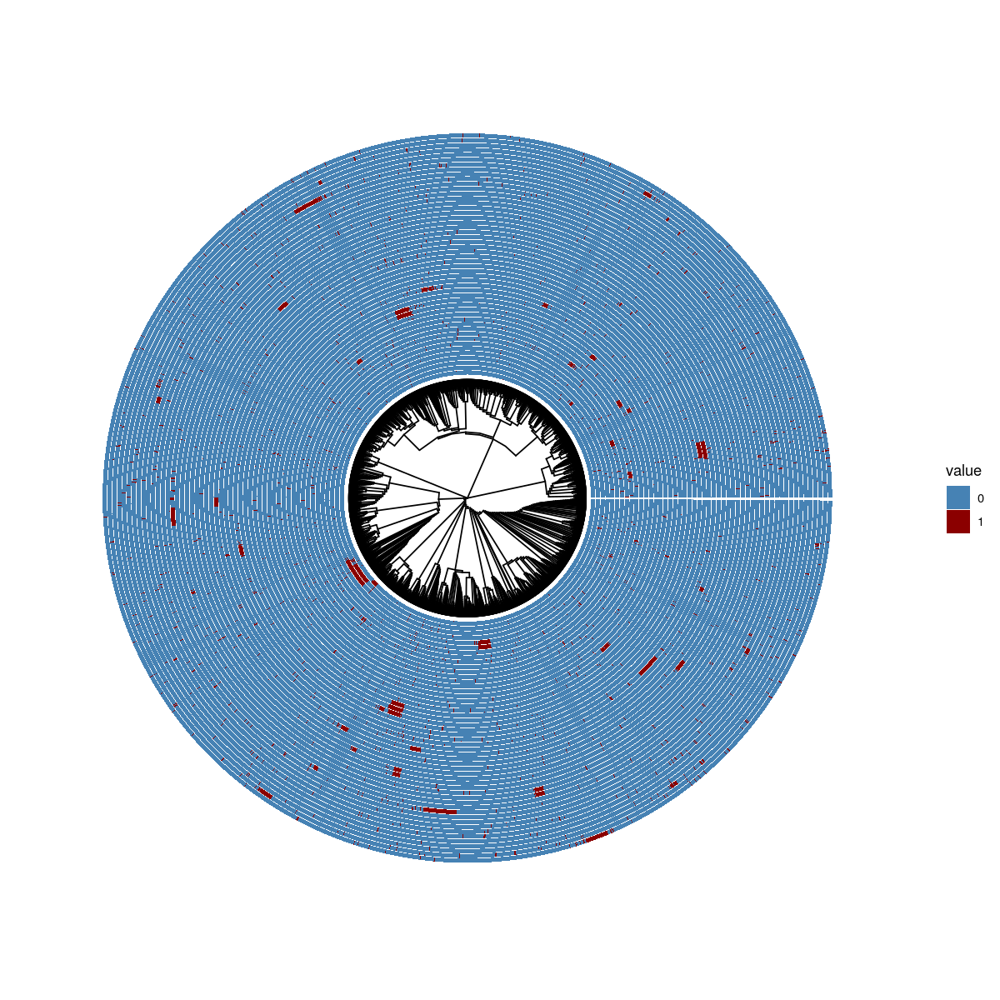

In [1443]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=120)
p2+ geom_fruit(data=Ann.tb1,mapping=aes(y=Cell,
                           x=variable,
                           fill=value),
                           geom=geom_tile,pwidth=2,width=2.5)+scale_fill_manual(values=c("steelblue","darkred"))


In [1444]:
p2.1<-p2+ geom_fruit(data=Ann.tb1,mapping=aes(y=Cell,
                           x=variable,
                           fill=value),
                           geom=geom_tile,pwidth=2,width=2.5)+scale_fill_manual(values=c("steelblue","darkred"))

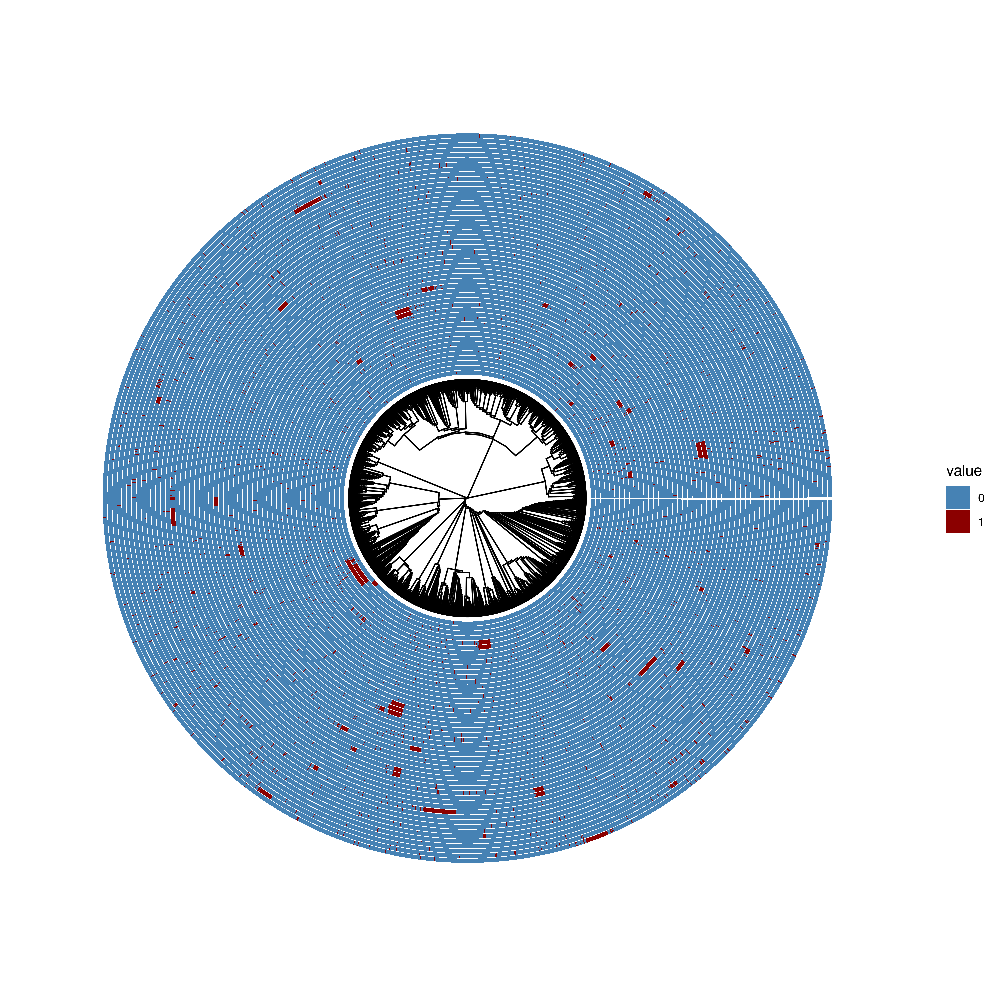

In [1446]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=300)
print(p2.1)

### Plot LSI

In [475]:
DN4_SLCT_HSC_mitoTracing.AnnTable<-Make_AnnTable(DN4_SLCT_HSC_mitoTracing.Sensitive,Donor04_HSC_Multiome_wrapper,PostTrans_from=c(2,3),PostTrans_to=c(2,1),LSI=T,PCA = T)

[1] "3991 Cells in MitoTracing object, 4107 Cells in Multiome_wrapper object --- 3893 Cells matched"


In [476]:
head(DN4_SLCT_HSC_mitoTracing.AnnTable)

,Cell,cloUMAP_1,cloUMAP_2,nCount_mitoV,clone_clusters,Mito_meanCov,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,⋯,LSI_41,LSI_42,LSI_43,LSI_44,LSI_45,LSI_46,LSI_47,LSI_48,LSI_49,LSI_50
,<chr>,<dbl>,<dbl>,<dbl>,<fct>,<dbl>,<dbl>,<int>,<dbl>,<int>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
AAACAAGCACATTGTC_1,AAACAAGCACATTGTC_1,1.588689,3.3537898,16,5,74.74682,2664,1373,35552,14086,⋯,0.37571345,0.43366054,0.3428199,-0.84755773,0.890737220,-0.7526547,0.83433510,-0.237370098,0.383085419,-0.76388883
AAACAAGCACCTCGAC_2,AAACAAGCACCTCGAC_2,-1.155751,-4.1163079,12,1,47.40672,3555,2016,18492,8735,⋯,0.05546344,-0.03879791,-1.9776142,0.05042012,-0.559849860,-1.0756231,-0.38947677,0.575996282,1.137559413,-1.12235897
AAACCAGGTTAGCCAT_1,AAACCAGGTTAGCCAT_1,-2.431241,-0.1444897,12,9,63.90531,5366,2202,29607,12383,⋯,0.21026015,-1.03766730,0.6481705,-0.42129669,0.003509473,0.3036058,-0.51207936,-1.074436112,-0.894798851,-1.17159210
AAACCGCCAAGTCCTT_1,AAACCGCCAAGTCCTT_1,-4.090358,2.0383796,4,28,15.61856,5037,2129,8805,4279,⋯,0.02103429,-0.53514271,0.1585730,0.21297918,0.599353995,-0.1318075,-0.18822076,0.204399443,0.518829455,-0.02843342
AAACCGCCAATAGCAT_1,AAACCGCCAATAGCAT_1,-14.955478,-4.5254213,2,14,63.88509,3855,1803,24233,10397,⋯,1.03560666,0.04917376,-0.4541374,-0.61597974,0.527222166,0.3177551,-0.02730175,-0.278331741,0.610754109,0.19077408
AAACCGCCACCATGCC_1,AAACCGCCACCATGCC_1,6.018254,-1.2776281,2,0,25.48518,10853,3816,14235,6458,⋯,-0.49669765,-0.12399003,-0.0377407,0.33509814,-0.092742893,-0.1975383,0.23732296,0.009640483,-0.005127871,-0.05391485


[1] "fill"
attr(,"class")
[1] "new_aes"

Warning message:
“Ignoring unknown parameters: width, orientation”
Scale for 'fill' is already present. Adding another scale for 'fill', which
will replace the existing scale.



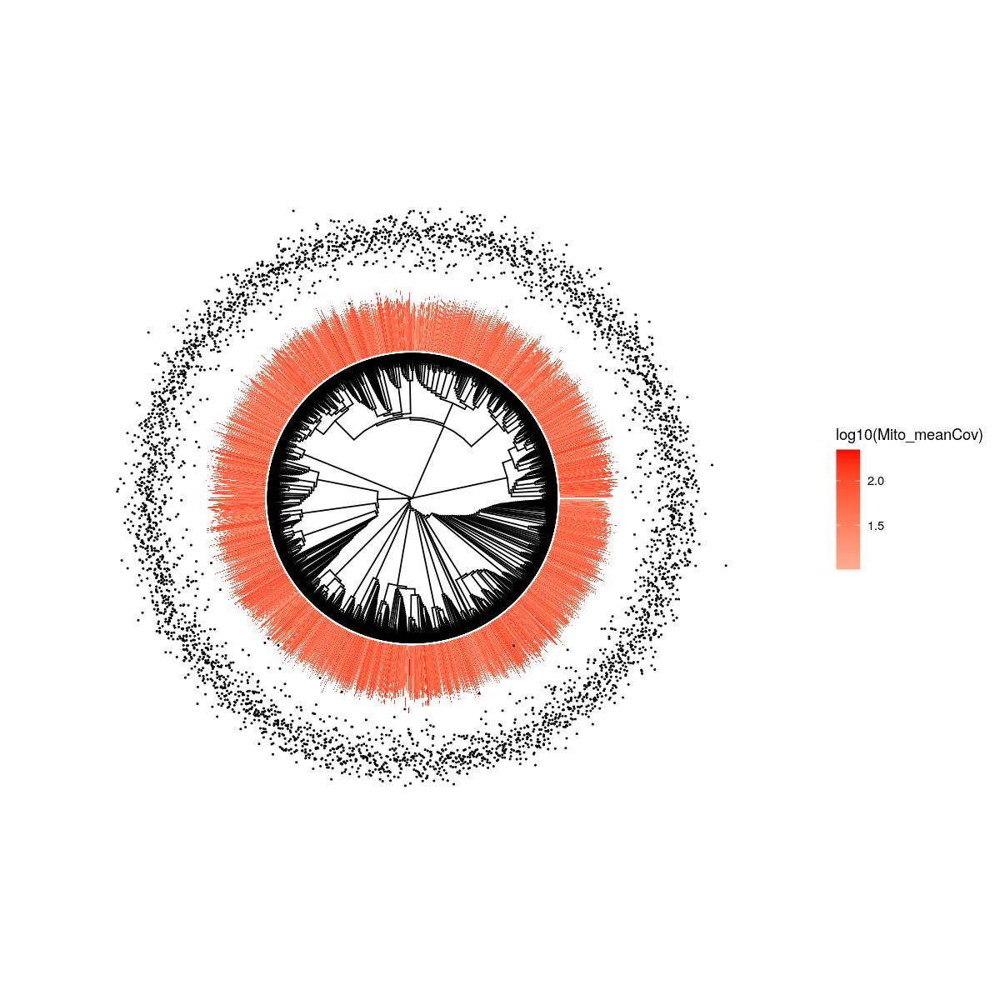

In [487]:
options(repr.plot.width=10,repr.plot.height=10,repr.plot.res=120)
p<-ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata, layout="circular", branch.length='none')
p1<-p+ geom_fruit(
         data=DN4_SLCT_HSC_mitoTracing.AnnTable,
         geom=geom_bar,
         mapping=aes(y=Cell,x=log10(Mito_meanCov),fill=log10(Mito_meanCov)),
         pwidth=0.5,
         width=1,
         offset=0.02,
         orientation="y",
         stat="identity"
     )+scale_fill_gradient2(high="red",mid="white",low="steelblue")

ggnewscale::new_scale_fill() 
p1+ geom_fruit(
         data=DN4_SLCT_HSC_mitoTracing.AnnTable,
         geom=geom_point,
         mapping=aes(y=Cell,x=PC_1),
         pwidth=0.8,
         width=15,
         offset=0.3,
         orientation="y",
         stat="identity",size=0.2
     )+scale_fill_gradient2(high="red",mid="white",low="steelblue")


<blockquote>groupClade, or add a feature column into the tree can be used to color the tree edges<br>geom_cladelab can label the clad at the end </blockquote>

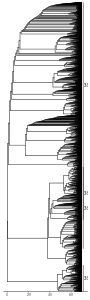

In [587]:
options(repr.plot.width=3,repr.plot.height=10,repr.plot.res=30)
dt<-data.frame(node=c(3927,3928,3929,3930),name=c("3927","3928","3929","3930"))
ggtree(DN4_SLCT_HSC_w_jaccard.njtree@treedata,branch.length = "none")+geom_cladelab(data=dt,mapping=aes(node=node,label=name))+theme_tree2()

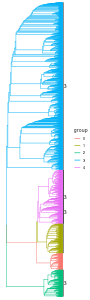

In [588]:
tree2 <- groupClade(DN4_SLCT_HSC_w_jaccard.njtree@treedata, c(3927,3928,3929,3930))
options(repr.plot.width=3,repr.plot.height=10,repr.plot.res=30)
ggtree(tree2,branch.length = "none",aes(color=group))+geom_cladelab(data=dt,mapping=aes(node=node,label=name))

### Node based differential analysis

In [645]:
# Define a function to make a list, each contains the cell names for a node 
Make_Cells4Nodes<-function(tr=DN4_SLCT_HSC_w_jaccard.njtree@phylo,
min.node.size=10, # Minimum # tips in the node to be included
max.node.fra=0.33){ # The up limit of the node size(Fraction of all tips) to be considered
max.node.size<-as.integer(length(tr$tip.label)*max.node.fra)
AllDes.list<-Descendants(tr, type = "tips")     
NodeSizes<-sapply(AllDes.list,length)
InterestNode<-which(NodeSizes> min.node.size& NodeSizes<max.node.size)
head(InterestNode)
Tips4Nodes.List<-Descendants(tr, node=InterestNode,type = "tips")
Cells4Nodes<-lapply(Tips4Nodes.List,function(x){tr$tip.label[x]})
names(Cells4Nodes)<-InterestNode    
return(Cells4Nodes)    
}

In [535]:
 # This returns a list each includes all tips for a given nodes

[1] 1294

In [646]:
DN4_SLCT_HSC_Cells4Nodes<-Make_Cells4Nodes(tr=DN4_SLCT_HSC_w_jaccard.njtree@phylo,min.node.size=10,max.node.fra=0.33)

In [647]:
length(DN4_SLCT_HSC_Cells4Nodes)

[1] 785

- Read the DN4 HSC reclustering

In [577]:
Donor04_HSC_Multiome_wrapper<-readRDS("/lab/solexa_weissman/cweng/Projects/MitoTracing_Velocity/SecondaryAnalysis/Donor4Donor9/RDS/Donor04_HSC_Multiome_wrapper.RDS")

- Figure out the clone0 and clone1

In [606]:
Donor04_HSC_Multiome_wrapper@reductions$umap.rna@cell.embeddings %>% dim

[1] 4107    2

In [607]:
DN4_HSC_mitoTracing.Sensitive@Seurat@assays

list()

,orig.ident.x,nCount_mitoV,nFeature_mitoV,mitoV_snn_res.0.6,seurat_clusters.x,Cell,meanCov,orig.ident.y,nCount_RNA,nFeature_RNA,nCount_ATAC,nFeature_ATAC,nCount_SCT,nFeature_SCT,SCT.weight,ATAC.weight,wsnn_res.0.8,seurat_clusters.y,CellType,Label
,<fct>,<dbl>,<int>,<fct>,<fct>,<chr>,<dbl>,<fct>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<fct>,<fct>,<fct>,<chr>
AAACAAGCACATTGTC_1,SeuratProject,16,16,5,5,AAACAAGCACATTGTC_1,74.74682,SeuratProject,2664,1373,35552,14086,4830,1388,0.4932988,0.5067012,0,0,HSC,HSC
AAACAAGCACCTCGAC_2,SeuratProject,12,12,1,1,AAACAAGCACCTCGAC_2,47.40672,SeuratProject,3555,2016,18492,8735,4483,2017,0.5287142,0.4712858,2,2,HSC,HPC
AAACCAGGTTAGCCAT_1,SeuratProject,12,12,9,9,AAACCAGGTTAGCCAT_1,63.90531,SeuratProject,5366,2202,29607,12383,5367,2202,0.6139536,0.3860464,4,4,HSC,HSC
AAACCGCCAAGTCCTT_1,SeuratProject,4,4,28,28,AAACCGCCAAGTCCTT_1,15.61856,SeuratProject,5037,2129,8805,4279,5171,2128,0.2623231,0.7376769,4,4,HSC,HSC
AAACCGCCAATAGCAT_1,SeuratProject,2,2,14,14,AAACCGCCAATAGCAT_1,63.88509,SeuratProject,3855,1803,24233,10397,4763,1803,0.4080758,0.5919242,0,0,HSC,HSC
AAACCGCCACCATGCC_1,SeuratProject,2,2,0,0,AAACCGCCACCATGCC_1,25.48518,SeuratProject,10853,3816,14235,6458,6471,3364,0.6276085,0.3723915,2,2,HSC,HSC


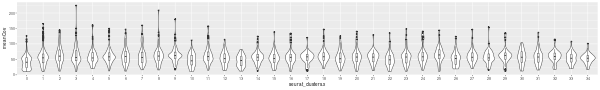

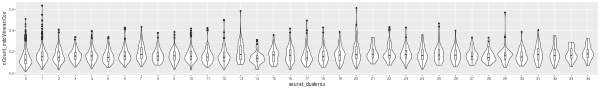

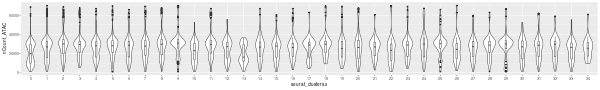

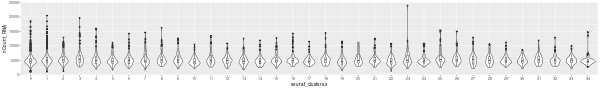